<div style="width: 100%; clear: both;">
<div style="float: left; width: 50%;">
<img src="http://www.uoc.edu/portal/_resources/common/imatges/marca_UOC/UOC_Masterbrand.jpg", align="left">
</div>
<div style="float: right; width: 50%;">
<p style="margin: 0; padding-top: 22px; text-align:right;"> Iñigo Alvarez Bianchi
<p style="margin: 0; padding-top: 5px; text-align:right;">M2.878 · TFM · PEC3: Diseño e implementación del trabajo</p>
<p style="margin: 0; text-align:right;">2021-2 · Máster universitario en Ciencia de datos (Data science)</p>
<p style="margin: 0; text-align:right; padding-button: 100px;">Estudios de Informática, Multimedia y Telecomunicación</p>
</div>
</div>
<div style="width:100%;">&nbsp;</div>

# Trabajo de Final del Máster universitario en Ciencia de Datos
## Predicción de potenciales compradores en un ecommerce


#### Importo las libresrías que voy a usar

In [392]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as pltl
import seaborn as sns
from collections import Counter
#from pandas_profiling import ProfileReport
from sklearn.model_selection import train_test_split, GridSearchCV, RepeatedStratifiedKFold
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OrdinalEncoder, OneHotEncoder
from sklearn.feature_selection import SelectKBest, chi2, RFECV
from scipy.stats import chi2_contingency
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline

from sklearn.dummy import DummyClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, f1_score, recall_score
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier

from imblearn.combine import SMOTETomek, SMOTEENN
from imblearn.over_sampling import RandomOverSampler, SMOTE, BorderlineSMOTE, SVMSMOTE, ADASYN
from imblearn.under_sampling import RandomUnderSampler, NearMiss, CondensedNearestNeighbour, TomekLinks
from imblearn.under_sampling import EditedNearestNeighbours, OneSidedSelection, NeighbourhoodCleaningRule

import dill

%matplotlib inline

# Carga de los datasets

Cargo los archivos de datos, los compruebo, les hago una preparación básica y los junto en un sólo DataFrame.

In [2]:
#from google.colab import drive
#drive.mount('/content/drive')

## USUARIOS

Datos del registro de usuarios

In [3]:
usuariosDF = pd.read_csv('/Users/inigoab/Documents/DS_UOC/TFM/Potenciales_Compradores_ecommerce/Linea1-Usuarios.txt',
    sep=";", decimal=",", encoding = "ISO-8859-1")

#usuariosDF = pd.read_csv("./drive/MyDrive/Potenciales Compradores ecommerce/Linea1-Usuarios.txt", 
#                         sep=";", decimal=",", encoding = "ISO-8859-1")

In [4]:
usuariosDF.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 367705 entries, 0 to 367704
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   IDUSUARIO         367705 non-null  float64
 1   TIPOUSUARIO       367705 non-null  object 
 2   FEC_REGISTRO      367705 non-null  object 
 3   CANAL_REGISTRO    360171 non-null  float64
 4   IND_CLIENTE       367705 non-null  int64  
 5   IND_ALTA          367705 non-null  int64  
 6   TIPOEMAIL         367705 non-null  object 
 7   BONDAD_EMAIL      367705 non-null  int64  
 8   USU_TELF          367639 non-null  object 
 9   IPCASOS           367705 non-null  int64  
 10  IP_Country        345941 non-null  object 
 11  IP_Area           345941 non-null  object 
 12  USU_TIPO          84114 non-null   object 
 13  USU_TAMANIO       84116 non-null   object 
 14  USU_CIIU          84116 non-null   object 
 15  USU_ESTADO        84116 non-null   object 
 16  USU_DEPARTAMENTO  90

In [5]:
usuariosDF.head()

,IDUSUARIO,TIPOUSUARIO,FEC_REGISTRO,CANAL_REGISTRO,IND_CLIENTE,IND_ALTA,TIPOEMAIL,BONDAD_EMAIL,USU_TELF,IPCASOS,IP_Country,IP_Area,USU_TIPO,USU_TAMANIO,USU_CIIU,USU_ESTADO,USU_DEPARTAMENTO,FEC_CLIENTE,FEC_ALTA
0,8107310.0,PF,22/10/2019 0:00:00,3.0,0,0,yahoo.com,0,233XXXXX,1,Colombia,America,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,7784565.0,PJ,14/5/2019 0:00:00,3.0,0,0,gmail.com,20,633XXXXX,1,Colombia,America,SOCIEDAD COMERCIAL/INDUSTRIAL,PQ,N7820,ACTIVA,QUINDIO,NaN,NaN
2,7718778.0,PJ,9/4/2019 0:00:00,7.0,0,0,hotmail.com,20,533XXXXX,1,Colombia,America,SOCIEDAD COMERCIAL/INDUSTRIAL,MC,G4774,ACTIVA,ATLANTICO,NaN,NaN
3,7952765.0,PX,12/8/2019 0:00:00,3.0,0,0,uqvirtual.edu.co,20,633XXXXX,1,Colombia,America,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,7855424.0,PJ,21/6/2019 0:00:00,7.0,0,0,hotmail.com,20,533XXXXX,1,Colombia,America,EMPRESARIO INDIVIDUAL,MC,N8299,CANCELACIÓN,ATLANTICO,NaN,NaN


In [6]:
usuariosDF[['FEC_REGISTRO',
            'FEC_CLIENTE',
            'FEC_ALTA']] = usuariosDF[['FEC_REGISTRO', 
                                       'FEC_CLIENTE', 
                                       'FEC_ALTA']].apply(pd.to_datetime)

usuariosDF[['IDUSUARIO']] = usuariosDF[['IDUSUARIO']].astype(int).astype(str)

## CONSUMOS

Consumos promocionales realizados por usuarios

In [7]:
consumosDF = pd.read_csv('/Users/inigoab/Documents/DS_UOC/TFM/Potenciales_Compradores_ecommerce/Linea1-Consumos_Promocionales.txt',
    sep=";", decimal=",", encoding = "ISO-8859-1")

#consumosDF = pd.read_csv("./drive/MyDrive/Potenciales Compradores ecommerce/Linea1-Consumos Promocionales.txt", 
#                         sep=";", decimal=",", encoding = "ISO-8859-1")

Elimino los dos campos que el enunciado indica se indica que no hay que usar.

In [8]:
consumosDF.drop(columns=['IDGRUPOPROD', 'DESCGRUPOPROD'], inplace=True)

In [9]:
consumosDF.head()

,IDCONSUMO,IDUSUARIO,IDPRODUCTO,DESCPRODUCTO,FECHACONSUMO,EMPCONSUL_ID,EMPCONSUL_CIIU,EMPCONSUL_PROV,EMPCONSUL_EST
0,40057306.0,6868835.0,144920.0,Perfil Promocional,1/1/2018 0:00:00,986515,H4921,ATLANTICO,ACTIVA
1,40057715.0,6868838.0,144920.0,Perfil Promocional,1/1/2018 0:00:00,102614,N8121,BOGOTA,ACTIVA
2,40057758.0,6868841.0,144920.0,Perfil Promocional,1/1/2018 0:00:00,915924,S9609,BOGOTA,ACTIVA
3,40057765.0,6868844.0,144920.0,Perfil Promocional,1/1/2018 0:00:00,3830723,G4642,BOGOTA,ACTIVA
4,40057767.0,6868841.0,144917.0,Ficha Básica,1/1/2018 0:00:00,2971771,P8544,BOGOTA,ACTIVA


In [10]:
consumosDF[['IDPRODUCTO']] = consumosDF[['IDPRODUCTO']].astype(int).astype(str)
consumosDF[['IDCONSUMO']] = consumosDF[['IDCONSUMO']].astype(int).astype(str)
consumosDF[['IDUSUARIO']] = consumosDF[['IDUSUARIO']].astype(int).astype(str)

consumosDF['FECHACONSUMO'] =  pd.to_datetime(consumosDF['FECHACONSUMO'])

Añado a este dataset las fechas en las que los usuarios se hacen clientes

In [11]:
consumosDF.insert(2, 'FEC_CLIENTE', consumosDF['IDUSUARIO'].map(usuariosDF.set_index('IDUSUARIO')['FEC_CLIENTE']))
consumosDF[consumosDF['FEC_CLIENTE'].notnull()].head()

,IDCONSUMO,IDUSUARIO,FEC_CLIENTE,IDPRODUCTO,DESCPRODUCTO,FECHACONSUMO,EMPCONSUL_ID,EMPCONSUL_CIIU,EMPCONSUL_PROV,EMPCONSUL_EST
382,40068583,6869752,2020-09-30,144917,Ficha Básica,2018-02-01,3597384,H5221,BOGOTA,ACTIVA
384,40068664,6869761,2018-02-01,144920,Perfil Promocional,2018-02-01,2857218,C2819,BOGOTA,ACTIVA
394,40069063,6869761,2018-02-01,144917,Ficha Básica,2018-02-01,983852,G4754,ATLANTICO,LEY DE INSOLVENCIA (REORGANIZACION EMPRESARIAL)
395,40069077,6869761,2018-02-01,144917,Ficha Básica,2018-02-01,2857218,C2819,BOGOTA,ACTIVA
397,40069177,6869802,2018-03-01,144917,Ficha Básica,2018-02-01,970999,J6202,BOGOTA,ACTIVA


In [12]:
consumosDF[consumosDF['FEC_CLIENTE'] < consumosDF['FECHACONSUMO']]

,IDCONSUMO,IDUSUARIO,FEC_CLIENTE,IDPRODUCTO,DESCPRODUCTO,FECHACONSUMO,EMPCONSUL_ID,EMPCONSUL_CIIU,EMPCONSUL_PROV,EMPCONSUL_EST
2062,40105110,6873624,2018-04-30,144920,Perfil Promocional,2018-05-01,374863,C2511,VALLE,ACTIVA
2983,40121009,6873020,2018-05-02,144920,Perfil Promocional,2018-08-01,1576337,J6209,BOGOTA,ACTIVA
3624,40130890,6876844,2018-01-15,144920,Perfil Promocional,2018-09-01,3455346,G4651,CUNDINAMARCA,ACTIVA
4605,40148910,6878961,2018-06-02,144920,Perfil Promocional,2018-10-01,916567,K6499,BOGOTA,ACTIVA
5602,40166323,6876844,2018-01-15,144917,Ficha Básica,2018-11-01,915197,C3110,CUNDINAMARCA,LEY DE INSOLVENCIA (REORGANIZACION EMPRESARIAL)
...,...,...,...,...,...,...,...,...,...,...
794677,58741666,7682120,2020-03-09,144917,Ficha Básica,2020-08-23,3415683,C1812,ANTIOQUIA,ACTIVA
794678,58745226,7682120,2020-03-09,144917,Ficha Básica,2020-08-23,3415683,C1812,ANTIOQUIA,ACTIVA
794980,59123301,7952617,2020-10-11,144917,Ficha Básica,2020-11-09,1232072,C1811,VALLE,ACTIVA
794983,59128242,7952617,2020-10-11,144917,Ficha Básica,2020-11-09,584373,M6920,VALLE,CANCELACION


Veo que hay 717 filas de consumos posteriores a la fecha de alta como cliente que, como indica el enunciado, no resultan relevantes así que se pueden eliminar.

In [13]:
consumosDF.drop(consumosDF[consumosDF['FEC_CLIENTE'] < consumosDF['FECHACONSUMO']].index, inplace=True)

In [14]:
len(consumosDF[consumosDF['FEC_CLIENTE'] < consumosDF['FECHACONSUMO']])

0

In [15]:
consumos_fechas = pd.concat([consumosDF.groupby(['IDUSUARIO'])['FECHACONSUMO'].min(), 
                             consumosDF.groupby(['IDUSUARIO'])['FECHACONSUMO'].max()], 
                            axis=1, keys=('primer_consumo','último_consumo')).reset_index()

consumos_fechas

,IDUSUARIO,primer_consumo,último_consumo
0,6868835,2018-01-01,2018-01-01
1,6868838,2018-01-01,2018-01-01
2,6868841,2018-01-01,2018-01-01
3,6868844,2018-01-01,2018-01-01
4,6868847,2018-01-01,2018-01-01
...,...,...,...
367633,8250344,2019-12-31,2019-12-31
367634,8250350,2019-12-31,2019-12-31
367635,8250356,2019-12-31,2019-12-31
367636,8250359,2019-12-31,2019-12-31


In [16]:
consumosDF.groupby(['IDUSUARIO'])['DESCPRODUCTO'].value_counts().unstack(fill_value=0)\
    .sort_values(by='Ficha Básica')

DESCPRODUCTO,Ficha Básica,Perfil Promocional
IDUSUARIO,,
6868835,0,1
7718639,0,1
7718636,0,1
7718630,0,1
7718624,0,1
...,...,...
6977819,1085,0
7805198,1659,1
7542443,2062,0


In [17]:
consumosDF.groupby(['IDUSUARIO','DESCPRODUCTO']).size().unstack(fill_value=0)\
    .sort_values(by='Perfil Promocional')

DESCPRODUCTO,Ficha Básica,Perfil Promocional
IDUSUARIO,,
7592780,1,0
7265523,1,0
7710896,1,0
7604300,1,0
7710905,1,0
...,...,...
7192703,6,5
8097673,5,5
7192712,5,5


In [18]:
consumosDF.groupby(['IDUSUARIO','DESCPRODUCTO'])['EMPCONSUL_EST'].value_counts()\
  .unstack('DESCPRODUCTO',fill_value=0)

DESCPRODUCTO             Ficha Básica  Perfil Promocional
IDUSUARIO EMPCONSUL_EST                                  
6868835   ACTIVA                    0                   1
6868838   ACTIVA                    0                   1
6868841   ACTIVA                    3                   2
          CANCELACION               1                   1
6868844   ACTIVA                    0                   1
...                               ...                 ...
8250344   ACTIVA                    0                   1
8250350   ACTIVA                    0                   1
8250356   ACTIVA                    0                   1
8250359   ACTIVA                    0                   1
8250362   ACTIVA                    0                   1

[402876 rows x 2 columns]

In [19]:
consumosDF['DESCPRODUCTO'].value_counts()

Perfil Promocional    424032
Ficha Básica          371988
Name: DESCPRODUCTO, dtype: int64

In [20]:
consumosDF['EMPCONSUL_EST'].value_counts()

ACTIVA                                              656798
CANCELACION                                          81575
LIQUIDACION                                          35595
LEY DE INSOLVENCIA (REORGANIZACION EMPRESARIAL)       8475
EXTINGUIDA                                            6379
INACTIVA TEMPORAL                                     3079
REESTRUCTURACION O CONCORDATO                          434
INTERVENIDA                                            430
COINCIDENCIA HOMOGRAFA LISTA CLINTON (SDNT OFAC)        98
ABSORBIDA                                               19
ANULACIËN LIQUIDACIËN                                   17
SALIDA CLINTON (SDNT OFAC)                               7
DISUELTA                                                 3
Name: EMPCONSUL_EST, dtype: int64

In [21]:
consumosDF.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 796020 entries, 0 to 796736
Data columns (total 10 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   IDCONSUMO       796020 non-null  object        
 1   IDUSUARIO       796020 non-null  object        
 2   FEC_CLIENTE     12752 non-null   datetime64[ns]
 3   IDPRODUCTO      796020 non-null  object        
 4   DESCPRODUCTO    796020 non-null  object        
 5   FECHACONSUMO    796020 non-null  datetime64[ns]
 6   EMPCONSUL_ID    796020 non-null  int64         
 7   EMPCONSUL_CIIU  792909 non-null  object        
 8   EMPCONSUL_PROV  792909 non-null  object        
 9   EMPCONSUL_EST   792909 non-null  object        
dtypes: datetime64[ns](2), int64(1), object(7)
memory usage: 66.8+ MB


In [22]:
consumosDF.isnull().sum()

IDCONSUMO              0
IDUSUARIO              0
FEC_CLIENTE       783268
IDPRODUCTO             0
DESCPRODUCTO           0
FECHACONSUMO           0
EMPCONSUL_ID           0
EMPCONSUL_CIIU      3111
EMPCONSUL_PROV      3111
EMPCONSUL_EST       3111
dtype: int64

In [23]:
consumos_agrupados = consumosDF.groupby(['IDUSUARIO',
                                         'DESCPRODUCTO']).size().unstack(fill_value=0).reset_index()
consumos_agrupados

DESCPRODUCTO,IDUSUARIO,Ficha Básica,Perfil Promocional
0,6868835,0,1
1,6868838,0,1
2,6868841,4,3
3,6868844,0,1
4,6868847,0,1
...,...,...,...
367633,8250344,0,1
367634,8250350,0,1
367635,8250356,0,1
367636,8250359,0,1


In [24]:
DF = usuariosDF.merge(consumos_agrupados, on='IDUSUARIO', how='left')\
    .merge(consumos_fechas, on='IDUSUARIO', how='left')
DF.head()

,IDUSUARIO,TIPOUSUARIO,FEC_REGISTRO,CANAL_REGISTRO,IND_CLIENTE,IND_ALTA,TIPOEMAIL,BONDAD_EMAIL,USU_TELF,IPCASOS,...,USU_TAMANIO,USU_CIIU,USU_ESTADO,USU_DEPARTAMENTO,FEC_CLIENTE,FEC_ALTA,Ficha Básica,Perfil Promocional,primer_consumo,último_consumo
0,8107310,PF,2019-10-22,3.0,0,0,yahoo.com,0,233XXXXX,1,...,NaN,NaN,NaN,NaN,NaT,NaT,0.0,1.0,2019-10-22,2019-10-22
1,7784565,PJ,2019-05-14,3.0,0,0,gmail.com,20,633XXXXX,1,...,PQ,N7820,ACTIVA,QUINDIO,NaT,NaT,0.0,1.0,2019-05-14,2019-05-14
2,7718778,PJ,2019-09-04,7.0,0,0,hotmail.com,20,533XXXXX,1,...,MC,G4774,ACTIVA,ATLANTICO,NaT,NaT,0.0,1.0,2019-09-04,2019-09-04
3,7952765,PX,2019-12-08,3.0,0,0,uqvirtual.edu.co,20,633XXXXX,1,...,NaN,NaN,NaN,NaN,NaT,NaT,0.0,1.0,2019-12-08,2019-12-08
4,7855424,PJ,2019-06-21,7.0,0,0,hotmail.com,20,533XXXXX,1,...,MC,N8299,CANCELACIÓN,ATLANTICO,NaT,NaT,0.0,1.0,2019-06-21,2019-06-21


In [25]:
DF[['Ficha Básica','Perfil Promocional']].isnull().sum()

Ficha Básica          67
Perfil Promocional    67
dtype: int64

In [26]:
DF['Ficha Básica'].fillna(0, inplace=True)
DF['Perfil Promocional'].fillna(0, inplace=True)

In [27]:
DF['Ficha Básica'] = DF['Ficha Básica'].astype(int)
DF['Perfil Promocional'] = DF['Perfil Promocional'].astype(int)

## LOGINS

In [28]:
loginsDF = pd.read_csv('/Users/inigoab/Documents/DS_UOC/TFM/Potenciales_Compradores_ecommerce/Linea1-Logins.txt',
    sep=";", decimal=",", encoding = "ISO-8859-1")

#loginsDF = pd.read_csv("./drive/MyDrive/Potenciales Compradores ecommerce/Linea1-Logins.txt", 
#                         sep=";", decimal=",", encoding = "ISO-8859-1")

In [29]:
loginsDF.head()

,IDUSUARIO,FECHALOGIN
0,7339406.0,31/8/2018 0:00:00
1,7339406.0,4/9/2018 0:00:00
2,7339406.0,4/9/2018 0:00:00
3,7966293.0,10/10/2019 0:00:00
4,7694472.0,28/3/2019 0:00:00


In [30]:
loginsDF[['IDUSUARIO']] = loginsDF[['IDUSUARIO']].astype(int).astype(str)

loginsDF['FECHALOGIN'] =  pd.to_datetime(loginsDF['FECHALOGIN'])

Al igual que con los consumos, entiendo que los logins relevantes son los previos a la fecha en la que el usuario se hace cliente así que elimino los posteriores.

In [31]:
loginsDF.insert(2, 'FEC_CLIENTE', loginsDF['IDUSUARIO'].map(usuariosDF.set_index('IDUSUARIO')['FEC_CLIENTE']))
loginsDF[loginsDF['FEC_CLIENTE'].notnull()].head()

,IDUSUARIO,FECHALOGIN,FEC_CLIENTE
0,7339406,2018-08-31,2018-04-09
1,7339406,2018-04-09,2018-04-09
2,7339406,2018-04-09,2018-04-09
2275,8042554,2019-09-23,2019-09-23
2276,8042554,2019-09-23,2019-09-23


In [32]:
loginsDF[loginsDF['FEC_CLIENTE'] < loginsDF['FECHALOGIN']]

,IDUSUARIO,FECHALOGIN,FEC_CLIENTE
0,7339406,2018-08-31,2018-04-09
3608,7535569,2019-10-01,2019-04-12
3609,7535569,2019-10-01,2019-04-12
3610,7535569,2019-12-03,2019-04-12
3613,7535569,2019-10-01,2019-04-12
...,...,...,...
614807,7072056,2019-09-05,2019-06-18
615127,7953035,2019-12-08,2019-08-14
615128,7953035,2019-12-08,2019-08-14
615137,7371523,2018-09-18,2018-07-10


In [33]:
loginsDF.drop(loginsDF[loginsDF['FEC_CLIENTE'] < loginsDF['FECHALOGIN']].index, inplace=True)

In [34]:
loginsDF.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 616894 entries, 1 to 617748
Data columns (total 3 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   IDUSUARIO    616894 non-null  object        
 1   FECHALOGIN   616894 non-null  datetime64[ns]
 2   FEC_CLIENTE  15859 non-null   datetime64[ns]
dtypes: datetime64[ns](2), object(1)
memory usage: 18.8+ MB


In [35]:
loginsDF['IDUSUARIO'].nunique()

197129

In [36]:
loginsDF.isnull().sum()

IDUSUARIO           0
FECHALOGIN          0
FEC_CLIENTE    601035
dtype: int64

In [37]:
logins_fechas = pd.concat([loginsDF.groupby(['IDUSUARIO'])['FECHALOGIN'].min(), 
                             loginsDF.groupby(['IDUSUARIO'])['FECHALOGIN'].max()], 
                            axis=1, keys=('primer_login','último_login')).reset_index()

logins_fechas

,IDUSUARIO,primer_login,último_login
0,6868713,2017-12-31,2017-12-31
1,6868722,2018-01-15,2018-01-15
2,6868736,2018-02-01,2019-07-29
3,6868739,2018-05-24,2021-01-23
4,6868742,2017-12-31,2017-12-31
...,...,...,...
197124,8250329,2020-01-07,2020-10-15
197125,8250335,2020-12-11,2020-12-11
197126,8250338,2020-10-13,2020-10-13
197127,8250341,2019-12-31,2020-02-01


In [38]:
logins_agrupados = loginsDF.groupby(
                    ['IDUSUARIO']).size().reset_index(name='N_logins')

logins_agrupados

,IDUSUARIO,N_logins
0,6868713,1
1,6868722,1
2,6868736,6
3,6868739,5
4,6868742,2
...,...,...
197124,8250329,3
197125,8250335,1
197126,8250338,3
197127,8250341,2


In [39]:
DF = DF.merge(logins_agrupados, on='IDUSUARIO', how='left')\
    .merge(logins_fechas, on='IDUSUARIO', how='left')

DF

,IDUSUARIO,TIPOUSUARIO,FEC_REGISTRO,CANAL_REGISTRO,IND_CLIENTE,IND_ALTA,TIPOEMAIL,BONDAD_EMAIL,USU_TELF,IPCASOS,...,USU_DEPARTAMENTO,FEC_CLIENTE,FEC_ALTA,Ficha Básica,Perfil Promocional,primer_consumo,último_consumo,N_logins,primer_login,último_login
0,8107310,PF,2019-10-22,3.0,0,0,yahoo.com,0,233XXXXX,1,...,NaN,NaT,NaT,0,1,2019-10-22,2019-10-22,1.0,2019-10-22,2019-10-22
1,7784565,PJ,2019-05-14,3.0,0,0,gmail.com,20,633XXXXX,1,...,QUINDIO,NaT,NaT,0,1,2019-05-14,2019-05-14,3.0,2019-08-16,2019-11-14
2,7718778,PJ,2019-09-04,7.0,0,0,hotmail.com,20,533XXXXX,1,...,ATLANTICO,NaT,NaT,0,1,2019-09-04,2019-09-04,NaN,NaT,NaT
3,7952765,PX,2019-12-08,3.0,0,0,uqvirtual.edu.co,20,633XXXXX,1,...,NaN,NaT,NaT,0,1,2019-12-08,2019-12-08,1.0,2020-10-26,2020-10-26
4,7855424,PJ,2019-06-21,7.0,0,0,hotmail.com,20,533XXXXX,1,...,ATLANTICO,NaT,NaT,0,1,2019-06-21,2019-06-21,NaN,NaT,NaT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
367700,8141168,PF,2019-06-11,1.0,0,0,hotmail.com,0,NaN,1806,...,NaN,NaT,NaT,3,2,2019-06-11,2019-06-11,1.0,2019-06-11,2019-06-11
367701,8147354,PF,2019-08-11,1.0,0,0,hotmail.com,0,NaN,1806,...,NaN,NaT,NaT,5,4,2019-08-11,2019-08-11,5.0,2019-08-11,2019-08-11
367702,8153565,PF,2019-12-11,1.0,0,0,hotmail.com,0,NaN,1806,...,NaN,NaT,NaT,5,3,2019-12-11,2019-12-11,3.0,2019-12-11,2019-12-11
367703,8169002,PF,2019-11-18,1.0,0,0,gesticobranzas.com,9,NaN,1806,...,NaN,NaT,NaT,3,1,2019-11-18,2019-11-18,1.0,2019-11-18,2019-11-18


In [40]:
DF[['N_logins']].isnull().sum()

N_logins    170625
dtype: int64

In [41]:
DF['N_logins'].fillna(0, inplace=True)

In [42]:
DF['N_logins'] = DF['N_logins'].astype(int)

Este campo que he creado se define como el número de logins realizados por cada usuario en fecha no posteior a la de hacerse cliente.

## SESIONES

In [43]:
sesionesDF = pd.read_csv('/Users/inigoab/Documents/DS_UOC/TFM/Potenciales_Compradores_ecommerce/Linea1-Sesiones.txt',
    sep=";", decimal=",", encoding = "ISO-8859-1")

#sesionesDF = pd.read_csv("./drive/MyDrive/Potenciales Compradores ecommerce/Linea1-Sesiones.txt", 
#                         sep=";", decimal=",", encoding = "ISO-8859-1")

In [44]:
sesionesDF.head()

,IDUSUARIO,FECHA_SESION,SESIONES
0,6868835.0,1/1/2018 0:00:00,3
1,6868838.0,1/1/2018 0:00:00,3
2,6868841.0,1/1/2018 0:00:00,12
3,6868844.0,1/1/2018 0:00:00,4
4,6868847.0,1/1/2018 0:00:00,3


In [45]:
sesionesDF[['IDUSUARIO']] = sesionesDF[['IDUSUARIO']].astype(int).astype(str)
sesionesDF['FECHA_SESION'] =  pd.to_datetime(sesionesDF['FECHA_SESION'])

Al igual que con los consumos, entiendo que las sesiones relevantes son las previas a la fecha en la que el usuario se hace cliente así que elimino las posteriores.

In [46]:
sesionesDF.insert(3, 'FEC_CLIENTE', sesionesDF['IDUSUARIO'].map(usuariosDF.set_index('IDUSUARIO')['FEC_CLIENTE']))
sesionesDF[sesionesDF['FEC_CLIENTE'].notnull()].head()

,IDUSUARIO,FECHA_SESION,SESIONES,FEC_CLIENTE
266,6869752,2020-09-30,24,2020-09-30
267,6869752,2018-02-01,3,2020-09-30
269,6869761,2018-02-01,10,2018-02-01
279,6869802,2018-02-01,3,2018-03-01
280,6869802,2018-03-01,3,2018-03-01


In [47]:
sesionesDF[sesionesDF['FEC_CLIENTE'] < sesionesDF['FECHA_SESION']]

,IDUSUARIO,FECHA_SESION,SESIONES,FEC_CLIENTE
1209,6873020,2018-08-01,1,2018-05-02
1399,6873624,2018-05-01,3,2018-04-30
2377,6876844,2018-09-01,3,2018-01-15
2378,6876844,2018-11-01,6,2018-01-15
3050,6878961,2018-10-01,5,2018-06-02
...,...,...,...,...
386172,8176531,2019-11-26,8,2019-01-12
386174,8176531,2019-11-21,14,2019-01-12
390871,8191801,2019-11-28,5,2019-01-12
392284,8196380,2019-11-30,5,2019-01-12


In [48]:
sesionesDF.drop(sesionesDF[sesionesDF['FEC_CLIENTE'] < sesionesDF['FECHA_SESION']].index, inplace=True)

In [49]:
sesionesDF.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 407757 entries, 0 to 408027
Data columns (total 4 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   IDUSUARIO     407757 non-null  object        
 1   FECHA_SESION  407757 non-null  datetime64[ns]
 2   SESIONES      407757 non-null  int64         
 3   FEC_CLIENTE   4165 non-null    datetime64[ns]
dtypes: datetime64[ns](2), int64(1), object(1)
memory usage: 15.6+ MB


In [50]:
sesionesDF['IDUSUARIO'].nunique()

367702

In [51]:
sesionesDF.isnull().sum()

IDUSUARIO            0
FECHA_SESION         0
SESIONES             0
FEC_CLIENTE     403592
dtype: int64

In [52]:
sesiones_fechas = pd.concat([sesionesDF.groupby(['IDUSUARIO'])['FECHA_SESION'].min(), 
                             sesionesDF.groupby(['IDUSUARIO'])['FECHA_SESION'].max()], 
                            axis=1, keys=('primera_sesión','última_sesión')).reset_index()

sesiones_fechas

,IDUSUARIO,primera_sesión,última_sesión
0,6868835,2018-01-01,2018-01-01
1,6868838,2018-01-01,2018-01-01
2,6868841,2018-01-01,2018-01-01
3,6868844,2018-01-01,2018-01-01
4,6868847,2018-01-01,2018-01-01
...,...,...,...
367697,8250344,2019-12-31,2019-12-31
367698,8250350,2019-12-31,2019-12-31
367699,8250356,2019-12-31,2019-12-31
367700,8250359,2019-12-31,2019-12-31


In [53]:
sesiones_agrupadas = sesionesDF.groupby(
    ['IDUSUARIO'])['SESIONES'].sum().reset_index(name='N_sesiones')
sesiones_agrupadas.head()

,IDUSUARIO,N_sesiones
0,6868835,3
1,6868838,3
2,6868841,12
3,6868844,4
4,6868847,3


In [54]:
DF = DF.merge(sesiones_agrupadas, on='IDUSUARIO', how='left')\
    .merge(sesiones_fechas, on='IDUSUARIO', how='left')

DF

,IDUSUARIO,TIPOUSUARIO,FEC_REGISTRO,CANAL_REGISTRO,IND_CLIENTE,IND_ALTA,TIPOEMAIL,BONDAD_EMAIL,USU_TELF,IPCASOS,...,Ficha Básica,Perfil Promocional,primer_consumo,último_consumo,N_logins,primer_login,último_login,N_sesiones,primera_sesión,última_sesión
0,8107310,PF,2019-10-22,3.0,0,0,yahoo.com,0,233XXXXX,1,...,0,1,2019-10-22,2019-10-22,1,2019-10-22,2019-10-22,5.0,2019-10-22,2019-10-22
1,7784565,PJ,2019-05-14,3.0,0,0,gmail.com,20,633XXXXX,1,...,0,1,2019-05-14,2019-05-14,3,2019-08-16,2019-11-14,3.0,2019-05-14,2019-05-14
2,7718778,PJ,2019-09-04,7.0,0,0,hotmail.com,20,533XXXXX,1,...,0,1,2019-09-04,2019-09-04,0,NaT,NaT,3.0,2019-09-04,2019-09-04
3,7952765,PX,2019-12-08,3.0,0,0,uqvirtual.edu.co,20,633XXXXX,1,...,0,1,2019-12-08,2019-12-08,1,2020-10-26,2020-10-26,3.0,2019-12-08,2019-12-08
4,7855424,PJ,2019-06-21,7.0,0,0,hotmail.com,20,533XXXXX,1,...,0,1,2019-06-21,2019-06-21,0,NaT,NaT,3.0,2019-06-21,2019-06-21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
367700,8141168,PF,2019-06-11,1.0,0,0,hotmail.com,0,NaN,1806,...,3,2,2019-06-11,2019-06-11,1,2019-06-11,2019-06-11,9.0,2019-06-11,2019-06-11
367701,8147354,PF,2019-08-11,1.0,0,0,hotmail.com,0,NaN,1806,...,5,4,2019-08-11,2019-08-11,5,2019-08-11,2019-08-11,14.0,2019-08-11,2019-08-11
367702,8153565,PF,2019-12-11,1.0,0,0,hotmail.com,0,NaN,1806,...,5,3,2019-12-11,2019-12-11,3,2019-12-11,2019-12-11,14.0,2019-12-11,2019-12-11
367703,8169002,PF,2019-11-18,1.0,0,0,gesticobranzas.com,9,NaN,1806,...,3,1,2019-11-18,2019-11-18,1,2019-11-18,2019-11-18,8.0,2019-11-18,2019-11-18


In [55]:
DF[['N_sesiones']].isnull().sum()

N_sesiones    3
dtype: int64

In [56]:
DF['N_sesiones'].fillna(0, inplace=True)

In [57]:
DF['N_sesiones'] = DF['N_sesiones'].astype(int)

In [58]:
## VENTAS

In [59]:
'''
ventasDF = pd.read_csv(
    '/Users/inigoab/Documents/DS_UOC/TFM/Potenciales_Compradores_ecommerce/Linea1-Ventas.txt',
    sep=";", decimal=",", encoding = "ISO-8859-1")

ventasDF[['FECHAVENTA']] = ventasDF['FECHAVENTA'].apply(pd.to_datetime)
ventasDF[['IDVENTA','ID_USUARIO']] = ventasDF[['IDVENTA','ID_USUARIO']].astype(int).astype(str)
ventasDF[['IMPORTES']] = ventasDF[['IMPORTES']].astype(int)
ventasDF.loc[:,('VP Informe',
                'BONO', 
                'SUSCRIPCION', 
                'VP Listado')] = ventasDF.loc[:,('VP Informe',
                                                 'BONO', 
                                                 'SUSCRIPCION', 
                                                 'VP Listado')].fillna(0)

ventasDF.head()

'''

'\nventasDF = pd.read_csv(\n    \'/Users/inigoab/Documents/DS_UOC/TFM/Potenciales_Compradores_ecommerce/Linea1-Ventas.txt\',\n    sep=";", decimal=",", encoding = "ISO-8859-1")\n\nventasDF[[\'FECHAVENTA\']] = ventasDF[\'FECHAVENTA\'].apply(pd.to_datetime)\nventasDF[[\'IDVENTA\',\'ID_USUARIO\']] = ventasDF[[\'IDVENTA\',\'ID_USUARIO\']].astype(int).astype(str)\nventasDF[[\'IMPORTES\']] = ventasDF[[\'IMPORTES\']].astype(int)\nventasDF.loc[:,(\'VP Informe\',\n                \'BONO\', \n                \'SUSCRIPCION\', \n                \'VP Listado\')] = ventasDF.loc[:,(\'VP Informe\',\n                                                 \'BONO\', \n                                                 \'SUSCRIPCION\', \n                                                 \'VP Listado\')].fillna(0)\n\nventasDF.head()\n\n'

# Exploración y preparación de los datos

## Desbalanceo

Miro cómo están distribuidas las clases. El número de clientes que hay respecto al número de usuarios y las proporciones.

Class= 0, Count= 365086, Percentage= 99.29%
Class= 1, Count= 2619, Percentage= 0.71%


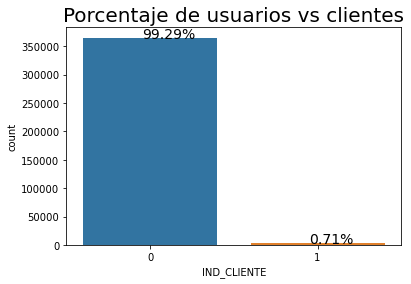

In [60]:
counter = Counter(DF['IND_CLIENTE'].values)

for k,v in counter.items():
    per = v / sum(counter.values()) * 100
    print('Class= %d, Count= %d, Percentage= %.2f%%' % (k, v, per))

    
ax = sns.countplot(x="IND_CLIENTE", data=DF)
plt.title('Porcentaje de usuarios vs clientes', fontsize=20)
total = len(usuariosDF['IND_CLIENTE'])
for p in ax.patches:
    percentage = '{:.2f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width() / 2 - 0.05
    y = p.get_y() + p.get_height()
    ax.annotate(percentage, (x, y), size = 14)

plt.show()

In [61]:
# Tomo esta tasa de conversión como la de referencia
r_conversion = list(counter.values())[1]/ sum(counter.values())

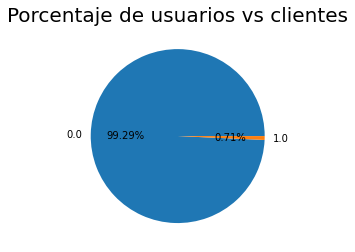

In [62]:
plt.pie([float(v) for v in counter.values()], labels=[float(k) for k in counter],
           autopct='%1.2f%%')
plt.title('Porcentaje de usuarios vs clientes', fontsize=20)
plt.show()

## Fechas

Hago una exploración de las fechas de registro y de cliente.

In [63]:
DF.select_dtypes('datetime').max()

FEC_REGISTRO     2019-12-31
FEC_CLIENTE      2021-04-01
FEC_ALTA         2021-11-01
primer_consumo   2021-05-01
último_consumo   2021-12-01
primer_login     2021-12-06
último_login     2021-12-06
primera_sesión   2019-12-31
última_sesión    2022-12-01
dtype: datetime64[ns]

In [64]:
print('{} usuarios se registraron con fecha previa a ser clientes,\
 {} con fecha posterior y {} en la misma fecha.'.format(
    len(DF[usuariosDF['FEC_REGISTRO'] < DF['FEC_CLIENTE']]),
    len(DF[usuariosDF['FEC_REGISTRO'] > DF['FEC_CLIENTE']]),
    len(DF[usuariosDF['FEC_REGISTRO'] == DF['FEC_CLIENTE']])))

1057 usuarios se registraron con fecha previa a ser clientes, 161 con fecha posterior y 1395 en la misma fecha.


In [65]:
DF[['FEC_REGISTRO', 'FEC_CLIENTE']].sort_values(by='FEC_CLIENTE', ascending=False)

,FEC_REGISTRO,FEC_CLIENTE
39887,2019-01-16,2021-04-01
317034,2019-02-14,2021-01-22
205286,2019-04-04,2021-01-22
337114,2019-04-17,2021-01-22
92079,2018-06-08,2021-01-22
...,...,...
367700,2019-06-11,NaT
367701,2019-08-11,NaT
367702,2019-12-11,NaT
367703,2019-11-18,NaT


Muestro en unos gráficos temporales la evolución semanal de los registros y de los nuevos clientes.

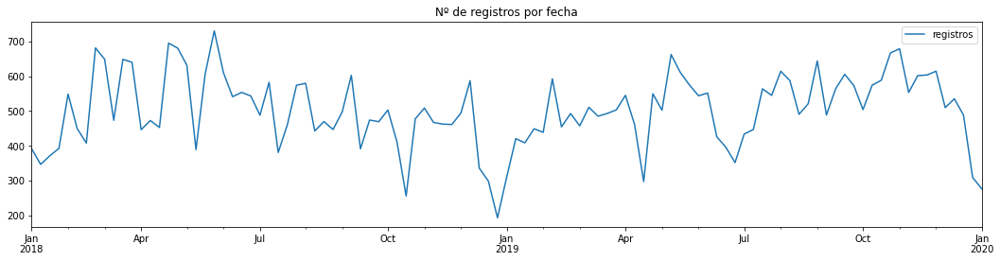

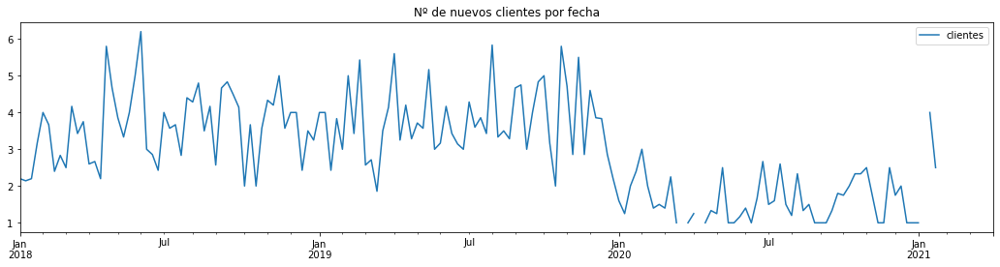

In [66]:
DF['FEC_REGISTRO'].value_counts().to_frame('registros').resample('W').mean()\
    .plot(figsize=(18, 4), title='Nº de registros por fecha')
DF['FEC_CLIENTE'].value_counts().to_frame('clientes').resample('W').mean()\
    .plot(figsize=(18, 4), title='Nº de nuevos clientes por fecha')

plt.show()

Repito los gráficos temporales anteriores pero esta vez quitando a los que se hicieron clientes el mismo día del registro. También quito los que se hicieron clientes antes de registrarse ya que no parece una situación normal ni representativa.

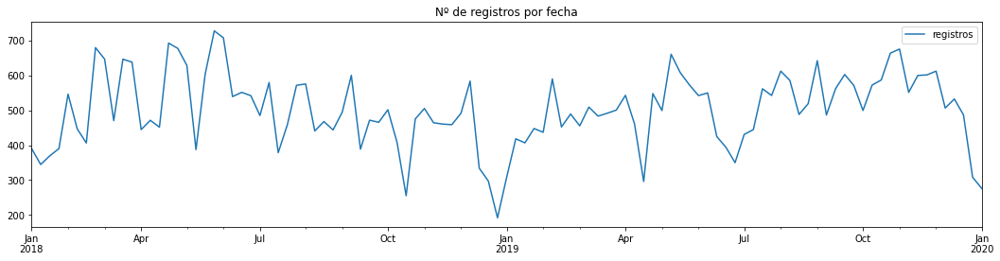

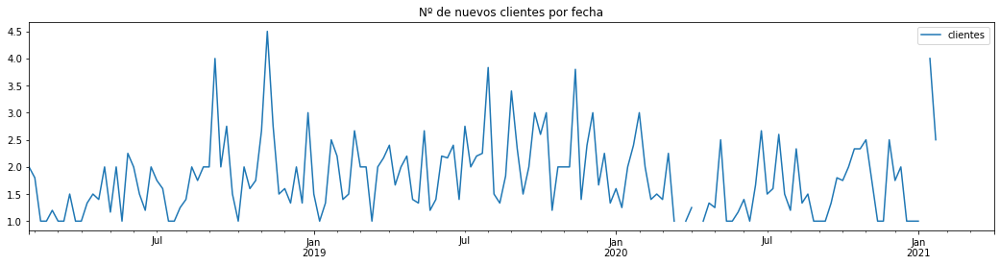

In [67]:
DF['FEC_REGISTRO'].drop(DF[DF['FEC_CLIENTE'] <= DF['FEC_REGISTRO']].index)\
    .value_counts().to_frame('registros').resample('W').mean().plot(figsize=(18, 4), 
                                                                    title='Nº de registros por fecha')
DF['FEC_CLIENTE'].drop(DF[DF['FEC_CLIENTE'] <= DF['FEC_REGISTRO']].index)\
    .value_counts().to_frame('clientes').resample('W').mean().plot(figsize=(18, 4), 
                                                                   title='Nº de nuevos clientes por fecha')

plt.show()

Se puede intuir una relación pero a simple vista no resulta fácil concretarla. A continuación muestro un histograma y un diagrama de caja que muestran cuántos días han tardado los clientes en serlo desde su registro. (He quitado los que se hicieron clientes antes del registro o el mismo día.)

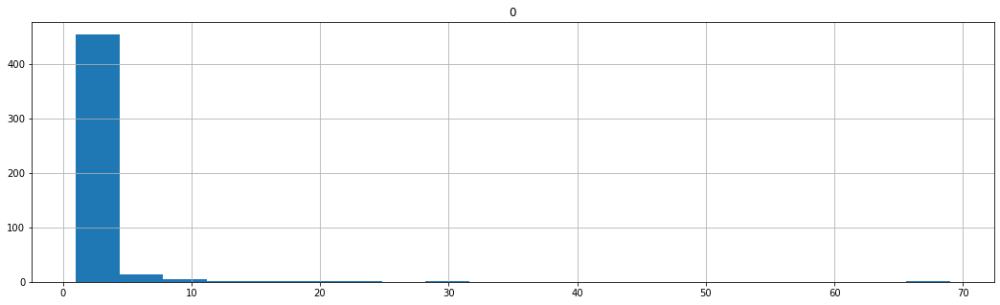

In [68]:
pd.DataFrame(DF[(DF['IND_CLIENTE'] == 1) &
               (DF['FEC_CLIENTE'] > DF['FEC_REGISTRO'])]['FEC_CLIENTE'] 
             - 
             DF[(DF['IND_CLIENTE'] == 1) & (DF['FEC_CLIENTE'] > DF['FEC_REGISTRO'])]['FEC_REGISTRO'],
             columns=['días']).sort_values(by='días').value_counts().to_frame().hist(bins=20, figsize=(18,5))

plt.show()

/Users/inigoab/opt/anaconda3/envs/TFM/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: casting timedelta64[ns] values to int64 with .astype(...) is deprecated and will raise in a future version. Use .view(...) instead.
  """


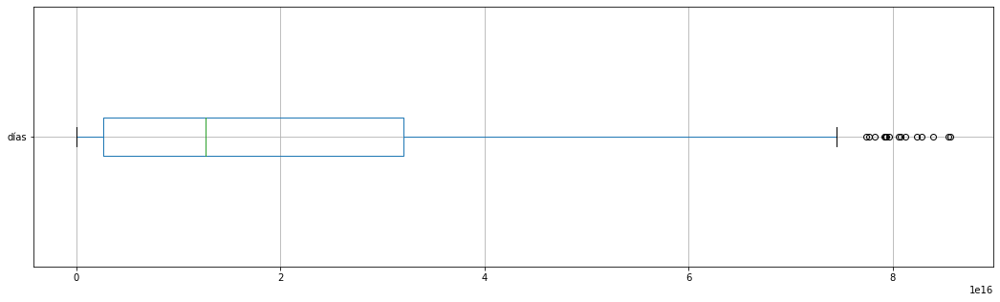

In [69]:
pd.DataFrame(DF[(DF['IND_CLIENTE'] == 1) &
               (DF['FEC_CLIENTE'] > DF['FEC_REGISTRO'])]['FEC_CLIENTE'] 
             - 
             DF[(DF['IND_CLIENTE'] == 1) & (DF['FEC_CLIENTE'] > DF['FEC_REGISTRO'])]['FEC_REGISTRO'],
             columns=['días']).sort_values(by='días')[['días']].astype('int').boxplot(figsize=(18,5),vert=False)

plt.show()

In [70]:
pd.DataFrame(DF[(DF['IND_CLIENTE'] == 1) &
               (DF['FEC_CLIENTE'] > DF['FEC_REGISTRO'])]['FEC_CLIENTE'] 
             - 
             DF[(DF['IND_CLIENTE'] == 1) & (DF['FEC_CLIENTE'] > DF['FEC_REGISTRO'])]['FEC_REGISTRO'],
             columns=['días']).sort_values(by='días').describe()

,días
count,1057
mean,225 days 22:11:00.737937560
std,233 days 00:14:34.337356052
min,1 days 00:00:00
25%,31 days 00:00:00
50%,147 days 00:00:00
75%,371 days 00:00:00
max,991 days 00:00:00


A continuación muestro el diagrama de caja y el resumen estadístico sin quitar ningún dato.

/Users/inigoab/opt/anaconda3/envs/TFM/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: casting timedelta64[ns] values to int64 with .astype(...) is deprecated and will raise in a future version. Use .view(...) instead.
  """


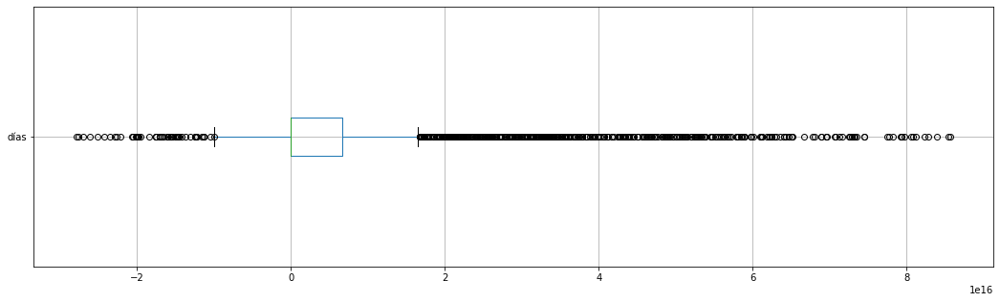

In [71]:
pd.DataFrame(DF[(DF['IND_CLIENTE'] == 1)]['FEC_CLIENTE'] 
             - 
             DF[(DF['IND_CLIENTE'] == 1)]['FEC_REGISTRO'],
             columns=['días']).dropna().sort_values(by='días', ascending=False)[['días']]\
            .astype('int').boxplot(figsize=(18,5),vert=False)

plt.show()

In [72]:
pd.DataFrame(DF[(DF['IND_CLIENTE'] == 1)]['FEC_CLIENTE'] 
             - 
             DF[(DF['IND_CLIENTE'] == 1)]['FEC_REGISTRO'],
             columns=['días']).dropna().sort_values(by='días', ascending=False)\
            .describe()

,días
count,2613
mean,84 days 23:02:08.128587830
std,190 days 22:34:33.031432278
min,-322 days +00:00:00
25%,0 days 00:00:00
50%,0 days 00:00:00
75%,77 days 00:00:00
max,991 days 00:00:00


In [73]:
DF.select_dtypes('datetime').columns

Index(['FEC_REGISTRO', 'FEC_CLIENTE', 'FEC_ALTA', 'primer_consumo',
       'último_consumo', 'primer_login', 'último_login', 'primera_sesión',
       'última_sesión'],
      dtype='object')

In [74]:
print((DF['último_consumo'] - DF['primer_consumo']).isnull().sum())
print((DF['último_login'] - DF['primer_login']).isnull().sum())
print((DF['última_sesión'] - DF['primera_sesión']).isnull().sum())

67
170625
3


In [75]:
print((DF['primer_login']).isnull().sum())
print((DF['último_login']).isnull().sum())

170625
170625


In [76]:
DF[DF['primer_login'].isnull()].groupby('IND_CLIENTE')['IDUSUARIO'].count()

IND_CLIENTE
0    170437
1       188
Name: IDUSUARIO, dtype: int64

In [77]:
DF['díasEntreConsumos'] = (DF['último_consumo'] - DF['primer_consumo'])\
                            .dt.days.fillna(0).astype(int)

DF['díasEntreLogins'] = (DF['último_login'] - DF['primer_login'])\
                            .dt.days.fillna(0).astype(int)

DF['díasEntreSesiones'] = (DF['última_sesión'] - DF['primera_sesión'])\
                            .dt.days.fillna(0).astype(int)

In [78]:
DF.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 367705 entries, 0 to 367704
Data columns (total 32 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   IDUSUARIO           367705 non-null  object        
 1   TIPOUSUARIO         367705 non-null  object        
 2   FEC_REGISTRO        367705 non-null  datetime64[ns]
 3   CANAL_REGISTRO      360171 non-null  float64       
 4   IND_CLIENTE         367705 non-null  int64         
 5   IND_ALTA            367705 non-null  int64         
 6   TIPOEMAIL           367705 non-null  object        
 7   BONDAD_EMAIL        367705 non-null  int64         
 8   USU_TELF            367639 non-null  object        
 9   IPCASOS             367705 non-null  int64         
 10  IP_Country          345941 non-null  object        
 11  IP_Area             345941 non-null  object        
 12  USU_TIPO            84114 non-null   object        
 13  USU_TAMANIO         84116 non

## Valores perdidos

In [79]:
pd.concat([DF.isnull().sum().to_frame('Nº nulos'),
          (DF.isnull().sum()/DF.shape[0]).to_frame('% nulos').mul(100).round(2).astype(str) + '%'],
          axis=1)

,Nº nulos,% nulos
IDUSUARIO,0,0.0%
TIPOUSUARIO,0,0.0%
FEC_REGISTRO,0,0.0%
CANAL_REGISTRO,7534,2.05%
IND_CLIENTE,0,0.0%
IND_ALTA,0,0.0%
TIPOEMAIL,0,0.0%
BONDAD_EMAIL,0,0.0%
USU_TELF,66,0.02%
IPCASOS,0,0.0%


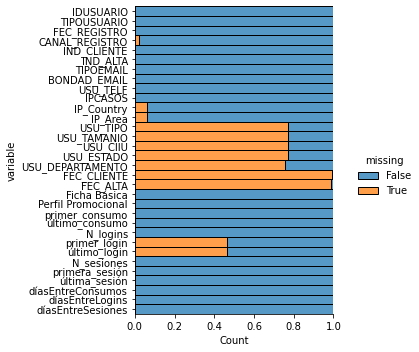

In [80]:
sns.displot(
    data=DF.isna().melt(value_name="missing"),
    y="variable",
    hue="missing",
    multiple="fill"
)
plt.show()

In [81]:
# Elimino los campos con más de un 30% de valores nulos. En este caso se trata de los de tipo USU porque tienen más de un 75% de valores nulos.
DF.dropna(thresh=0.7*len(DF), axis='columns', inplace = True)

He eliminado las columnas con más de un 20% de valores nulos por lo que he quitado todas las de tipo USU.

## Eliminación campos que no interesan

In [82]:
# Elimino IDUSUARIO porque sólo servía para juntar las tablas
DF.drop(columns=['IDUSUARIO'], inplace=True)

# Elimino las fechas porque ya las he usado para crear nuevas variables
DF.drop(columns=DF.select_dtypes('datetime').columns, inplace=True)

# Elimino USU_TELF ya que no parece útil debido a las portabilidades
DF.drop(columns=['USU_TELF'], inplace=True)

# Las direcciones de IP no son fiables porque es muy fácil que estén enmascaradas
DF.drop(columns=['IP_Country','IP_Area'], inplace=True)

# Elimino el indicador de alta ya que se indica en el enunciado que está muy correlacionado con el indicador de cliente
DF.drop(columns=['IND_ALTA'], inplace=True)

In [83]:
DF.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 367705 entries, 0 to 367704
Data columns (total 13 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   TIPOUSUARIO         367705 non-null  object 
 1   CANAL_REGISTRO      360171 non-null  float64
 2   IND_CLIENTE         367705 non-null  int64  
 3   TIPOEMAIL           367705 non-null  object 
 4   BONDAD_EMAIL        367705 non-null  int64  
 5   IPCASOS             367705 non-null  int64  
 6   Ficha Básica        367705 non-null  int64  
 7   Perfil Promocional  367705 non-null  int64  
 8   N_logins            367705 non-null  int64  
 9   N_sesiones          367705 non-null  int64  
 10  díasEntreConsumos   367705 non-null  int64  
 11  díasEntreLogins     367705 non-null  int64  
 12  díasEntreSesiones   367705 non-null  int64  
dtypes: float64(1), int64(10), object(2)
memory usage: 47.3+ MB


## Informe exploratorio descriptivo

Mediante ProfileReport de pandas_profiling genero un informe descriptivo y exploratorio.

In [391]:
#prof = ProfileReport(DF)
#prof.to_file(output_file='report_DF.html')

## Variables Categóricas

Exploro las distintas variables y preparo las variables categóricas.

### TIPOUSUARIO

In [85]:
pd.concat([DF["TIPOUSUARIO"].value_counts(),
           DF["TIPOUSUARIO"].value_counts(normalize=True).mul(100).round(2).astype(str) + '%'],
          axis=1, keys=('counts','percentage'))

,counts,percentage
PF,265760,72.28%
PJ,89824,24.43%
PX,12121,3.3%


In [86]:
pd.concat([DF.groupby(["IND_CLIENTE"])
           ["TIPOUSUARIO"].value_counts(),
           DF.groupby(["IND_CLIENTE"])
           ["TIPOUSUARIO"].value_counts(normalize=True).mul(100).round(2).astype(str) + '%'],
          axis=1, keys=('counts','%'))

counts       %
IND_CLIENTE TIPOUSUARIO                
0           PF           264584  72.47%
            PJ            88521  24.25%
            PX            11981   3.28%
1           PJ             1303  49.75%
            PF             1176   44.9%
            PX              140   5.35%

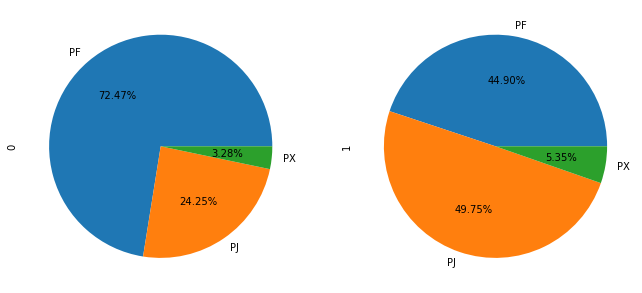

In [87]:
DF.groupby(["TIPOUSUARIO", "IND_CLIENTE"]).size().unstack()\
        .plot.pie(autopct='%1.2f%%', subplots=True, legend=False, figsize=(11, 6))
plt.show()

In [88]:
pd.concat([DF.groupby(['TIPOUSUARIO'])
           ['IND_CLIENTE'].value_counts(),
           DF.groupby(['TIPOUSUARIO'])
           ['IND_CLIENTE'].value_counts(normalize=True).mul(100).round(2).astype(str) + '%'],
          axis=1, keys=('counts','%'))

counts       %
TIPOUSUARIO IND_CLIENTE                
PF          0            264584  99.56%
            1              1176   0.44%
PJ          0             88521  98.55%
            1              1303   1.45%
PX          0             11981  98.84%
            1               140   1.16%

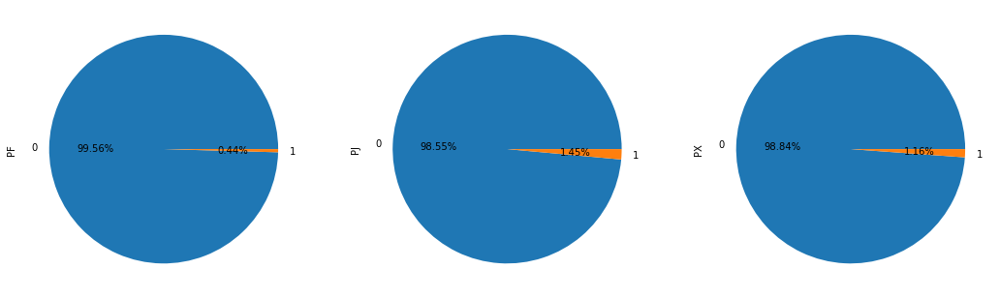

In [89]:
DF.groupby(['IND_CLIENTE', 'TIPOUSUARIO']).size().unstack()\
        .plot.pie(autopct='%1.2f%%', subplots=True, legend=False, figsize=(18, 10))
plt.show()

### CANAL_REGISTRO

In [90]:
sorted(DF['CANAL_REGISTRO'].unique())

[1.0, 2.0, 3.0, 4.0, 6.0, 7.0, 8.0, 9.0, nan]

In [91]:
DF['CANAL_REGISTRO'].isnull().sum()

7534

In [92]:
# Inputo los valores nulos (nan) como "otros_canales"

DF['CANAL_REGISTRO'].fillna("otros_canales", inplace=True)

In [93]:
DF['CANAL_REGISTRO'].loc[DF['CANAL_REGISTRO'] == 1.] = "SEM"
DF['CANAL_REGISTRO'].loc[DF['CANAL_REGISTRO'].isin([2.,3.,7.])] = "canales_populares"
DF['CANAL_REGISTRO'].loc[DF['CANAL_REGISTRO'].isin([6.,8.,9.])] = "canales_especializados"
DF['CANAL_REGISTRO'].loc[DF['CANAL_REGISTRO'].isin([6.,8.,9.])] = "canales_especializados"
DF['CANAL_REGISTRO'].loc[DF['CANAL_REGISTRO'] == 4.] = "SE0"

/Users/inigoab/opt/anaconda3/envs/TFM/lib/python3.7/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [94]:
pd.concat([DF['CANAL_REGISTRO'].value_counts(),
          DF['CANAL_REGISTRO'].value_counts(normalize=True).mul(100).round(2).astype(str) + '%'],
          axis=1, keys=('counts','%'))

,counts,%
canales_populares,240725,65.47%
canales_especializados,66628,18.12%
SEM,36461,9.92%
SE0,16357,4.45%
otros_canales,7534,2.05%


### TIPOEMAIL

Esta variable tiene una cardinalidad demasiado alta, con unos pocos tipos de emails muy frecuentes y muchos minoritarios.

In [95]:
DF['TIPOEMAIL'].isnull().sum()

0

In [96]:
# distribución de los distintos tipos de emails
pd.concat([DF['TIPOEMAIL'].value_counts(),
           DF['TIPOEMAIL'].value_counts(normalize=True).mul(100).round(2).astype(str) + '%'],
          axis=1, keys=('counts','percentage')).sort_values(by=['counts'], ascending=False).head(15)

,counts,percentage
gmail.com,159897,43.49%
hotmail.com,121607,33.07%
yahoo.com,6503,1.77%
yahoo.es,5239,1.42%
outlook.com,4884,1.33%
hotmail.es,3638,0.99%
yopmail.com,3366,0.92%
misena.edu.co,2792,0.76%
outlook.es,1764,0.48%
live.com,1062,0.29%


In [97]:
# distribución de los distintos tipos de email entre los clientes
pd.concat([DF[DF['IND_CLIENTE']==1]['TIPOEMAIL'].value_counts(),
           DF[DF['IND_CLIENTE']==1]['TIPOEMAIL'].value_counts(normalize=True).mul(100).round(2).astype(str) + '%'],
          axis=1, keys=('counts','percentage')).sort_values(by=['counts'], ascending=False).head(15)

,counts,percentage
gmail.com,839,32.04%
hotmail.com,694,26.5%
yahoo.com,82,3.13%
outlook.com,37,1.41%
yahoo.es,32,1.22%
icloud.com,12,0.46%
une.net.co,8,0.31%
hotmail.es,8,0.31%
msn.com,7,0.27%
uniandes.edu.co,7,0.27%


In [98]:
len(DF['TIPOEMAIL'].loc[DF['TIPOEMAIL'].str.contains('(^|\.)edu(\.|$)')])

/Users/inigoab/opt/anaconda3/envs/TFM/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  """Entry point for launching an IPython kernel.


11058

In [99]:
DF['TIPOEMAIL'].loc[DF['TIPOEMAIL'].str.contains('(^|\.)edu(\.|$)')] = 'email_educativo'

/Users/inigoab/opt/anaconda3/envs/TFM/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  """Entry point for launching an IPython kernel.
/Users/inigoab/opt/anaconda3/envs/TFM/lib/python3.7/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [100]:
len(DF['TIPOEMAIL'].loc[DF['TIPOEMAIL'].str.contains('(^|\.)co(\.|$)')])

/Users/inigoab/opt/anaconda3/envs/TFM/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  """Entry point for launching an IPython kernel.


15290

In [101]:
DF['TIPOEMAIL'].loc[DF['TIPOEMAIL'].str.contains('(^|\.)co(\.|$)')] = 'email_colombiano'

/Users/inigoab/opt/anaconda3/envs/TFM/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  """Entry point for launching an IPython kernel.


In [102]:
len(DF['TIPOEMAIL'].loc[DF['TIPOEMAIL'].str.contains('(^|\.)es(\.|$)')])

/Users/inigoab/opt/anaconda3/envs/TFM/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  """Entry point for launching an IPython kernel.


11295

In [103]:
DF['TIPOEMAIL'].loc[DF['TIPOEMAIL'].str.contains('(^|\.)es(\.|$)')] = 'email_español'

/Users/inigoab/opt/anaconda3/envs/TFM/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  """Entry point for launching an IPython kernel.


In [104]:
DF['TIPOEMAIL'].loc[DF['TIPOEMAIL'].str.contains('(?!(^gmail\.com$))(^|\.)gmail\.|(^|\.)google\.')] = 'email_google'

/Users/inigoab/opt/anaconda3/envs/TFM/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  """Entry point for launching an IPython kernel.


In [105]:
DF['TIPOEMAIL'].loc[DF['TIPOEMAIL'].str.contains(
    '(?!(^hotmail\.com$))(^|\.)hotmail\.|(^|\.)outlook\.|(^|\.)microsoft\.|(^|\.)live\.')] = 'email_microsoft'

/Users/inigoab/opt/anaconda3/envs/TFM/lib/python3.7/site-packages/ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  


In [106]:
# distribución de los distintos tipos de emails
pd.concat([DF['TIPOEMAIL'].value_counts(),
           DF['TIPOEMAIL'].value_counts(normalize=True).mul(100).round(2).astype(str) + '%'],
          axis=1, keys=('counts','percentage')).sort_values(by=['counts'], ascending=False).head(15)

,counts,percentage
gmail.com,159897,43.49%
hotmail.com,121607,33.07%
email_colombiano,15290,4.16%
email_español,11295,3.07%
email_educativo,11058,3.01%
yahoo.com,6503,1.77%
email_microsoft,6443,1.75%
yopmail.com,3366,0.92%
cool.fr.nf,931,0.25%
gamil.com,559,0.15%


In [107]:
frecuencias_email = DF['TIPOEMAIL'].value_counts(normalize=True)

In [108]:
#Agrupo los emails muy minoritarios (los que tienen una frecuencia inferior al 0,001%)
DF['TIPOEMAIL'] = DF['TIPOEMAIL'].mask(
    DF['TIPOEMAIL'].map(frecuencias_email) < 0.00001, 'email_muy_minoritario')

In [109]:
#Agrupo los emails minoritarios (los que tienen una frecuencia inferior al 0,1%)
DF['TIPOEMAIL'] = DF['TIPOEMAIL'].mask(
    DF['TIPOEMAIL'].map(frecuencias_email) < 0.001, 'email_minoritario')

In [110]:
#Agrupo los emails que tienen una frecuencia inferior al 1%
DF['TIPOEMAIL'] = DF['TIPOEMAIL'].mask(
    DF['TIPOEMAIL'].map(frecuencias_email) < 0.01, 'otros_email')

In [111]:
# distribución de los distintos tipos de emails
pd.concat([DF['TIPOEMAIL'].value_counts(),
           DF['TIPOEMAIL'].value_counts(normalize=True).mul(100).round(2).astype(str) + '%'],
          axis=1, keys=('counts','percentage')).sort_values(by=['counts'], ascending=False).head(15)

,counts,percentage
gmail.com,159897,43.49%
hotmail.com,121607,33.07%
email_muy_minoritario,17234,4.69%
email_colombiano,15290,4.16%
email_español,11295,3.07%
email_minoritario,11178,3.04%
email_educativo,11058,3.01%
otros_email,7200,1.96%
yahoo.com,6503,1.77%
email_microsoft,6443,1.75%


In [112]:
# distribución de los distintos tipos de email entre los clientes
pd.concat([DF[DF['IND_CLIENTE']==1]['TIPOEMAIL'].value_counts(),
           DF[DF['IND_CLIENTE']==1]['TIPOEMAIL'].value_counts(normalize=True).mul(100).round(2).astype(str) + '%'],
          axis=1, keys=('counts','percentage')).sort_values(by=['counts'], ascending=False).head(15)

,counts,percentage
gmail.com,839,32.04%
hotmail.com,694,26.5%
email_muy_minoritario,411,15.69%
email_colombiano,346,13.21%
email_minoritario,82,3.13%
yahoo.com,82,3.13%
email_español,55,2.1%
email_educativo,51,1.95%
email_microsoft,44,1.68%
otros_email,15,0.57%


([0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

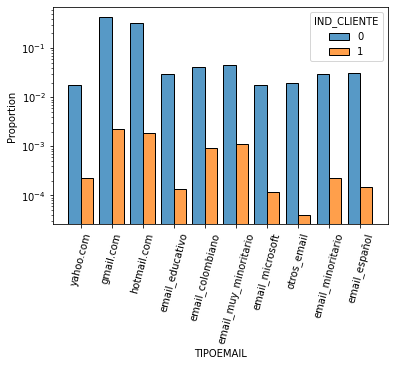

In [113]:
#g = sns.countplot(data=DF, x='TIPOEMAIL', hue='IND_CLIENTE',stat = 'density')
#g.set_yscale("log")
#_ = g.set(xlabel="Class", ylabel="Survived")

sns.histplot(data=DF, x='TIPOEMAIL', hue='IND_CLIENTE', multiple="dodge", 
                  stat = 'proportion', shrink = 0.8, common_norm=True, log_scale=(False, True))
plt.xticks(rotation=75)

In [114]:
pd.concat([DF.groupby(['TIPOEMAIL'])
           ['IND_CLIENTE'].value_counts(),
           DF.groupby(['TIPOEMAIL'])
           ['IND_CLIENTE'].value_counts(normalize=True).mul(100).round(2).astype(str) + '%'],
          axis=1, keys=('counts','percentage'))

counts percentage
TIPOEMAIL             IND_CLIENTE                   
email_colombiano      0             14944     97.74%
                      1               346      2.26%
email_educativo       0             11007     99.54%
                      1                51      0.46%
email_español         0             11240     99.51%
                      1                55      0.49%
email_microsoft       0              6399     99.32%
                      1                44      0.68%
email_minoritario     0             11096     99.27%
                      1                82      0.73%
email_muy_minoritario 0             16823     97.62%
                      1               411      2.38%
gmail.com             0            159058     99.48%
                      1               839      0.52%
hotmail.com           0            120913     99.43%
                      1               694      0.57%
otros_email           0              7185     99.79%
                      1                15      0.21%
yahoo.com             0              6421     98.74%
                      1                82      1.26%

### BONDAD_EMAIL

In [115]:
pd.concat([DF.groupby(['BONDAD_EMAIL'])
           ['IND_CLIENTE'].value_counts(),
           DF.groupby(['BONDAD_EMAIL'])
           ['IND_CLIENTE'].value_counts(normalize=True).mul(100).round(2).astype(str) + '%'],
          axis=1, keys=('counts','percentage'))

counts percentage
BONDAD_EMAIL IND_CLIENTE                   
-20          0             12016     99.71%
             1                35      0.29%
-10          0             16808      99.9%
             1                17       0.1%
 0           0             54000     99.88%
             1                67      0.12%
 1           0              4917     99.45%
             1                27      0.55%
 9           0              4828     99.38%
             1                30      0.62%
 20          0            272517     99.11%
             1              2443      0.89%

In [116]:
DF['BONDAD_EMAIL'].loc[DF['BONDAD_EMAIL'] == 20] = "email_OK"
DF['BONDAD_EMAIL'].loc[DF['BONDAD_EMAIL'] == 9] = "email_Naranja"
DF['BONDAD_EMAIL'].loc[DF['BONDAD_EMAIL'] == 1] = "SPAM"
DF['BONDAD_EMAIL'].loc[DF['BONDAD_EMAIL'] == 0] = "email_Rojo"
DF['BONDAD_EMAIL'].loc[DF['BONDAD_EMAIL'] == -10] = "email_sin_dominio"
DF['BONDAD_EMAIL'].loc[DF['BONDAD_EMAIL'] == -20] = "No_email"

/Users/inigoab/opt/anaconda3/envs/TFM/lib/python3.7/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [117]:
DF['BONDAD_EMAIL'].unique()

array(['email_Rojo', 'email_OK', 'email_sin_dominio', 'SPAM', 'No_email',
       'email_Naranja'], dtype=object)

In [118]:
pd.concat([DF.groupby(['IND_CLIENTE'])
           ['BONDAD_EMAIL'].value_counts(),
           DF.groupby(['IND_CLIENTE'])
           ['BONDAD_EMAIL'].value_counts(normalize=True).mul(100).round(2).astype(str) + '%'],
          axis=1, keys=('counts','percentage'))

counts percentage
IND_CLIENTE BONDAD_EMAIL                        
0           email_OK           272517     74.64%
            email_Rojo          54000     14.79%
            email_sin_dominio   16808       4.6%
            No_email            12016      3.29%
            SPAM                 4917      1.35%
            email_Naranja        4828      1.32%
1           email_OK             2443     93.28%
            email_Rojo             67      2.56%
            No_email               35      1.34%
            email_Naranja          30      1.15%
            SPAM                   27      1.03%
            email_sin_dominio      17      0.65%

([0, 1, 2, 3, 4, 5],
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

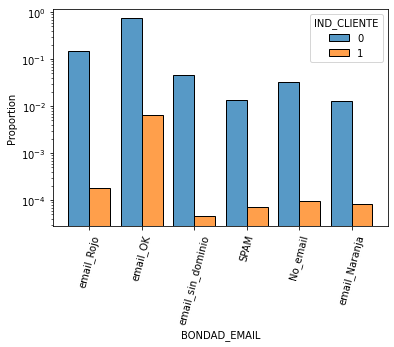

In [119]:
sns.histplot(data=DF, x='BONDAD_EMAIL', hue='IND_CLIENTE', multiple="dodge", 
                  stat = 'proportion', shrink = 0.8, common_norm=True, log_scale=(False, True))
plt.xticks(rotation=75)

# Selección de características

In [120]:
DF.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 367705 entries, 0 to 367704
Data columns (total 13 columns):
 #   Column              Non-Null Count   Dtype 
---  ------              --------------   ----- 
 0   TIPOUSUARIO         367705 non-null  object
 1   CANAL_REGISTRO      367705 non-null  object
 2   IND_CLIENTE         367705 non-null  int64 
 3   TIPOEMAIL           367705 non-null  object
 4   BONDAD_EMAIL        367705 non-null  object
 5   IPCASOS             367705 non-null  int64 
 6   Ficha Básica        367705 non-null  int64 
 7   Perfil Promocional  367705 non-null  int64 
 8   N_logins            367705 non-null  int64 
 9   N_sesiones          367705 non-null  int64 
 10  díasEntreConsumos   367705 non-null  int64 
 11  díasEntreLogins     367705 non-null  int64 
 12  díasEntreSesiones   367705 non-null  int64 
dtypes: int64(9), object(4)
memory usage: 47.3+ MB


## Variables Categóricas

In [121]:
DF.select_dtypes(object).info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 367705 entries, 0 to 367704
Data columns (total 4 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   TIPOUSUARIO     367705 non-null  object
 1   CANAL_REGISTRO  367705 non-null  object
 2   TIPOEMAIL       367705 non-null  object
 3   BONDAD_EMAIL    367705 non-null  object
dtypes: object(4)
memory usage: 22.1+ MB


### CHI2

In [122]:
def test_chi2(dataset, variable_objetivo, alpha = 0.05):
    '''
    Dados el dataset y el nombre de la variable objetivo
    realiza el test chi2 sobre las variables categóricas.
    '''

    from scipy.stats import chi2_contingency

    print('- Hipótesis Nula (H0): No hay relación entre las variables')
    print('- Hipótesis Alternativa (H1): Hay relación entre las variables\n')

    X = dataset.select_dtypes(object)
    y = dataset[variable_objetivo]

    chi2 = []
    p_value = []
    chi2_check = []
    for i in X.columns:
        chi_res = chi2_contingency(pd.crosstab(y, X[i]))
        chi2.append(round(chi_res[0],4))
        p_value.append(chi_res[1])
        #print('p-valor', p_value[-1])
        if chi_res[1] < alpha:
            chi2_check.append('Se rechaza la hipótesis nula')
        else:
            chi2_check.append('No se rechaza la hipótesis nula')
      
    res = pd.DataFrame(data = [X.columns, chi2, p_value, chi2_check]).T 
      
    res.columns = ['Columna', 'Chi2','p-valor', 'Hipótesis']

    alpha
    quitar_columnas = res[res['p-valor'] > alpha]['Columna'].tolist()
    if len(quitar_columnas) > 0:
        for c in quitar_columnas:
            print('No se puede afirmar que haya relación entre {} y ser cliente, con un nivel de confianza del {}%.'. format(
                    c,round((1-alpha)*100)))
    else:
        print('No se puede afirmar que no exista relación entre las variables y ser cliente, con un nivel de confianza del {}%.'.format(
                round((1-alpha)*100)))
    print('\n')
  
    return res

In [123]:
test_chi2(DF, 'IND_CLIENTE')

- Hipótesis Nula (H0): No hay relación entre las variables
- Hipótesis Alternativa (H1): Hay relación entre las variables

No se puede afirmar que no exista relación entre las variables y ser cliente, con un nivel de confianza del 95%.




,Columna,Chi2,p-valor,Hipótesis
0,TIPOUSUARIO,999.517,0.0,Se rechaza la hipótesis nula
1,CANAL_REGISTRO,752.7108,0.0,Se rechaza la hipótesis nula
2,TIPOEMAIL,1387.2722,0.0,Se rechaza la hipótesis nula
3,BONDAD_EMAIL,507.1491,0.0,Se rechaza la hipótesis nula


## Variables numéricas

### Correlaciones

In [124]:
def corr_matrix(datos):
    '''
    Función para crear un gráfico de matriz de correlaciones entre las variables numéricas.
    '''
    corr = datos.drop(columns=datos.select_dtypes(object).columns).corr()

    sns.set_theme(style="white")
    mask = np.triu(np.ones_like(corr, dtype=bool))
    f, ax = plt.subplots(figsize=(11, 9))
    cmap = sns.diverging_palette(230, 20, as_cmap=True)

    sns.heatmap(corr, mask=mask, cmap=cmap, center=0,
                square=True, linewidths=.5, cbar_kws={"shrink": .5}, 
                annot=True, fmt='.2f',)
  
    plt.show()

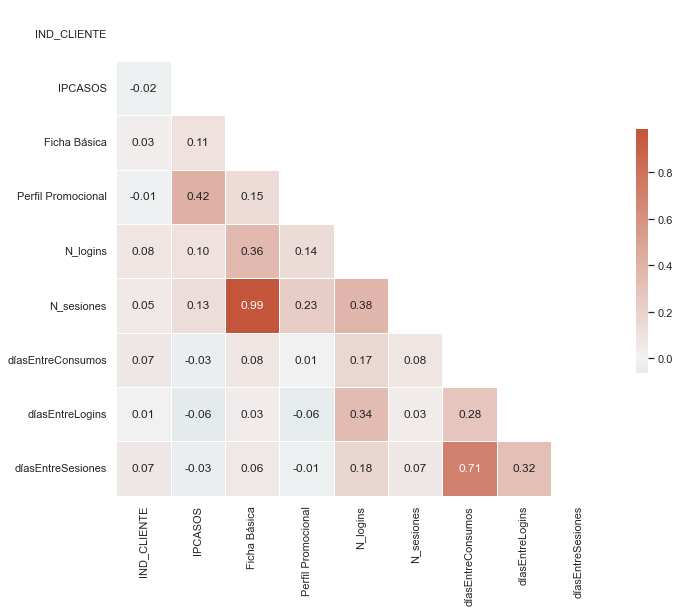

In [125]:
corr_matrix(DF)

### ANOVA

In [126]:
def test_anova(dataset, variable_objetivo, alpha = 0.05):
    
    from sklearn.feature_selection import SelectKBest
    from sklearn.feature_selection import f_classif
    
    print('- Hipótesis Nula (H0): No hay diferencia en la varizan en función de si el usuario es cliente o no')
    print('- Hipótesis Alternativa (H1): Hay diferencia en la varianza en función de si el usuario es cliente o no\n')

    X, y = dataset.select_dtypes(int).drop(columns=['IND_CLIENTE']), dataset[variable_objetivo]

    fs = SelectKBest(score_func=f_classif, k='all')
    fs.fit(X, y)
    
    anova_check = []
    for i in range(len(fs.scores_)):
        if fs.pvalues_[i] < alpha:
            anova_check.append('Se rechaza la hipótesis nula')
        else:
            anova_check.append('No se rechaza la hipótesis nula')
      
    res = pd.DataFrame(data = [X.select_dtypes(int).columns, fs.scores_, fs.pvalues_, anova_check]).T 
    res.columns = ['Columna', 'fvalor','p-valor', 'Hipótesis']

    quitar_columnas = res[res['p-valor'] > alpha]['Columna'].tolist()
    if len(quitar_columnas) > 0:
        for c in quitar_columnas:
            print('No se puede afirmar que haya diferencia en la varianza de {} y ser cliente, con un nivel de confianza del {}%.'. format(
                c,round((1-alpha)*100)))
    else:
        print('No se puede afirmar que no exista diferencia en la varianza de las variables y ser cliente, con un nivel de confianza del {}%.'.format(
            round((1-alpha)*100)))
    print('\n')
    
    return res

In [127]:
test_anova(DF, 'IND_CLIENTE')

- Hipótesis Nula (H0): No hay diferencia en la varizan en función de si el usuario es cliente o no
- Hipótesis Alternativa (H1): Hay diferencia en la varianza en función de si el usuario es cliente o no

No se puede afirmar que no exista diferencia en la varianza de las variables y ser cliente, con un nivel de confianza del 95%.




,Columna,fvalor,p-valor,Hipótesis
0,IPCASOS,104.815239,0.0,Se rechaza la hipótesis nula
1,Ficha Básica,265.662249,0.0,Se rechaza la hipótesis nula
2,Perfil Promocional,74.975647,0.0,Se rechaza la hipótesis nula
3,N_logins,2362.100712,0.0,Se rechaza la hipótesis nula
4,N_sesiones,1040.505436,0.0,Se rechaza la hipótesis nula
5,díasEntreConsumos,1880.656099,0.0,Se rechaza la hipótesis nula
6,díasEntreLogins,19.560644,0.00001,Se rechaza la hipótesis nula
7,díasEntreSesiones,1807.612849,0.0,Se rechaza la hipótesis nula


El resultado de ANOVA no me indica la eliminación de ninguna variable pero quitaré Ficha Básica por tener una alta correlación con N_sesiones y pareciendo menos explicativa que esta última. También quitaré díasEntreSesiones porque tiene una alta correlación con díasEntreConsumos (parece que aportan una explicabilidad muy similar).

In [128]:
DF = DF.drop(columns=['Ficha Básica', 'díasEntreSesiones'])

In [129]:
DF

,TIPOUSUARIO,CANAL_REGISTRO,IND_CLIENTE,TIPOEMAIL,BONDAD_EMAIL,IPCASOS,Perfil Promocional,N_logins,N_sesiones,díasEntreConsumos,díasEntreLogins
0,PF,canales_populares,0,yahoo.com,email_Rojo,1,1,1,5,0,0
1,PJ,canales_populares,0,gmail.com,email_OK,1,1,3,3,0,90
2,PJ,canales_populares,0,hotmail.com,email_OK,1,1,0,3,0,0
3,PX,canales_populares,0,email_educativo,email_OK,1,1,1,3,0,0
4,PJ,canales_populares,0,hotmail.com,email_OK,1,1,0,3,0,0
...,...,...,...,...,...,...,...,...,...,...,...
367700,PF,SEM,0,hotmail.com,email_Rojo,1806,2,1,9,0,0
367701,PF,SEM,0,hotmail.com,email_Rojo,1806,4,5,14,0,0
367702,PF,SEM,0,hotmail.com,email_Rojo,1806,3,3,14,0,0
367703,PF,SEM,0,email_minoritario,email_Naranja,1806,1,1,8,0,0


# Separación en entrenamiento y test

In [130]:
X = DF.drop(columns='IND_CLIENTE')
y = DF['IND_CLIENTE']

X_train, X_test1, y_train, y_test1 = train_test_split(X, y, test_size=0.30, random_state=42, stratify=y)

X = X_test1
y = y_test1

X_val, X_test, y_val, y_test = train_test_split(X, y, test_size=0.5, random_state=1, stratify=y)

#test = pd.concat([X_test, y_test], axis=1) # datos para test
#val = pd.concat([X_val, y_val], axis=1) # datos para validación
#train0 = pd.concat([X_train, y_train], axis=1) # en este no quito observaciones
#train = pd.concat([X_train, y_train], axis=1) # en este quito reduciré las observaciones

print('X_test', X_test.shape)
print('X_val', X_val.shape)
#print(train0.shape)
print('X_train', X_train.shape)

X_test (55156, 10)
X_val (55156, 10)
X_train (257393, 10)


# Preprocesamiento

## ONE HOT ENCODING

In [131]:
def ohe(data):

    ohe = OneHotEncoder(sparse=False)
    data_ohencoded = pd.DataFrame(ohe.fit_transform(data.select_dtypes(object)))
    data_ohencoded.columns = np.unique(data.select_dtypes(object)).tolist()
  
    return pd.concat([data_ohencoded, data.reset_index(drop=True).drop(
        columns=data.select_dtypes(object).columns.tolist())], axis=1)

In [132]:
X_train = ohe(X_train)
X_val = ohe(X_val)
X_test = ohe(X_test)

In [133]:
X_train

,No_email,PF,PJ,PX,SE0,SEM,SPAM,canales_especializados,canales_populares,email_Naranja,...,hotmail.com,otros_canales,otros_email,yahoo.com,IPCASOS,Perfil Promocional,N_logins,N_sesiones,díasEntreConsumos,díasEntreLogins
0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0,0,2,4,0,0
1,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,1,1,1,3,0,0
2,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,1,1,1,6,86,0
3,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,5,1,2,3,0,0
4,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,3739,2,7,9,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
257388,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,1,1,0,3,0,0
257389,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,3612,2,0,7,0,0
257390,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,3,1,0,3,0,0
257391,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,1,1,0,3,0,0


In [134]:
X_train0 = X_train.copy()
X_val0 = X_val.copy()
X_test0 = X_test.copy()

#X_train0.to_pickle("./X_train0.pkl")  
#X_val0.to_pickle("./X_val0.pkl")  
#X_test0.to_pickle("./X_test0.pkl") 

In [135]:
'''
X_train0 = pd.read_pickle("./X_train0.pkl")
X_val0 = pd.read_pickle("./X_val0.pkl")
X_test0 = pd.read_pickle("./X_test0.pkl")
'''

'\nX_train0 = pd.read_pickle("./X_train0.pkl")\nX_val0 = pd.read_pickle("./X_val0.pkl")\nX_test0 = pd.read_pickle("./X_test0.pkl")\n'

In [136]:
'''from sklearn.ensemble import RandomForestClassifier

#feature_names = [f"feature {i}" for i in range(X.shape[1])]
forest = RandomForestClassifier(random_state=0, )
forest.fit(X_train, y_train)

importances = forest.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest.estimators_], axis=0)

forest_importances = pd.Series(importances, index=X_train.columns)

fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=std, ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout()'''

'from sklearn.ensemble import RandomForestClassifier\n\n#feature_names = [f"feature {i}" for i in range(X.shape[1])]\nforest = RandomForestClassifier(random_state=0, )\nforest.fit(X_train, y_train)\n\nimportances = forest.feature_importances_\nstd = np.std([tree.feature_importances_ for tree in forest.estimators_], axis=0)\n\nforest_importances = pd.Series(importances, index=X_train.columns)\n\nfig, ax = plt.subplots()\nforest_importances.plot.bar(yerr=std, ax=ax)\nax.set_title("Feature importances using MDI")\nax.set_ylabel("Mean decrease in impurity")\nfig.tight_layout()'

In [137]:
'''
from sklearn.feature_selection import SelectFromModel

X.shape

clf = ExtraTreesClassifier(n_estimators=50)
clf = clf.fit(X, y)
clf.feature_importances_  

model = SelectFromModel(clf, prefit=True)
X_new = model.transform(X)
X_new.shape      '''

'\nfrom sklearn.feature_selection import SelectFromModel\n\nX.shape\n\nclf = ExtraTreesClassifier(n_estimators=50)\nclf = clf.fit(X, y)\nclf.feature_importances_  \n\nmodel = SelectFromModel(clf, prefit=True)\nX_new = model.transform(X)\nX_new.shape      '

## Recursive Feature Elimination

In [138]:
'''%%time

from xgboost import XGBClassifier

counter = Counter(y_train)

xgb = XGBClassifier(
    scale_pos_weight= counter[0]/counter[1]
    )

#cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)

rfecv = RFECV(estimator=xgb, 
              step=1, 
              cv=3,
              scoring='recall')

rfecv.fit(X_train, y_train)

cols_drop = X_train.columns[~rfecv.support_]
print('Se eliminan las columnas: ', cols_drop)'''

"%%time\n\nfrom xgboost import XGBClassifier\n\ncounter = Counter(y_train)\n\nxgb = XGBClassifier(\n    scale_pos_weight= counter[0]/counter[1]\n    )\n\n#cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)\n\nrfecv = RFECV(estimator=xgb, \n              step=1, \n              cv=3,\n              scoring='recall')\n\nrfecv.fit(X_train, y_train)\n\ncols_drop = X_train.columns[~rfecv.support_]\nprint('Se eliminan las columnas: ', cols_drop)"

In [139]:
#X_train.columns[rfecv.support_]

In [140]:
%%time

rfe = RFECV(estimator=RandomForestClassifier(random_state=20, 
#                                             class_weight='balanced'
                                             ), step=1, cv=5, scoring='recall') 
rfe = rfe.fit(X_train0, y_train)

print('Se mantienen las columnas: \n', X_train0.columns[rfe.support_])

Se mantienen las columnas: 
 Index(['PF', 'SPAM', 'email_español', 'IPCASOS', 'Perfil Promocional',
       'N_logins', 'N_sesiones', 'díasEntreConsumos', 'díasEntreLogins'],
      dtype='object')
CPU times: user 1h 12min 33s, sys: 44.9 s, total: 1h 13min 18s
Wall time: 1h 16min 52s


In [338]:
%%time

rfe1 = RFECV(estimator=RandomForestClassifier(random_state=20, 
                                             class_weight='balanced'
                                             ), step=1, cv=5, scoring='recall') 
rfe1 = rfe.fit(X_train0, y_train)

print('Se mantienen las columnas: \n', X_train0.columns[rfe1.support_])

Se mantienen las columnas: 
 Index(['PF', 'SPAM', 'email_español', 'IPCASOS', 'Perfil Promocional',
       'N_logins', 'N_sesiones', 'díasEntreConsumos', 'díasEntreLogins'],
      dtype='object')
CPU times: user 1h 13min 29s, sys: 1min, total: 1h 14min 30s
Wall time: 1h 17min 33s


In [141]:
X_val = X_val0.drop(columns=X_train0.columns[~rfe.support_])
X_test = X_test0.drop(columns=X_train0.columns[~rfe.support_])
X_train = X_train0.drop(columns=X_train0.columns[~rfe.support_])

In [142]:
X_train0.shape

(257393, 30)

In [143]:
print(X_train.shape)
print(X_val.shape)
print(X_test.shape)

(257393, 9)
(55156, 9)
(55156, 9)


In [144]:
'''
X_train.to_pickle("./X_train.pkl")  
X_val.to_pickle("./X_val.pkl")  
X_test.to_pickle("./X_test.pkl")
'''

'\nX_train.to_pickle("./X_train.pkl")  \nX_val.to_pickle("./X_val.pkl")  \nX_test.to_pickle("./X_test.pkl")\n'

In [145]:
'''
X_train = pd.read_pickle("./X_train.pkl")
X_val = pd.read_pickle("./X_val.pkl")
X_test = pd.read_pickle("./X_test.pkl")
'''

'\nX_train = pd.read_pickle("./X_train.pkl")\nX_val = pd.read_pickle("./X_val.pkl")\nX_test = pd.read_pickle("./X_test.pkl")\n'

In [146]:
#unpickled_X_train = pd.read_pickle("./X_train.pkl") 
#unpickled_X_test = pd.read_pickle("./X_test.pkl") 

In [147]:
#unpickled_X_train.equals(X_train)

In [148]:
#unpickled_X_test.equals(X_test)

In [149]:
dill.dump_session('TFM_notebook_env.db')

In [150]:
#import dill
#dill.load_session('TFM_notebook_env.db')

# Data Sampling sobre train

## Oversample

### Random Oversampling

In [151]:
%%time

print(Counter(y_train))
X_ROS, y_ROS = RandomOverSampler(random_state=42).fit_resample(X_train, y_train)
print(Counter(y_ROS))
print('\n')
'''
X_ROS.to_pickle("./X_ROS.pkl")  
y_ROS.to_pickle("./y_ROS.pkl")
'''

Counter({0: 255560, 1: 1833})
Counter({0: 255560, 1: 255560})


CPU times: user 440 ms, sys: 57.1 ms, total: 497 ms
Wall time: 500 ms


'\nX_ROS.to_pickle("./X_ROS.pkl")  \ny_ROS.to_pickle("./y_ROS.pkl")\n'

### SMOTE

In [152]:
%%time

print(Counter(y_train))
X_SMOTE, y_SMOTE = SMOTE(random_state=42).fit_resample(X_train, y_train)
print(Counter(y_SMOTE))
print('\n')
'''
X_SMOTE.to_pickle("./X_SMOTE.pkl")  
y_SMOTE.to_pickle("./y_SMOTE.pkl")
'''

Counter({0: 255560, 1: 1833})
Counter({0: 255560, 1: 255560})


CPU times: user 398 ms, sys: 82.6 ms, total: 481 ms
Wall time: 487 ms


'\nX_SMOTE.to_pickle("./X_SMOTE.pkl")  \ny_SMOTE.to_pickle("./y_SMOTE.pkl")\n'

### SMOTENC

In [153]:
%%time

from imblearn.over_sampling import SMOTENC
print(Counter(y_train))
X_SMOTENC, y_SMOTENC = SMOTENC(random_state=1,
                               categorical_features=[0, 1,2],
                              ).fit_resample(X_train, y_train)
print(Counter(y_SMOTENC))
print('\n')

Counter({0: 255560, 1: 1833})
Counter({0: 255560, 1: 255560})


CPU times: user 31.2 s, sys: 1.03 s, total: 32.2 s
Wall time: 32.1 s


### Borderline-SMOTE

In [154]:
%%time

print(Counter(y_train))
X_BS, y_BS = BorderlineSMOTE(random_state=42).fit_resample(X_train, y_train)
print(Counter(y_BS))
print('\n')
'''
X_BS.to_pickle("./X_BS.pkl")
y_BS.to_pickle("./y_BS.pkl") 
'''

Counter({0: 255560, 1: 1833})
Counter({0: 255560, 1: 255560})


CPU times: user 1min 24s, sys: 1.19 s, total: 1min 25s
Wall time: 1min 25s


'\nX_BS.to_pickle("./X_BS.pkl")\ny_BS.to_pickle("./y_BS.pkl") \n'

### Borderline-SMOTE SVM

In [155]:
%%time

print(Counter(y_train))
X_SVMSMOTE, y_SVMSMOTE = SVMSMOTE(
    #sampling_strategy=0.3,
    random_state=42).fit_resample(X_train, y_train)
print(Counter(y_SVMSMOTE))
#print(Counter(y_SVMSMOTE)[1] / sum(Counter(y_SVMSMOTE).values()) * 100)
print('\n')

Counter({0: 255560, 1: 1833})
Counter({0: 255560, 1: 255560})


CPU times: user 6min 35s, sys: 2.21 s, total: 6min 37s
Wall time: 6min 42s


### Adaptive Synthetic Sampling (ADASYN)

In [156]:
%%time

print(Counter(y_train))
X_ADASYN, y_ADASYN = ADASYN(random_state=42).fit_resample(X_train, y_train)
print(Counter(y_ADASYN))
print('\n')
'''
X_ADASYN.to_pickle("./X_ADASYN.pkl")  
y_ADASYN.to_pickle("./y_ADASYN.pkl")
'''

Counter({0: 255560, 1: 1833})
Counter({1: 255929, 0: 255560})


CPU times: user 1min 23s, sys: 1.06 s, total: 1min 24s
Wall time: 1min 24s


'\nX_ADASYN.to_pickle("./X_ADASYN.pkl")  \ny_ADASYN.to_pickle("./y_ADASYN.pkl")\n'

In [157]:
dill.dump_session('TFM_notebook_env.db')

## Undersample

### Random Undersample

In [158]:
%%time

print(Counter(y_train))
undersample_RandomUnderSampler = RandomUnderSampler(random_state=1)
X_RUS, y_RUS = undersample_RandomUnderSampler.fit_resample(X_train, y_train)
print(Counter(y_RUS))
print('\n')
'''
X_RUS.to_pickle("./X_RUS.pkl")  
y_RUS.to_pickle("./y_RUS.pkl") 
'''

Counter({0: 255560, 1: 1833})
Counter({0: 1833, 1: 1833})


CPU times: user 153 ms, sys: 18.3 ms, total: 171 ms
Wall time: 169 ms


'\nX_RUS.to_pickle("./X_RUS.pkl")  \ny_RUS.to_pickle("./y_RUS.pkl") \n'

### Near Miss Undersampling

In [159]:
%%time

print(Counter(y_train))
undersample_NearMiss1 = NearMiss(version=1, n_neighbors=3)
X_NM1, y_NM1 = undersample_NearMiss1.fit_resample(X_train, y_train)
print(Counter(y_NM1))
print('\n')
'''
X_NM1.to_pickle("./X_NM1.pkl")
y_NM1.to_pickle("./y_NM1.pkl")
'''

Counter({0: 255560, 1: 1833})
Counter({0: 1833, 1: 1833})


CPU times: user 3.83 s, sys: 64.9 ms, total: 3.9 s
Wall time: 3.9 s


'\nX_NM1.to_pickle("./X_NM1.pkl")\ny_NM1.to_pickle("./y_NM1.pkl")\n'

In [160]:
'''
# Consume demasiada RAM

%%time

print(Counter(y))
undersample_NearMiss2 = NearMiss(version=2, n_neighbors=3)
X_NM2, y_NM2 = undersample_NearMiss2.fit_resample(X_train, y_train)
print(Counter(y_NM2))
print('\n')

X_NM2.to_pickle("./X_NM2.pkl")  
y_NM2.to_pickle("./y_NM2.pkl")
'''

'\n# Consume demasiada RAM\n\n%%time\n\nprint(Counter(y))\nundersample_NearMiss2 = NearMiss(version=2, n_neighbors=3)\nX_NM2, y_NM2 = undersample_NearMiss2.fit_resample(X_train, y_train)\nprint(Counter(y_NM2))\nprint(\'\n\')\n\nX_NM2.to_pickle("./X_NM2.pkl")  \ny_NM2.to_pickle("./y_NM2.pkl")\n'

In [161]:
%%time

print(Counter(y_train))
undersample_NearMiss3 = NearMiss(version=3, n_neighbors_ver3=3)
X_NM3, y_NM3 = undersample_NearMiss3.fit_resample(X_train, y_train)
print(Counter(y_NM3))
print('\n')
'''
X_NM3.to_pickle("./X_NM3.pkl")  
y_NM3.to_pickle("./y_NM3.pkl")
'''

Counter({0: 255560, 1: 1833})
Counter({0: 1833, 1: 1833})


CPU times: user 1min 25s, sys: 1.04 s, total: 1min 26s
Wall time: 1min 26s


'\nX_NM3.to_pickle("./X_NM3.pkl")  \ny_NM3.to_pickle("./y_NM3.pkl")\n'

In [162]:
dill.dump_session('TFM_notebook_env.db')

### ClusterCentroids

In [163]:
%%time

from imblearn.under_sampling import ClusterCentroids
print(Counter(y_train))
X_CC, y_CC = ClusterCentroids(random_state=42).fit_resample(X_train, y_train)
print(Counter(y_CC))
print('\n')

Counter({0: 255560, 1: 1833})
Counter({0: 1833, 1: 1833})


CPU times: user 1h 14min 54s, sys: 4min 59s, total: 1h 19min 54s
Wall time: 28min 21s


### Condensed Nearest Neighbor Rule Undersampling

In [164]:
'''
# demasiado tiempo de ejecución

print(Counter(y))
undersample_CondensedNearestNeighbour = CondensedNearestNeighbour(n_neighbors=1, random_state=42)
X_CNN, y_CNN = undersample_CondensedNearestNeighbour.fit_resample(X_train, y_train)
print(Counter(y_CNN))
print('\n')

X_CNN.to_pickle("./X_CNN.pkl")  
y_CNN.to_pickle("./y_CNN.pkl")
'''

'\n# demasiado tiempo de ejecución\n\nprint(Counter(y))\nundersample_CondensedNearestNeighbour = CondensedNearestNeighbour(n_neighbors=1, random_state=42)\nX_CNN, y_CNN = undersample_CondensedNearestNeighbour.fit_resample(X_train, y_train)\nprint(Counter(y_CNN))\nprint(\'\n\')\n\nX_CNN.to_pickle("./X_CNN.pkl")  \ny_CNN.to_pickle("./y_CNN.pkl")\n'

### Tomek Links for Undersampling

In [165]:
%%time

print(Counter(y_train))
undersample_TL = TomekLinks()
X_TL, y_TL = undersample_TL.fit_resample(X_train, y_train)
print(Counter(y_TL))
'''
X_TL.to_pickle("./X_TL.pkl")  
y_TL.to_pickle("./y_TL.pkl") 
'''

Counter({0: 255560, 1: 1833})
Counter({0: 255202, 1: 1833})
CPU times: user 3min 25s, sys: 1.56 s, total: 3min 26s
Wall time: 3min 28s


'\nX_TL.to_pickle("./X_TL.pkl")  \ny_TL.to_pickle("./y_TL.pkl") \n'

### Edited Nearest Neighbors Rule for Undersampling

In [166]:
%%time

print(Counter(y_train))
undersample_ENN = EditedNearestNeighbours(n_neighbors=3)
X_ENN, y_ENN = undersample_ENN.fit_resample(X_train, y_train)
print(Counter(y_ENN))
'''
X_ENN.to_pickle("./X_ENN.pkl")  
y_ENN.to_pickle("./y_ENN.pkl")
'''

Counter({0: 255560, 1: 1833})
Counter({0: 253023, 1: 1833})
CPU times: user 3min 28s, sys: 1.49 s, total: 3min 29s
Wall time: 3min 30s


'\nX_ENN.to_pickle("./X_ENN.pkl")  \ny_ENN.to_pickle("./y_ENN.pkl")\n'

### Repeated Edited Nearest Neighbours

In [167]:
%%time

from imblearn.under_sampling import RepeatedEditedNearestNeighbours

print(Counter(y_train))
X_RENN, y_RENN = RepeatedEditedNearestNeighbours().fit_resample(X_train, y_train)
print(Counter(y_RENN))

Counter({0: 255560, 1: 1833})
Counter({0: 250970, 1: 1833})
CPU times: user 1h 48min 34s, sys: 37.5 s, total: 1h 49min 12s
Wall time: 1h 49min 57s


### AllKNN

In [168]:
%%time

from imblearn.under_sampling import AllKNN 

print(Counter(y_train))
X_AllKNN, y_AllKNN = AllKNN().fit_resample(X_train, y_train)
print(Counter(y_AllKNN))

Counter({0: 255560, 1: 1833})
Counter({0: 252250, 1: 1833})
CPU times: user 10min 18s, sys: 3.78 s, total: 10min 22s
Wall time: 10min 25s


### Instance Hardness Threshold

In [169]:
%%time

from imblearn.under_sampling import InstanceHardnessThreshold

print(Counter(y_train))
X_IHT, y_IHT = InstanceHardnessThreshold(random_state=1).fit_resample(X_train, y_train)
print(Counter(y_IHT))

Counter({0: 255560, 1: 1833})
Counter({0: 237525, 1: 1833})
CPU times: user 1min 56s, sys: 920 ms, total: 1min 57s
Wall time: 1min 58s


### One-Sided Selection for Undersampling

In [170]:
%%time

print(Counter(y_train))
undersample_OneSidedSelection = OneSidedSelection(n_neighbors=1, n_seeds_S=200)
X_OSS, y_OSS = undersample_OneSidedSelection.fit_resample(X_train, y_train)
print(Counter(y_OSS))
'''
X_OSS.to_pickle("./X_OSS.pkl")  
y_OSS.to_pickle("./y_OSS.pkl")
'''

Counter({0: 255560, 1: 1833})
Counter({0: 89636, 1: 1833})
CPU times: user 27.6 s, sys: 289 ms, total: 27.9 s
Wall time: 27.8 s


'\nX_OSS.to_pickle("./X_OSS.pkl")  \ny_OSS.to_pickle("./y_OSS.pkl")\n'

### Neighbourhood Cleaning Rule

In [171]:
%%time

print(Counter(y_train))
undersample_NCR = NeighbourhoodCleaningRule(sampling_strategy='majority', n_neighbors=3, threshold_cleaning=0.5)
X_NCR, y_NCR = undersample_NCR.fit_resample(X_train, y_train)
print(Counter(y_NCR))
'''
X_NCR.to_pickle("./X_NCR.pkl")  
y_NCR.to_pickle("./y_NCR.pkl")
'''

Counter({0: 255560, 1: 1833})
Counter({0: 252276, 1: 1833})
CPU times: user 5min 35s, sys: 3.65 s, total: 5min 39s
Wall time: 5min 58s


'\nX_NCR.to_pickle("./X_NCR.pkl")  \ny_NCR.to_pickle("./y_NCR.pkl")\n'

In [172]:
dill.dump_session('TFM_notebook_env.db')

## Resample

### SMOTE and Tomek Links Undersampling

In [173]:
%%time

print(Counter(y_train))
resample_SMOTETomek = SMOTETomek()
X_SMOTETomek, y_SMOTETomek = resample_SMOTETomek.fit_resample(X_train, y_train)
print(Counter(y_SMOTETomek))
print('\n')
'''
X_SMOTETomek.to_pickle("./X_SMOTETomek.pkl")  
y_SMOTETomek.to_pickle("./y_SMOTETomek.pkl")
'''

Counter({0: 255560, 1: 1833})
Counter({0: 255491, 1: 255491})


CPU times: user 8min 21s, sys: 5.74 s, total: 8min 27s
Wall time: 9min 33s


'\nX_SMOTETomek.to_pickle("./X_SMOTETomek.pkl")  \ny_SMOTETomek.to_pickle("./y_SMOTETomek.pkl")\n'

In [174]:
%%time

print(Counter(y_train))
resample_SMOTETomek_majority = SMOTETomek(tomek=TomekLinks(sampling_strategy='majority'))
X_SMOTETomekM, y_SMOTETomekM = resample_SMOTETomek_majority.fit_resample(X_train, y_train)
print(Counter(y_SMOTETomekM))
print('\n')
'''
X_SMOTETomek.to_pickle("./X_SMOTETomek.pkl")  
y_SMOTETomek.to_pickle("./y_SMOTETomek.pkl")
'''

Counter({0: 255560, 1: 1833})
Counter({1: 255560, 0: 255494})


CPU times: user 7min 21s, sys: 4.61 s, total: 7min 25s
Wall time: 7min 55s


'\nX_SMOTETomek.to_pickle("./X_SMOTETomek.pkl")  \ny_SMOTETomek.to_pickle("./y_SMOTETomek.pkl")\n'

### SMOTE and Edited Nearest Neighbors Undersampling

In [175]:
%%time

print(Counter(y_train))
resample_SMOTEENN = SMOTEENN()
X_SMOTEENN, y_SMOTEENN = resample_SMOTEENN.fit_resample(X_train, y_train)
print(Counter(y_SMOTEENN))
print('\n')
'''
X_SMOTEENN.to_pickle("./X_SMOTEENN.pkl")  
y_SMOTEENN.to_pickle("./y_SMOTEENN.pkl")
'''

Counter({0: 255560, 1: 1833})
Counter({1: 252266, 0: 247119})


CPU times: user 5min 52s, sys: 3.35 s, total: 5min 55s
Wall time: 6min 13s


'\nX_SMOTEENN.to_pickle("./X_SMOTEENN.pkl")  \ny_SMOTEENN.to_pickle("./y_SMOTEENN.pkl")\n'

In [176]:
%%time

print(Counter(y_train))
resample_SMOTEENN_majority = SMOTEENN(enn=EditedNearestNeighbours(sampling_strategy='majority'))
X_SMOTEENNM, y_SMOTEENNM = resample_SMOTEENN_majority.fit_resample(X_train, y_train)
print(Counter(y_SMOTEENNM))
print('\n')
'''
X_SMOTEENN.to_pickle("./X_SMOTEENN.pkl")  
y_SMOTEENN.to_pickle("./y_SMOTEENN.pkl")
'''

Counter({0: 255560, 1: 1833})
Counter({1: 255560, 0: 247250})


CPU times: user 5min 39s, sys: 3.5 s, total: 5min 43s
Wall time: 6min 3s


'\nX_SMOTEENN.to_pickle("./X_SMOTEENN.pkl")  \ny_SMOTEENN.to_pickle("./y_SMOTEENN.pkl")\n'

In [177]:
dill.dump_session('TFM_notebook_env.db')

In [178]:
#import dill
#dill.load_session('/content/drive/MyDrive/Colab/TFM_notebook_env.db')
#dill.load_session('TFM_notebook_env.db')

# Modelos de clasificación

## Modelo base (baseline model)

Precisión: 0.993
F1-binary: 0.000
Recall: 0.000


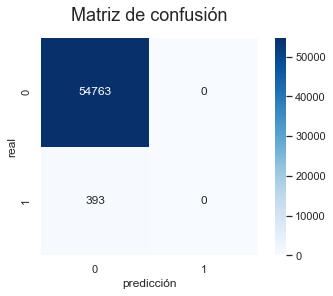

In [179]:
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, recall_score

dummy_clf = DummyClassifier(strategy="most_frequent")
dummy_clf.fit(X_train, y_train)

#print(dummy_clf.score(X_val, y_val))

pred = dummy_clf.predict(X_test)
print("Precisión: {:.3f}".format(accuracy_score(y_test, pred))) 
print("F1-binary: {:.3f}".format(f1_score(y_test, pred, average='binary'))) 
print("Recall: {:.3f}".format(recall_score(y_test, pred))) 


matriz = confusion_matrix(y_test, pred)

sns.heatmap(matriz, annot=True, fmt="d", cmap='Blues', square=True)
plt.xlabel("predicción")
plt.ylabel("real")
plt.title('Matriz de confusión', y=1.05, size=18)
plt.show()

## Regresión logística

In [180]:
from sklearn.linear_model import LogisticRegression

def basic_balancedLRC(trainX, trainy, testX, testy, weight='balanced'):
    
    balancedLrc = LogisticRegression(random_state=0, solver='lbfgs', class_weight='balanced')
    balancedLrc.fit(trainX, trainy)
    
    pred = balancedLrc.predict(testX)
    print("Accuracy: {:.3f}".format(accuracy_score(testy, pred)))
    print("F1-binary: {:.3f}".format(f1_score(testy, pred, average='binary'))) 
    print("Recall: {:.3f}".format(recall_score(testy, pred))) 

    matriz = confusion_matrix(testy, pred)
    sns.heatmap(matriz, annot=True, fmt="d", cmap='Blues', square=True)
    plt.xlabel("predicción")
    plt.ylabel("real")
    plt.title('Matriz de confusión', y=1.05, size=18)
    plt.show()
    print('\n')

/Users/inigoab/opt/anaconda3/envs/TFM/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


Accuracy: 0.918
F1-binary: 0.131
Recall: 0.870


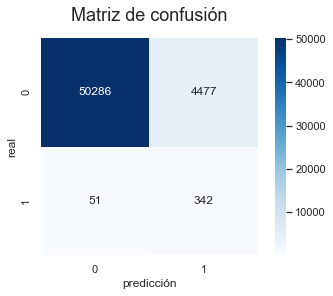



CPU times: user 13.1 s, sys: 576 ms, total: 13.6 s
Wall time: 3.68 s


In [181]:
%%time
basic_balancedLRC(trainX=X_train, trainy=y_train, testX=X_test, testy=y_test, weight='balanced')

In [184]:
def grid_LRC(trainX, trainy, testX, testy, balance):
    
    param_grid = dict(class_weight=balance)
    
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=2, random_state=1)
    
    grid_model = GridSearchCV(estimator=LogisticRegression(random_state=0, solver='lbfgs'),
                              param_grid=param_grid, n_jobs=-1, cv=cv, scoring='recall')
    
    grid_model.fit(trainX, trainy)
                              
    print("\nEl mejor parámetros es: {}".format(grid_model.best_params_))
    
    best_class_weight = grid_model.best_params_['class_weight']
    
    balancedLrc = LogisticRegression(class_weight=best_class_weight, 
                                         random_state=0, verbose=1)
    
    balancedLrc.fit(trainX, trainy)
    
    pred = balancedLrc.predict(testX)
    print("Accuracy: {:.3f}".format(accuracy_score(testy, pred)))
    print("F1-binary: {:.3f}".format(f1_score(testy, pred, average='binary'))) 
    print("Recall: {:.3f}".format(recall_score(testy, pred))) 

    matriz = confusion_matrix(testy, pred)
    sns.heatmap(matriz, annot=True, fmt="d", cmap='Blues', square=True)
    plt.xlabel("predicción")
    plt.ylabel("real")
    plt.title('Matriz de confusión', y=1.05, size=18)
    plt.show()
    print('\n')

## Naive-Bayes

In [185]:
from sklearn.naive_bayes import GaussianNB

def basic_GNB(trainX, trainy, testX, testy):
    
    GNBC = GaussianNB()
    GNBC.fit(trainX, trainy)
    
    pred = GNBC.predict(testX)
    print("Accuracy: {:.3f}".format(accuracy_score(testy, pred)))
    print("F1-binary: {:.3f}".format(f1_score(testy, pred, average='binary'))) 
    print("Recall: {:.3f}".format(recall_score(testy, pred))) 

    matriz = confusion_matrix(testy, pred)
    sns.heatmap(matriz, annot=True, fmt="d", cmap='Blues', square=True)
    plt.xlabel("predicción")
    plt.ylabel("real")
    plt.title('Matriz de confusión', y=1.05, size=18)
    plt.show()
    print('\n')

Accuracy: 0.961
F1-binary: 0.086
Recall: 0.254


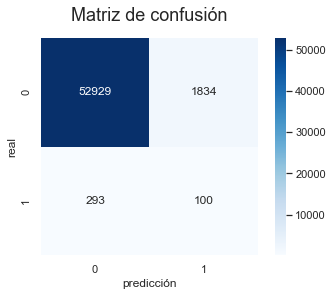



CPU times: user 858 ms, sys: 70.4 ms, total: 929 ms
Wall time: 620 ms


In [187]:
%%time
basic_GNB(trainX=X_train, trainy=y_train, testX=X_test, testy=y_test)

## K vecinos más próximos

In [188]:
from sklearn.neighbors import KNeighborsClassifier

def basic_KNN(trainX, trainy, testX, testy):
    
    KNNC = KNeighborsClassifier(n_neighbors=3)
    KNNC.fit(trainX, trainy)
    
    pred = KNNC.predict(testX)
    print("Accuracy: {:.3f}".format(accuracy_score(testy, pred)))
    print("F1-binary: {:.3f}".format(f1_score(testy, pred, average='binary'))) 
    print("Recall: {:.3f}".format(recall_score(testy, pred))) 

    matriz = confusion_matrix(testy, pred)
    sns.heatmap(matriz, annot=True, fmt="d", cmap='Blues', square=True)
    plt.xlabel("predicción")
    plt.ylabel("real")
    plt.title('Matriz de confusión', y=1.05, size=18)
    plt.show()
    print('\n')

Accuracy: 0.993
F1-binary: 0.337
Recall: 0.247


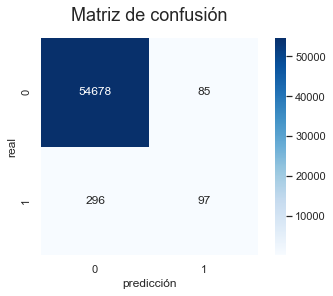



CPU times: user 2min 3s, sys: 1.26 s, total: 2min 4s
Wall time: 2min 8s


In [190]:
%%time
basic_KNN(X_train, y_train, X_test, y_test)

## Árbol de decisión

In [191]:
def basic_balancedDTC(trainX, trainy, testX, testy, weight='balanced'):
    
    balancedDTC = DecisionTreeClassifier(random_state=0, class_weight='balanced')
    balancedDTC.fit(trainX, trainy)
    
    pred = balancedDTC.predict(testX)
    print("Accuracy: {:.3f}".format(accuracy_score(testy, pred)))
    print("F1-binary: {:.3f}".format(f1_score(testy, pred, average='binary'))) 
    print("Recall: {:.3f}".format(recall_score(testy, pred))) 

    matriz = confusion_matrix(testy, pred)
    sns.heatmap(matriz, annot=True, fmt="d", cmap='Blues', square=True)
    plt.xlabel("predicción")
    plt.ylabel("real")
    plt.title('Matriz de confusión', y=1.05, size=18)
    plt.show()
    print('\n')

Accuracy: 0.981
F1-binary: 0.216
Recall: 0.369


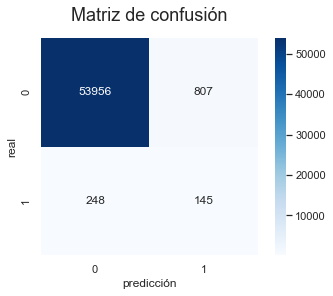



CPU times: user 1.58 s, sys: 58.7 ms, total: 1.64 s
Wall time: 1.33 s


In [192]:
%%time
basic_balancedDTC(trainX=X_train, trainy=y_train, testX=X_test, testy=y_test, weight='balanced')

In [193]:
def grid_balancedDTC(trainX, trainy, testX, testy, 
                     max_depth= range(4, 11),
                     min_samples_split= [2, 10, 20, 50, 100],
                     class_weight= [{0:1,1:1}, {0:1,1:10}, {0:1,1:100}],
                     scoring='recall'):
    
    param_grid = {"max_depth": max_depth, 
                  "min_samples_split": min_samples_split,
                  "class_weight": class_weight}
    
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    
    grid_model = GridSearchCV(DecisionTreeClassifier(random_state=0), param_grid=param_grid,
                                    cv=cv, n_jobs= -1, scoring=scoring, verbose=1)
    grid_model.fit(trainX, trainy)
    
    print("\nLos mejores parámetros son: {}".format(grid_model.best_params_))
    
    best_max_depth = grid_model.best_params_['max_depth']
    best_min_samples_split = grid_model.best_params_['min_samples_split']
    best_class_weight = grid_model.best_params_['class_weight']
    
    grid_dtc = DecisionTreeClassifier(max_depth=best_max_depth, 
                                 min_samples_split=best_min_samples_split, 
                                 random_state=20)
    
    grid_dtc.fit(trainX, trainy)
    
    pred = grid_dtc.predict(testX)
    print("Accuracy: {:.3f}".format(accuracy_score(testy, pred)))
    print("F1-binary: {:.3f}".format(f1_score(testy, pred, average='binary'))) 
    print("Recall: {:.3f}".format(recall_score(testy, pred))) 

    matriz = confusion_matrix(testy, pred)
    sns.heatmap(matriz, annot=True, fmt="d", cmap='Blues', square=True)
    plt.xlabel("predicción")
    plt.ylabel("real")
    plt.title('Matriz de confusión', y=1.05, size=18)
    plt.show()
    print('\n')

Fitting 30 folds for each of 8 candidates, totalling 240 fits

Los mejores parámetros son: {'class_weight': {0: 1, 1: 100}, 'max_depth': 9, 'min_samples_split': 10}
Accuracy: 0.994
F1-binary: 0.295
Recall: 0.188


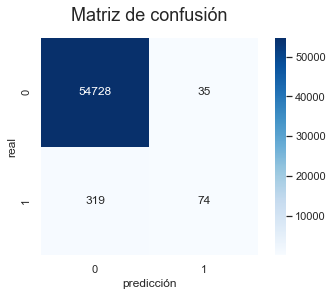



CPU times: user 5.18 s, sys: 1.34 s, total: 6.52 s
Wall time: 2min 12s


In [194]:
%%time

grid_balancedDTC(trainX=X_train, trainy=y_train, testX=X_test, testy=y_test, 
                 max_depth= range(9, 11),
                 min_samples_split= [2, 10],
                 class_weight= [{0:1,1:10},{0:1,1:100}],
                 scoring= 'recall')

## Máquina de soporte vectorial

In [195]:
from sklearn.svm import SVC

def basic_balancedSVC(trainX, trainy, testX, testy, weight='balanced'):
    
    balancedSVC = SVC(gamma='scale', class_weight='balanced')    
    balancedSVC.fit(trainX, trainy)
    
    pred = balancedSVC.predict(testX)
    print("Accuracy: {:.3f}".format(accuracy_score(testy, pred)))
    print("F1-binary: {:.3f}".format(f1_score(testy, pred, average='binary'))) 
    print("Recall: {:.3f}".format(recall_score(testy, pred))) 

    matriz = confusion_matrix(testy, pred)
    sns.heatmap(matriz, annot=True, fmt="d", cmap='Blues', square=True)
    plt.xlabel("predicción")
    plt.ylabel("real")
    plt.title('Matriz de confusión', y=1.05, size=18)
    plt.show()
    print('\n')

In [196]:
'''
%%time
basic_balancedSVC(trainX=X_train, trainy=y_train, testX=X_test, testy=y_test, y_test, weight='balanced')
'''

"\n%%time\nbasic_balancedSVC(trainX=X_train, trainy=y_train, testX=X_test, testy=y_test, y_test, weight='balanced')\n"

## XGBoost

### XGBoost con pesos balanceados

In [197]:
def balancedXGB(trainX, trainy, testX, testy, weight='balanced', eval_metric='aucpr'):
    
    from sklearn.model_selection import cross_val_predict

    if weight == False or weight == None:
        estimate = 1.0
    elif weight == 'balanced':
        counter = Counter(trainy)
        estimate = counter[0]/counter[1]
        print('Peso estimado: ', estimate)
    else:
        estimate = weight
  
    xgb = XGBClassifier(scale_pos_weight=estimate, use_label_encoder=False, eval_metric=eval_metric)
    xgb.fit(trainX, trainy)
  
    pred = xgb.predict(testX)
    print("Accuracy: {:.3f}".format(accuracy_score(testy, pred)))
    print("F1-binary: {:.3f}".format(f1_score(testy, pred, average='binary'))) 
    print("Recall: {:.3f}".format(recall_score(testy, pred))) 
  
    matriz = confusion_matrix(testy, pred)
    sns.heatmap(matriz, annot=True, fmt="d", cmap='Blues', square=True)
    plt.xlabel("predicción")
    plt.ylabel("real")
    plt.title('Matriz de confusión', y=1.05, size=18)
    plt.show()

Accuracy: 0.994
F1-binary: 0.412
Recall: 0.298


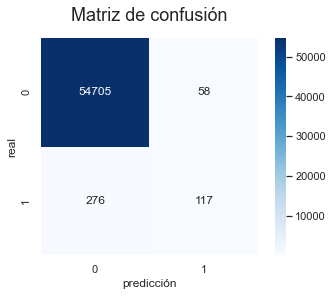

CPU times: user 1min 5s, sys: 1.65 s, total: 1min 7s
Wall time: 26.1 s


In [198]:
%%time
balancedXGB(trainX=X_train, trainy=y_train, testX=X_test, testy=y_test, weight=False)

Peso estimado:  139.4217130387343
Accuracy: 0.962
F1-binary: 0.240
Recall: 0.845


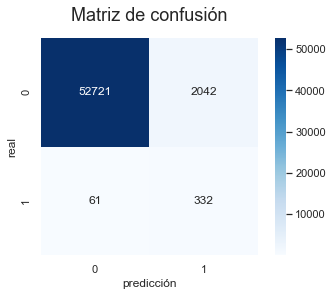

CPU times: user 1min 9s, sys: 1.69 s, total: 1min 10s
Wall time: 24.6 s


In [199]:
%%time
balancedXGB(trainX=X_train, trainy=y_train, testX=X_test, testy=y_test, weight='balanced')

Peso estimado:  139.4217130387343
Accuracy: 0.966
F1-binary: 0.260
Recall: 0.830


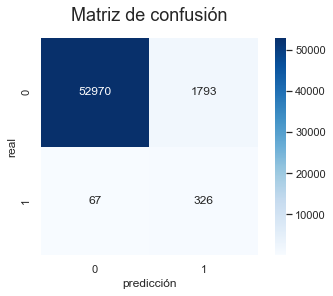

CPU times: user 2min 33s, sys: 2.44 s, total: 2min 36s
Wall time: 58.4 s


In [200]:
%%time
balancedXGB(trainX=X_train0, trainy=y_train, testX=X_test0, testy=y_test, weight='balanced')

## Random Forest

### RandomForestClassifier con pesos balanceados

In [201]:
def basic_balancedRFC(trainX, trainy, testX, testy, weight='balanced'):

    balancedRfc = RandomForestClassifier(random_state=20, class_weight=weight)
    balancedRfc.fit(trainX, trainy)
    
    pred = balancedRfc.predict(testX)
    print("Accuracy: {:.3f}".format(accuracy_score(testy, pred)))
    print("F1-binary: {:.3f}".format(f1_score(testy, pred, average='binary'))) 
    print("Recall: {:.3f}".format(recall_score(testy, pred))) 

    matriz = confusion_matrix(testy, pred)
    sns.heatmap(matriz, annot=True, fmt="d", cmap='Blues', square=True)
    plt.xlabel("predicción")
    plt.ylabel("real")
    plt.title('Matriz de confusión', y=1.05, size=18)
    plt.show()
    print('\n')


Accuracy: 0.986
F1-binary: 0.239
Recall: 0.300


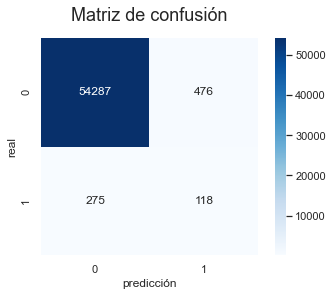



CPU times: user 31.6 s, sys: 746 ms, total: 32.3 s
Wall time: 35 s


In [202]:
%%time
basic_balancedRFC(trainX=X_train, trainy=y_train, testX=X_test, testy=y_test, weight='balanced')

In [377]:
def balancedRFC(trainX, trainy, testX, testy, 
                scoring='recall', weight='balanced',
                n_estimators=[50, 100, 200], max_depth=range(5,15),
                standardize=False, normalize=False, pca=False):
  
    steps = list()
  
    if standardize == True: steps.append(('standarizer', StandardScaler()))
  
    if normalize == True: steps.append(('normalizer', MinMaxScaler()))

    if not isinstance(pca, bool):
        if pca > 1: 
            steps.append(('pca', PCA(n_components=pca)))
            print('\nSe aplica PCA para reducir la dimensionalidad a {} compotentes.'.format(pca))
    elif pca:
        steps.append(('pca', PCA()))
  
    rfc = RandomForestClassifier(random_state=42, class_weight=weight)
    steps.append(('rfc', rfc))
    pipeline = Pipeline(steps=steps)
    
    param_grid = {"rfc__n_estimators": n_estimators, "rfc__max_depth": max_depth}

    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=2, random_state=1)
    
    grid_model = GridSearchCV(pipeline, 
                            param_grid, cv=cv, n_jobs= -1, scoring=scoring, verbose=1)
    
    grid_model.fit(trainX, trainy)
    
    print("\nLos mejores parámetros son: {}".format(grid_model.best_params_))
    
    best_n_estimators = grid_model.best_params_['rfc__n_estimators']
    best_max_depth = grid_model.best_params_['rfc__max_depth']
    
    balancedRfc = RandomForestClassifier(n_estimators=best_n_estimators, 
                                         max_depth=best_max_depth, 
                                         random_state=20, class_weight='balanced', verbose=1)
    
    balancedRfc.fit(trainX, trainy)
    
    pred = balancedRfc.predict(testX)
    print("\nAccuracy: {:.3f}".format(accuracy_score(testy, pred)))
    print("F1-binary: {:.3f}".format(f1_score(testy, pred, average='binary'))) 
    print("Recall: {:.3f}".format(recall_score(testy, pred))) 
    
    matriz = confusion_matrix(testy, pred)
    sns.heatmap(matriz, annot=True, fmt="d", cmap='Blues', square=True)
    plt.xlabel("predicción")
    plt.ylabel("real")
    plt.title('Matriz de confusión', y=1.05, size=18)
    plt.show()
    print('\n')

Fitting 20 folds for each of 30 candidates, totalling 600 fits

Los mejores parámetros son: {'rfc__max_depth': 5, 'rfc__n_estimators': 50}


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    9.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    0.3s finished



Accuracy: 0.878
F1-binary: 0.101
Recall: 0.957


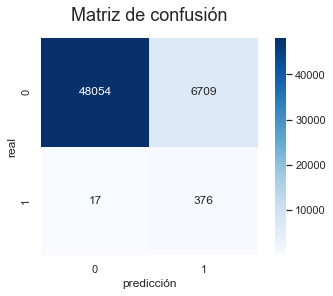

In [204]:
balancedRFC(trainX=X_train, trainy=y_train, testX=X_test, testy=y_test,
                scoring='recall', weight='balanced',
                n_estimators=[50, 100, 200], max_depth=range(5,15),
                standardize=False, normalize=False, pca=False)

In [372]:
def grid_balancedRFC(trainX, trainy, testX, testy, 
                scoring='recall', weights=[{0:1,1:5}, {0:1,1:10}, {0:1,1:20}],
                n_estimators=[50, 100, 200], max_depth=range(5,15),
                standardize=False, normalize=False, pca=False):
  
    steps = list()
  
    if standardize == True: steps.append(('standarizer', StandardScaler()))
  
    if normalize == True: steps.append(('normalizer', MinMaxScaler()))

    if not isinstance(pca, bool):
        if pca > 1: 
            steps.append(('pca', PCA(n_components=pca)))
            print('\nSe aplica PCA para reducir la dimensionalidad a {} compotentes.'.format(pca))
    elif pca:
        steps.append(('pca', PCA()))
  
    rfc = RandomForestClassifier(random_state=20, class_weight=weights)
    steps.append(('rfc', rfc))
    pipeline = Pipeline(steps=steps)
    
    param_grid = {"rfc__n_estimators": n_estimators, 
                  "rfc__max_depth": max_depth, 
                  "rfc__class_weight": balance}

    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=2, random_state=1)
    
    grid_model = GridSearchCV(pipeline, 
                            param_grid, cv=cv, n_jobs= -1, scoring=scoring, verbose=1)
    
    grid_model.fit(trainX, trainy)
    
    print("\nLos mejores parámetros son: {}".format(grid_model.best_params_))
    
    best_n_estimators = grid_model.best_params_['rfc__n_estimators']
    best_max_depth = grid_model.best_params_['rfc__max_depth']
    best_class_weight = grid_model.best_params_['rfc__class_weight']

    
    grid_balancedRfc = RandomForestClassifier(n_estimators=best_n_estimators, 
                                         max_depth=best_max_depth, 
                                         class_weight=best_class_weight,
                                         random_state=20, verbose=1)
    
    grid_balancedRfc.fit(trainX, trainy)
    
    pred = grid_balancedRfc.predict(testX)
    print("\nAccuracy: {:.3f}".format(accuracy_score(testy, pred)))
    print("F1-binary: {:.3f}".format(f1_score(testy, pred, average='binary'))) 
    print("Recall: {:.3f}".format(recall_score(testy, pred))) 
    
    matriz = confusion_matrix(testy, pred)
    sns.heatmap(matriz, annot=True, fmt="d", cmap='Blues', square=True)
    plt.xlabel("predicción")
    plt.ylabel("real")
    plt.title('Matriz de confusión', y=1.05, size=18)
    plt.show()
    print('\n')

In [206]:
dill.dump_session('TFM_notebook_env.db')

In [207]:
#import dill
#dill.load_session('/content/drive/MyDrive/Colab/TFM_notebook_env.db')
#dill.load_session('TFM_notebook_env.db')

In [208]:
%whos

Variable                          Type                         Data/Info
------------------------------------------------------------------------
ADASYN                            ABCMeta                      <class 'imblearn.over_sampling._adasyn.ADASYN'>
AllKNN                            ABCMeta                      <class 'imblearn.under_sa<...>arest_neighbours.AllKNN'>
BorderlineSMOTE                   ABCMeta                      <class 'imblearn.over_sam<...>._smote.BorderlineSMOTE'>
ClusterCentroids                  ABCMeta                      <class 'imblearn.under_sa<...>troids.ClusterCentroids'>
CondensedNearestNeighbour         ABCMeta                      <class 'imblearn.under_sa<...>ndensedNearestNeighbour'>
Counter                           type                         <class 'collections.Counter'>
DF                                DataFrame                           TIPOUSUARIO     CA<...>367705 rows x 11 columns]
DecisionTreeClassifier            ABCMeta              

# Elección de dataset de Train

Accuracy: 0.991
F1-binary: 0.250
Recall: 0.211


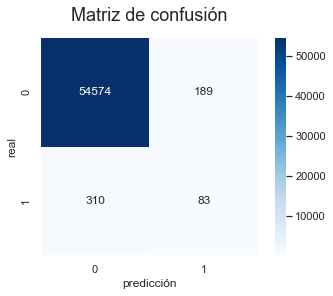



CPU times: user 36.6 s, sys: 961 ms, total: 37.6 s
Wall time: 37.7 s


In [209]:
%%time
basic_balancedRFC(trainX=X_train0, trainy=y_train, testX=X_test0, testy=y_test,
                  weight='balanced')

Accuracy: 0.986
F1-binary: 0.239
Recall: 0.300


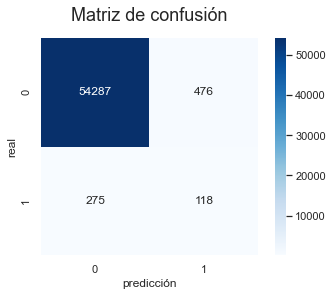



CPU times: user 29 s, sys: 595 ms, total: 29.6 s
Wall time: 30 s


In [210]:
%%time
basic_balancedRFC(trainX=X_train, trainy=y_train, testX=X_test, testy=y_test,
                  weight='balanced')

In [211]:
(X_train.columns == X_ROS.columns)

array([ True,  True,  True,  True,  True,  True,  True,  True,  True])

In [212]:
X_ROS.columns

Index(['PF', 'SPAM', 'email_español', 'IPCASOS', 'Perfil Promocional',
       'N_logins', 'N_sesiones', 'díasEntreConsumos', 'díasEntreLogins'],
      dtype='object')

In [213]:
X_ROS.shape

(511120, 9)

In [214]:
X_test.shape

(55156, 9)

In [215]:
y_test.shape

(55156,)

## Oversampling

Accuracy: 0.982
F1-binary: 0.237
Recall: 0.384


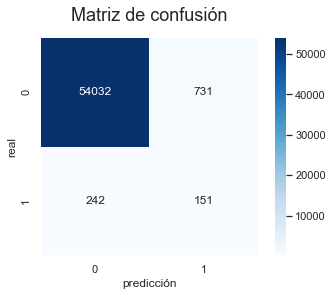



CPU times: user 1min 50s, sys: 2.18 s, total: 1min 52s
Wall time: 2min 1s


In [216]:
%%time
basic_balancedRFC(trainX=X_ROS, trainy=y_ROS, testX=X_test, testy=y_test,
                  weight='balanced')

Accuracy: 0.986
F1-binary: 0.290
Recall: 0.410


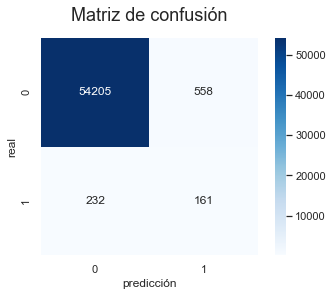



CPU times: user 1min 39s, sys: 1.85 s, total: 1min 41s
Wall time: 1min 43s


In [217]:
%%time
basic_balancedRFC(trainX=X_SMOTE, trainy=y_SMOTE, testX=X_test, testy=y_test,
                  weight='balanced')

Accuracy: 0.974
F1-binary: 0.265
Recall: 0.646


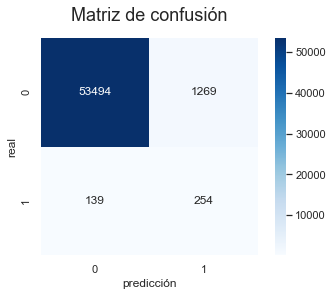



CPU times: user 1min 46s, sys: 1.74 s, total: 1min 47s
Wall time: 1min 48s


In [218]:
%%time
basic_balancedRFC(trainX=X_SMOTENC, trainy=y_SMOTENC, testX=X_test, testy=y_test, 
                  weight='balanced')

Accuracy: 0.987
F1-binary: 0.288
Recall: 0.356


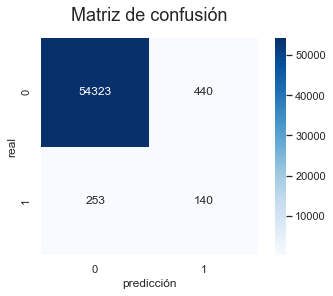



CPU times: user 1min 34s, sys: 1.78 s, total: 1min 35s
Wall time: 1min 36s


In [219]:
%%time
basic_balancedRFC(trainX=X_BS, trainy=y_BS, testX=X_test, testy=y_test,
                  weight='balanced')

Accuracy: 0.988
F1-binary: 0.332
Recall: 0.412


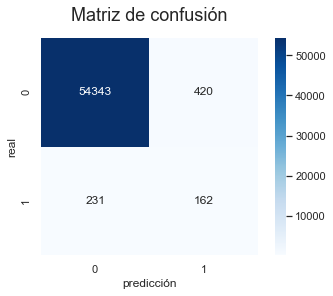



CPU times: user 1min 37s, sys: 2.11 s, total: 1min 39s
Wall time: 1min 41s


In [220]:
%%time
basic_balancedRFC(trainX=X_SVMSMOTE, trainy=y_SVMSMOTE, testX=X_test, testy=y_test, 
                  weight='balanced')

Accuracy: 0.985
F1-binary: 0.268
Recall: 0.382


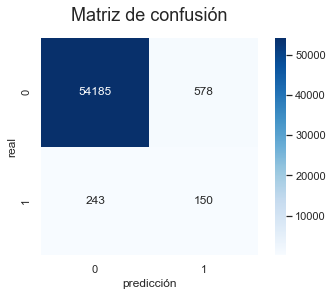



CPU times: user 1min 7s, sys: 1.63 s, total: 1min 8s
Wall time: 1min 9s


In [221]:
%%time
basic_balancedRFC(trainX=X_ADASYN, trainy=y_ADASYN, testX=X_test, testy=y_test, 
                  weight='balanced')

In [222]:
%%time
dill.dump_session('TFM_notebook_env.db')

CPU times: user 1min 34s, sys: 4.49 s, total: 1min 38s
Wall time: 1min 41s


## Undersampling

Accuracy: 0.904
F1-binary: 0.125
Recall: 0.957


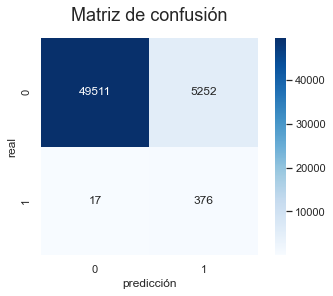



CPU times: user 1.82 s, sys: 48.5 ms, total: 1.87 s
Wall time: 1.49 s


In [223]:
%%time
basic_balancedRFC(trainX=X_RUS, trainy=y_RUS, testX=X_test, testy=y_test, 
                  weight='balanced')

Accuracy: 0.349
F1-binary: 0.019
Recall: 0.906


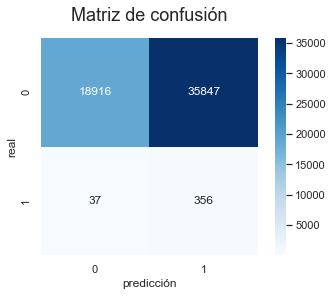



CPU times: user 1.82 s, sys: 36.8 ms, total: 1.86 s
Wall time: 1.47 s


In [224]:
%%time
basic_balancedRFC(trainX=X_NM1, trainy=y_NM1, testX=X_test, testy=y_test, 
                  weight='balanced')

Accuracy: 0.325
F1-binary: 0.016
Recall: 0.784


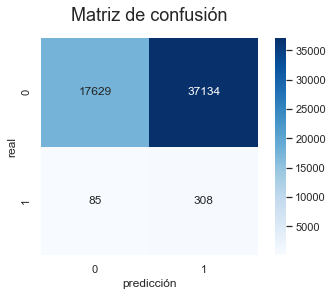



CPU times: user 1.97 s, sys: 44.7 ms, total: 2.01 s
Wall time: 1.62 s


In [225]:
%%time
basic_balancedRFC(trainX=X_NM3, trainy=y_NM3, testX=X_test, testy=y_test,
                  weight='balanced')

Accuracy: 0.100
F1-binary: 0.015
Recall: 0.990


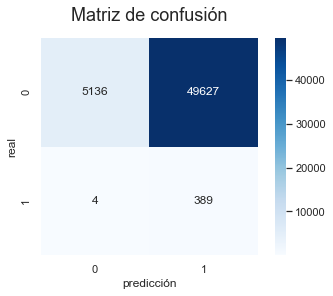



CPU times: user 1.81 s, sys: 36.3 ms, total: 1.85 s
Wall time: 1.46 s


In [226]:
%%time
basic_balancedRFC(trainX=X_CC, trainy=y_CC, testX=X_test, testy=y_test, 
                  weight='balanced')

Accuracy: 0.986
F1-binary: 0.246
Recall: 0.316


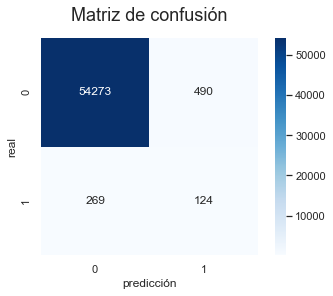



CPU times: user 27.6 s, sys: 434 ms, total: 28 s
Wall time: 27.7 s


In [227]:
%%time
basic_balancedRFC(trainX=X_TL, trainy=y_TL, testX=X_test, testy=y_test, 
                  weight='balanced')

Accuracy: 0.986
F1-binary: 0.303
Recall: 0.417


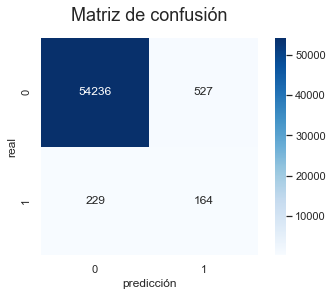



CPU times: user 26.6 s, sys: 690 ms, total: 27.3 s
Wall time: 27.2 s


In [228]:
%%time
basic_balancedRFC(trainX=X_ENN, trainy=y_ENN, testX=X_test, testy=y_test,
                  weight='balanced')

Accuracy: 0.985
F1-binary: 0.328
Recall: 0.499


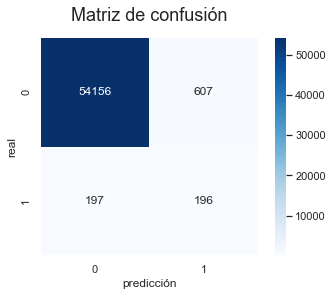



CPU times: user 29.2 s, sys: 433 ms, total: 29.6 s
Wall time: 30.1 s


In [229]:
%%time
basic_balancedRFC(trainX=X_RENN, trainy=y_RENN, testX=X_test, testy=y_test, 
                  weight='balanced')

Accuracy: 0.986
F1-binary: 0.305
Recall: 0.433


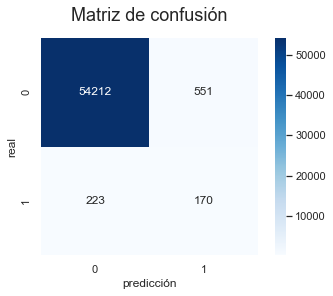



CPU times: user 26.5 s, sys: 685 ms, total: 27.1 s
Wall time: 27.3 s


In [230]:
%%time
basic_balancedRFC(trainX=X_AllKNN, trainy=y_AllKNN, testX=X_test, testy=y_test, 
                  weight='balanced')

Accuracy: 0.974
F1-binary: 0.298
Recall: 0.763


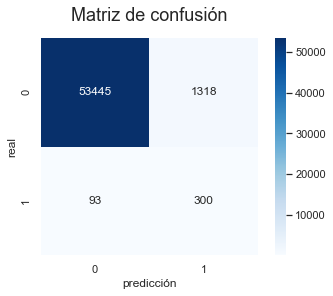



CPU times: user 23 s, sys: 602 ms, total: 23.6 s
Wall time: 23.3 s


In [231]:
%%time
basic_balancedRFC(trainX=X_IHT, trainy=y_IHT, testX=X_test, testy=y_test, 
                  weight='balanced')

Accuracy: 0.990
F1-binary: 0.286
Recall: 0.295


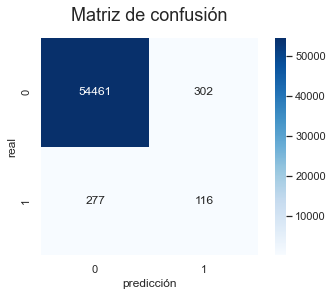



CPU times: user 8.59 s, sys: 202 ms, total: 8.79 s
Wall time: 8.81 s


In [232]:
%%time
basic_balancedRFC(trainX=X_OSS, trainy=y_OSS, testX=X_test, testy=y_test, 
                  weight='balanced')

Accuracy: 0.986
F1-binary: 0.301
Recall: 0.415


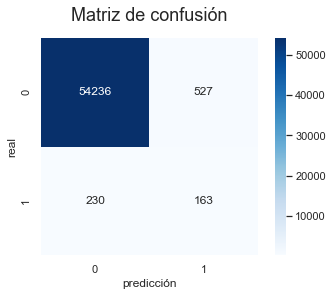



CPU times: user 27.5 s, sys: 690 ms, total: 28.2 s
Wall time: 28.3 s


In [233]:
%%time
basic_balancedRFC(trainX=X_NCR, trainy=y_NCR, testX=X_test, testy=y_test, 
                  weight='balanced')

In [234]:
%%time
dill.dump_session('TFM_notebook_env.db')

CPU times: user 1min 34s, sys: 4.17 s, total: 1min 39s
Wall time: 1min 41s


## Resample

Accuracy: 0.985
F1-binary: 0.278
Recall: 0.394


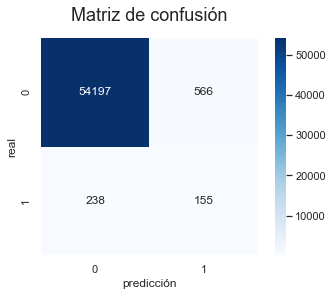



CPU times: user 1min 36s, sys: 1.87 s, total: 1min 38s
Wall time: 1min 40s


In [235]:
%%time
basic_balancedRFC(trainX=X_SMOTETomek, trainy=y_SMOTETomek, testX=X_test, testy=y_test, 
                  weight='balanced')

Accuracy: 0.986
F1-binary: 0.281
Recall: 0.397


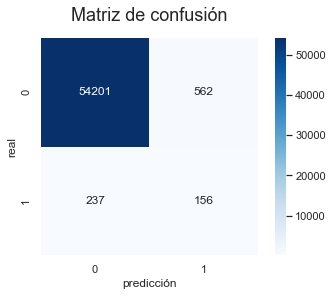



CPU times: user 1min 36s, sys: 1.81 s, total: 1min 38s
Wall time: 1min 39s


In [236]:
%%time
basic_balancedRFC(trainX=X_SMOTETomekM, trainy=y_SMOTETomekM, testX=X_test, testy=y_test, 
                  weight='balanced')

Accuracy: 0.984
F1-binary: 0.341
Recall: 0.598


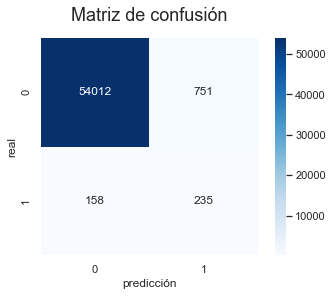



CPU times: user 1min 35s, sys: 2.13 s, total: 1min 37s
Wall time: 1min 37s


In [237]:
%%time
basic_balancedRFC(trainX=X_SMOTEENN, trainy=y_SMOTEENN, testX=X_test, testy=y_test, 
                  weight='balanced')

Accuracy: 0.983
F1-binary: 0.337
Recall: 0.603


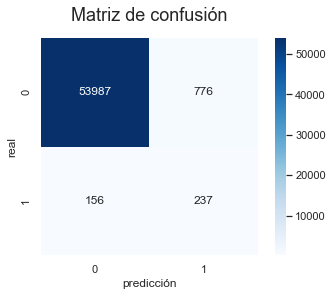



CPU times: user 1min 35s, sys: 1.81 s, total: 1min 37s
Wall time: 1min 38s


In [238]:
%%time
basic_balancedRFC(trainX=X_SMOTEENNM, trainy=y_SMOTEENNM, testX=X_test, testy=y_test, 
                  weight='balanced')

In [239]:
%%time
dill.dump_session('TFM_notebook_env.db')

CPU times: user 1min 36s, sys: 4.34 s, total: 1min 41s
Wall time: 1min 44s


## Combinación de técnicas de resampling que mejor resultado han dado

In [240]:
#import dill
#dill.load_session('TFM_notebook_env.db')

In [241]:
%%time

from imblearn.pipeline import Pipeline

print(Counter(y_train))
svmsmote = SVMSMOTE(sampling_strategy=0.3, random_state=42)
rus = RandomUnderSampler(random_state=42)
pipeline = Pipeline([('svmsmote', svmsmote), ('rus', rus)])
X_SMVSMOTENCRUS, y_SVMSMOTENCRUS = pipeline.fit_resample(X_train, y_train)
print(Counter(y_SVMSMOTENCRUS))
print('\n')

Counter({0: 255560, 1: 1833})
Counter({0: 76668, 1: 76668})


CPU times: user 6min 36s, sys: 3.22 s, total: 6min 40s
Wall time: 6min 43s


Accuracy: 0.984
F1-binary: 0.371
Recall: 0.644


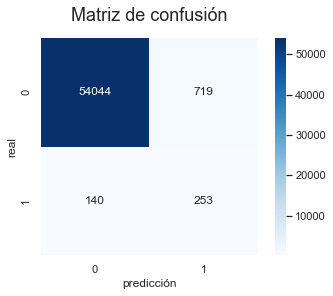



CPU times: user 17 s, sys: 229 ms, total: 17.3 s
Wall time: 17.2 s


In [242]:
%%time
basic_balancedRFC(trainX=X_SMVSMOTENCRUS, trainy=y_SVMSMOTENCRUS, testX=X_test, testy=y_test, 
                  weight='balanced')

In [243]:
%%time

from imblearn.pipeline import Pipeline

print(Counter(y_train))
svmsmote = SVMSMOTE(sampling_strategy=0.1, random_state=42)
rus = RandomUnderSampler(random_state=42)
pipeline = Pipeline([('svmsmote', svmsmote), ('rus', rus)])
X_SMVSMOTENCRUS, y_SVMSMOTENCRUS = pipeline.fit_resample(X_train, y_train)
print(Counter(y_SVMSMOTENCRUS))
print('\n')

Counter({0: 255560, 1: 1833})
Counter({0: 25556, 1: 25556})


CPU times: user 6min 40s, sys: 3.28 s, total: 6min 43s
Wall time: 6min 49s


Accuracy: 0.976
F1-binary: 0.308
Recall: 0.743


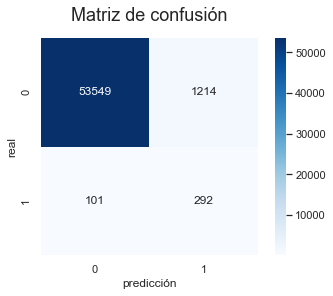



CPU times: user 5.62 s, sys: 110 ms, total: 5.73 s
Wall time: 5.39 s


In [244]:
%%time
basic_balancedRFC(trainX=X_SMVSMOTENCRUS, trainy=y_SVMSMOTENCRUS, testX=X_test, testy=y_test, 
                  weight='balanced')

In [245]:
%%time

from imblearn.pipeline import Pipeline

print(Counter(y_train))
svmsmote = SVMSMOTE(sampling_strategy=0.05, random_state=42)
rus = RandomUnderSampler(random_state=42)
pipeline = Pipeline([('svmsmote', svmsmote), ('rus', rus)])
X_SMVSMOTENCRUS, y_SVMSMOTENCRUS = pipeline.fit_resample(X_train, y_train)
print(Counter(y_SVMSMOTENCRUS))
print('\n')

Counter({0: 255560, 1: 1833})
Counter({0: 12778, 1: 12778})


CPU times: user 6min 36s, sys: 3.22 s, total: 6min 40s
Wall time: 6min 44s


Accuracy: 0.966
F1-binary: 0.254
Recall: 0.817


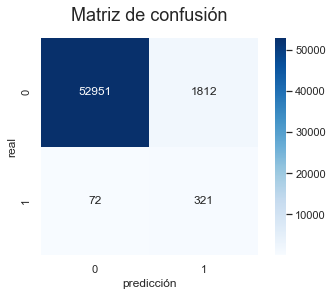



CPU times: user 3.53 s, sys: 67.7 ms, total: 3.6 s
Wall time: 3.22 s


In [246]:
%%time
basic_balancedRFC(trainX=X_SMVSMOTENCRUS, trainy=y_SVMSMOTENCRUS, testX=X_test, testy=y_test, 
                  weight='balanced')

In [247]:
%%time

from imblearn.pipeline import Pipeline

print(Counter(y_train))
svmsmote = SVMSMOTE(sampling_strategy=0.01, random_state=42)
rus = RandomUnderSampler(random_state=42)
pipeline = Pipeline([('svmsmote', svmsmote), ('rus', rus)])
X_SMVSMOTENCRUS, y_SVMSMOTENCRUS = pipeline.fit_resample(X_train, y_train)
print(Counter(y_SVMSMOTENCRUS))
print('\n')

Counter({0: 255560, 1: 1833})
Counter({0: 2555, 1: 2555})


CPU times: user 6min 37s, sys: 3.23 s, total: 6min 40s
Wall time: 6min 44s


Accuracy: 0.928
F1-binary: 0.155
Recall: 0.926


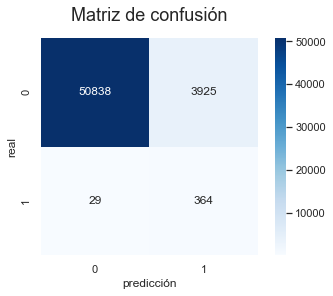



CPU times: user 1.91 s, sys: 39.8 ms, total: 1.95 s
Wall time: 1.56 s


In [248]:
%%time
basic_balancedRFC(trainX=X_SMVSMOTENCRUS, trainy=y_SVMSMOTENCRUS, testX=X_test, testy=y_test, 
                  weight='balanced')

In [249]:
%%time

from imblearn.pipeline import Pipeline

print(Counter(y_train))
svmsmote = SVMSMOTE(sampling_strategy=0.008, random_state=42)
rus = RandomUnderSampler(random_state=42)
pipeline = Pipeline([('svmsmote', svmsmote), ('rus', rus)])
X_SMVSMOTENCRUS, y_SVMSMOTENCRUS = pipeline.fit_resample(X_train, y_train)
print(Counter(y_SVMSMOTENCRUS))
print('\n')

Counter({0: 255560, 1: 1833})
Counter({0: 2044, 1: 2044})


CPU times: user 6min 43s, sys: 3.39 s, total: 6min 46s
Wall time: 6min 51s


Accuracy: 0.920
F1-binary: 0.144
Recall: 0.941


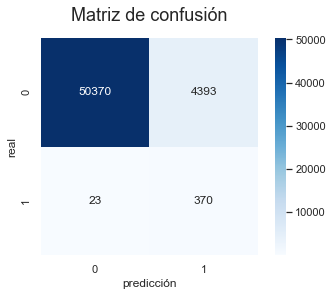



CPU times: user 1.9 s, sys: 48.1 ms, total: 1.95 s
Wall time: 1.59 s


In [250]:
%%time
basic_balancedRFC(trainX=X_SMVSMOTENCRUS, trainy=y_SVMSMOTENCRUS, testX=X_test, testy=y_test, 
                  weight='balanced')

In [251]:
%%time

from imblearn.pipeline import Pipeline

print(Counter(y_train))
svmsmote = SVMSMOTE(sampling_strategy=0.1, random_state=42)
iht = InstanceHardnessThreshold(random_state=42)
pipeline = Pipeline([('svmsmote', svmsmote), ('iht', iht)])
X_SMVSMOTEIHT, y_SVMSMOTEIHT = pipeline.fit_resample(X_train, y_train)
print(Counter(y_SVMSMOTEIHT))
print('\n')

Counter({0: 255560, 1: 1833})
Counter({0: 236000, 1: 25556})


CPU times: user 9min 13s, sys: 5.49 s, total: 9min 18s
Wall time: 9min 26s


Accuracy: 0.972
F1-binary: 0.286
Recall: 0.786


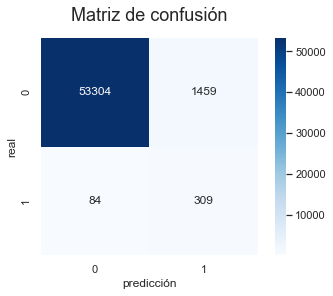



CPU times: user 27.3 s, sys: 622 ms, total: 27.9 s
Wall time: 27.8 s


In [252]:
%%time
basic_balancedRFC(trainX=X_SMVSMOTEIHT, trainy=y_SVMSMOTEIHT, testX=X_test, testy=y_test, 
                  weight='balanced')

In [253]:
%%time

from imblearn.pipeline import Pipeline

print(Counter(y_train))
svmsmote = SVMSMOTE(sampling_strategy=0.01, random_state=42)
iht = InstanceHardnessThreshold(random_state=42)
pipeline = Pipeline([('svmsmote', svmsmote), ('iht', iht)])
X_SMVSMOTEIHT, y_SVMSMOTEIHT = pipeline.fit_resample(X_train, y_train)
print(Counter(y_SVMSMOTEIHT))
print('\n')

Counter({0: 255560, 1: 1833})
Counter({0: 237714, 1: 2555})


CPU times: user 9min 5s, sys: 4.99 s, total: 9min 10s
Wall time: 9min 16s


Accuracy: 0.974
F1-binary: 0.297
Recall: 0.763


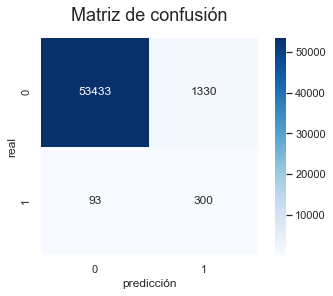



CPU times: user 23.4 s, sys: 583 ms, total: 24 s
Wall time: 23.9 s


In [254]:
%%time
basic_balancedRFC(trainX=X_SMVSMOTEIHT, trainy=y_SVMSMOTEIHT, testX=X_test, testy=y_test, 
                  weight='balanced')

In [255]:
%%time

from imblearn.pipeline import Pipeline

print(Counter(y_train))
svmsmote = SVMSMOTE(sampling_strategy=0.01, random_state=42)
iht = InstanceHardnessThreshold(random_state=42)
rus = RandomUnderSampler(random_state=42)
pipeline = Pipeline([('svmsmote', svmsmote), ('iht', iht), ('rus', rus)])
X_SMVSMOTEIHTRUS, y_SVMSMOTEIHTRUS = pipeline.fit_resample(X_train, y_train)
print(Counter(y_SVMSMOTEIHTRUS))
print('\n')

Counter({0: 255560, 1: 1833})
Counter({0: 2555, 1: 2555})


CPU times: user 9min 10s, sys: 5.25 s, total: 9min 16s
Wall time: 9min 24s


Accuracy: 0.908
F1-binary: 0.127
Recall: 0.944


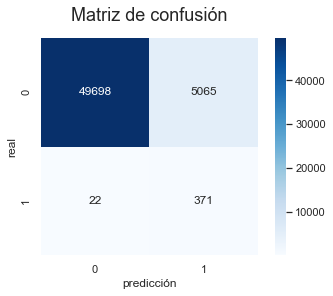



CPU times: user 1.95 s, sys: 47.6 ms, total: 1.99 s
Wall time: 1.65 s


In [256]:
%%time
basic_balancedRFC(trainX=X_SMVSMOTEIHTRUS, trainy=y_SVMSMOTEIHTRUS, testX=X_test, testy=y_test, 
                  weight='balanced')

In [257]:
%%time

from imblearn.pipeline import Pipeline

print(Counter(y_train))
svmsmote = SVMSMOTE(sampling_strategy=0.008, random_state=42)
iht = InstanceHardnessThreshold(random_state=42)
rus = RandomUnderSampler(random_state=42)
pipeline = Pipeline([('svmsmote', svmsmote), ('iht', iht), ('rus', rus)])
X_SMVSMOTEIHTRUS, y_SVMSMOTEIHTRUS = pipeline.fit_resample(X_train, y_train)
print(Counter(y_SVMSMOTEIHTRUS))
print('\n')

Counter({0: 255560, 1: 1833})
Counter({0: 2044, 1: 2044})


CPU times: user 8min 53s, sys: 5.13 s, total: 8min 58s
Wall time: 9min 6s


Accuracy: 0.897
F1-binary: 0.117
Recall: 0.952


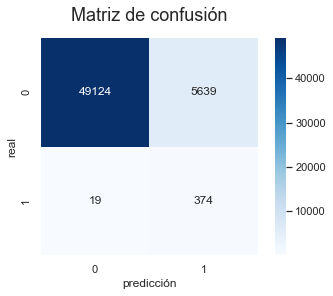



CPU times: user 1.79 s, sys: 37 ms, total: 1.83 s
Wall time: 1.43 s


In [258]:
%%time
basic_balancedRFC(trainX=X_SMVSMOTEIHTRUS, trainy=y_SVMSMOTEIHTRUS, testX=X_test, testy=y_test, 
                  weight='balanced')

In [259]:
%%time

from imblearn.pipeline import Pipeline

print(Counter(y_train))
svmsmote = SVMSMOTE(sampling_strategy=0.05, random_state=42)
iht = InstanceHardnessThreshold(random_state=42)
rus = RandomUnderSampler(random_state=42)
pipeline = Pipeline([('svmsmote', svmsmote), ('iht', iht), ('rus', rus)])
X_SMVSMOTEIHTRUS, y_SVMSMOTEIHTRUS = pipeline.fit_resample(X_train, y_train)
print(Counter(y_SVMSMOTEIHTRUS))
print('\n')

Counter({0: 255560, 1: 1833})
Counter({0: 12778, 1: 12778})


CPU times: user 9min 11s, sys: 5.29 s, total: 9min 17s
Wall time: 9min 25s


Accuracy: 0.942
F1-binary: 0.183
Recall: 0.911


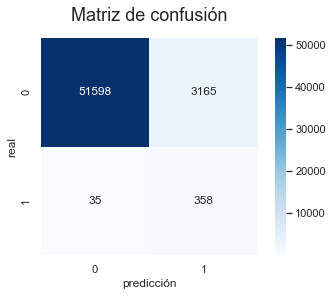



CPU times: user 3.32 s, sys: 81.7 ms, total: 3.4 s
Wall time: 3.09 s


In [260]:
%%time
basic_balancedRFC(trainX=X_SMVSMOTEIHTRUS, trainy=y_SVMSMOTEIHTRUS, testX=X_test, testy=y_test, 
                  weight='balanced')

In [261]:
%%time

from imblearn.pipeline import Pipeline

print(Counter(y_train))
svmsmote = SVMSMOTE(sampling_strategy=0.1)
iht = InstanceHardnessThreshold(random_state=42)
rus = RandomUnderSampler(random_state=42)
pipeline = Pipeline([('svmsmote', svmsmote), ('iht', iht), ('rus', rus)])
X_SMVSMOTEIHTRUS, y_SVMSMOTEIHTRUS = pipeline.fit_resample(X_train, y_train)
print(Counter(y_SVMSMOTEIHTRUS))
print('\n')

Counter({0: 255560, 1: 1833})
Counter({0: 25556, 1: 25556})


CPU times: user 9min 13s, sys: 5.21 s, total: 9min 18s
Wall time: 9min 25s


Accuracy: 0.952
F1-binary: 0.207
Recall: 0.875


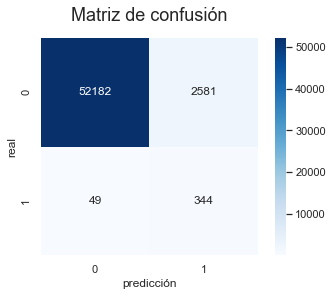



CPU times: user 5.13 s, sys: 71.5 ms, total: 5.2 s
Wall time: 4.82 s


In [262]:
%%time
basic_balancedRFC(trainX=X_SMVSMOTEIHTRUS, trainy=y_SVMSMOTEIHTRUS, testX=X_test, testy=y_test, 
                  weight='balanced')

In [263]:
%%time

from imblearn.pipeline import Pipeline

print(Counter(y_train))
svmsmote = SVMSMOTE(sampling_strategy=0.3)
iht = InstanceHardnessThreshold(random_state=42)
rus = RandomUnderSampler(random_state=42)
pipeline = Pipeline([('svmsmote', svmsmote), ('iht', iht), ('rus', rus)])
X_SMVSMOTEIHTRUS, y_SVMSMOTEIHTRUS = pipeline.fit_resample(X_train, y_train)
print(Counter(y_SVMSMOTEIHTRUS))
print('\n')

Counter({0: 255560, 1: 1833})
Counter({0: 76668, 1: 76668})


CPU times: user 10min 19s, sys: 7.78 s, total: 10min 27s
Wall time: 1h 26min 43s


Accuracy: 0.961
F1-binary: 0.235
Recall: 0.835


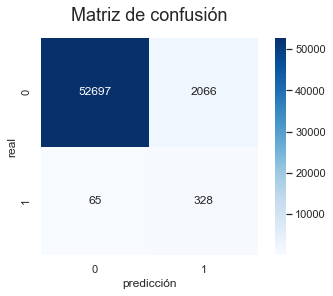



CPU times: user 15.4 s, sys: 202 ms, total: 15.6 s
Wall time: 15.5 s


In [264]:
%%time
basic_balancedRFC(trainX=X_SMVSMOTEIHTRUS, trainy=y_SVMSMOTEIHTRUS, testX=X_test, testy=y_test, 
                  weight='balanced')

In [265]:
%%time

from imblearn.pipeline import Pipeline

print(Counter(y_train))
smotenc = SMOTENC(sampling_strategy=0.1, categorical_features=[0, 1,2], random_state=42)
rus = RandomUnderSampler(random_state=42)
pipeline = Pipeline([('smotenc', smotenc), ('rus', rus)])
X_SMOTENCRUS, y_SMOTENCRUS = pipeline.fit_resample(X_train, y_train)
print(Counter(y_SMOTENCRUS))
print('\n')

Counter({0: 255560, 1: 1833})
Counter({0: 25556, 1: 25556})


CPU times: user 16.3 s, sys: 486 ms, total: 16.8 s
Wall time: 17 s


Accuracy: 0.955
F1-binary: 0.211
Recall: 0.842


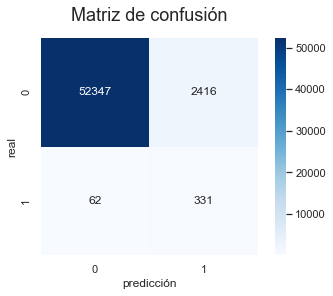



CPU times: user 5.37 s, sys: 137 ms, total: 5.51 s
Wall time: 5.13 s


In [266]:
%%time
basic_balancedRFC(trainX=X_SMOTENCRUS, trainy=y_SMOTENCRUS, testX=X_test, testy=y_test, 
                  weight='balanced')

In [267]:
%%time

from imblearn.pipeline import Pipeline

print(Counter(y_train))
smotenc = SMOTENC(sampling_strategy=0.008, categorical_features=[0, 1,2], random_state=1)
rus = RandomUnderSampler(random_state=1)
pipeline = Pipeline([('smotenc', smotenc), ('rus', rus)])
X_SMOTENCRUS, y_SMOTENCRUS = pipeline.fit_resample(X_train, y_train)
print(Counter(y_SMOTENCRUS))
print('\n')

Counter({0: 255560, 1: 1833})
Counter({0: 2044, 1: 2044})


CPU times: user 14.6 s, sys: 452 ms, total: 15.1 s
Wall time: 15 s


Accuracy: 0.909
F1-binary: 0.129
Recall: 0.954


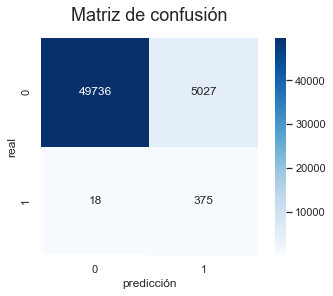



CPU times: user 1.86 s, sys: 53.2 ms, total: 1.91 s
Wall time: 1.52 s


In [268]:
%%time
basic_balancedRFC(trainX=X_SMOTENCRUS, trainy=y_SMOTENCRUS, testX=X_test, testy=y_test, 
                  weight='balanced')

In [269]:
%%time

print(Counter(y_train))

smotenc = SMOTENC(sampling_strategy=0.1, categorical_features=[0, 1,2], random_state=42)
iht = InstanceHardnessThreshold(random_state=42)
pipeline = Pipeline([('smotenc', smotenc), ('iht', iht)])
X_SMOTENCIHT, y_SMOTENCIHT = pipeline.fit_resample(X_train, y_train)

print(Counter(y_SMOTENCIHT))
print('\n')

Counter({0: 255560, 1: 1833})
Counter({0: 223188, 1: 25556})


CPU times: user 2min 43s, sys: 3.16 s, total: 2min 46s
Wall time: 2min 50s


Accuracy: 0.930
F1-binary: 0.153
Recall: 0.885


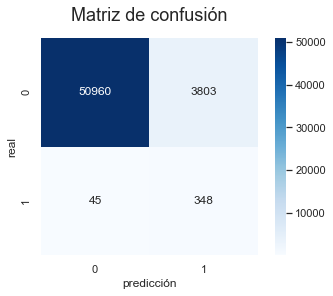



CPU times: user 26.5 s, sys: 775 ms, total: 27.3 s
Wall time: 28.5 s


In [270]:
%%time
basic_balancedRFC(trainX=X_SMOTENCIHT, trainy=y_SMOTENCIHT, testX=X_test, testy=y_test, 
                  weight='balanced')

In [271]:
%%time

print(Counter(y_train))

smotenc = SMOTENC(sampling_strategy=0.1, categorical_features=[0, 1,2], random_state=42)
iht = InstanceHardnessThreshold(random_state=42)
rus = RandomUnderSampler(random_state=42)
pipeline = Pipeline([('smotenc', smotenc), ('iht', iht), ('rus', rus)])
X_SMOTENCIHTRUS, y_SMOTENCIHTRUS = pipeline.fit_resample(X_train, y_train)

print(Counter(y_SMOTENCIHTRUS))
print('\n')

Counter({0: 255560, 1: 1833})
Counter({0: 25556, 1: 25556})


CPU times: user 2min 49s, sys: 3.31 s, total: 2min 52s
Wall time: 2min 57s


Accuracy: 0.906
F1-binary: 0.123
Recall: 0.929


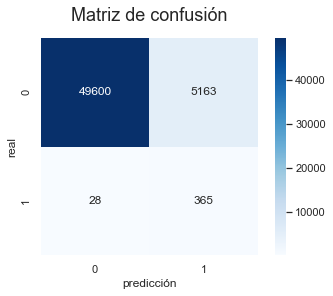



CPU times: user 4.89 s, sys: 79.3 ms, total: 4.97 s
Wall time: 4.7 s


In [272]:
%%time
basic_balancedRFC(trainX=X_SMOTENCIHTRUS, trainy=y_SMOTENCIHTRUS, testX=X_test, testy=y_test, 
                  weight='balanced')

In [273]:
%%time

print(Counter(y_train))

smotenc = SMOTENC(sampling_strategy=0.05, categorical_features=[0, 1,2], random_state=42)
iht = InstanceHardnessThreshold(random_state=42)
rus = RandomUnderSampler(random_state=42)
pipeline = Pipeline([('smotenc', smotenc), ('iht', iht), ('rus', rus)])
X_SMOTENCIHTRUS, y_SMOTENCIHTRUS = pipeline.fit_resample(X_train, y_train)

print(Counter(y_SMOTENCIHTRUS))
print('\n')

Counter({0: 255560, 1: 1833})
Counter({0: 12778, 1: 12778})


CPU times: user 2min 33s, sys: 2.5 s, total: 2min 36s
Wall time: 2min 39s


Accuracy: 0.907
F1-binary: 0.126
Recall: 0.947


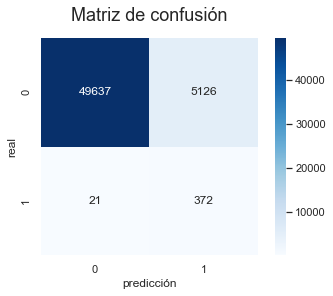



CPU times: user 3.39 s, sys: 78.5 ms, total: 3.47 s
Wall time: 3.28 s


In [274]:
%%time
basic_balancedRFC(trainX=X_SMOTENCIHTRUS, trainy=y_SMOTENCIHTRUS, testX=X_test, testy=y_test, 
                  weight='balanced')

In [315]:
%%time

print(Counter(y_train))

smotenc = SMOTENC(sampling_strategy=0.01, categorical_features=[0, 1,2], random_state=42)
iht = InstanceHardnessThreshold(random_state=42)
rus = RandomUnderSampler(random_state=42)
pipeline = Pipeline([('smotenc', smotenc), ('iht', iht), ('rus', rus)])
X_SMOTENCIHTRUS, y_SMOTENCIHTRUS = pipeline.fit_resample(X_train, y_train)

print(Counter(y_SMOTENCIHTRUS))
print('\n')

Counter({0: 255560, 1: 1833})
Counter({0: 2555, 1: 2555})


CPU times: user 2min 18s, sys: 1.81 s, total: 2min 20s
Wall time: 2min 22s


Accuracy: 0.894
F1-binary: 0.115
Recall: 0.967


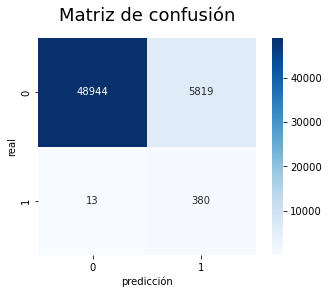



CPU times: user 2.01 s, sys: 56.5 ms, total: 2.06 s
Wall time: 1.78 s


In [316]:
%%time
basic_balancedRFC(trainX=X_SMOTENCIHTRUS, trainy=y_SMOTENCIHTRUS, testX=X_test, testy=y_test, 
                  weight='balanced')

In [317]:
%%time

print(Counter(y_train))

smotenc = SMOTENC(sampling_strategy=0.008, categorical_features=[0, 1,2], random_state=42)
iht = InstanceHardnessThreshold(random_state=42)
rus = RandomUnderSampler(random_state=42)
pipeline = Pipeline([('smotenc', smotenc), ('iht', iht), ('rus', rus)])
X_SMOTENCIHTRUS, y_SMOTENCIHTRUS = pipeline.fit_resample(X_train, y_train)

print(Counter(y_SMOTENCIHTRUS))
print('\n')

Counter({0: 255560, 1: 1833})
Counter({0: 2044, 1: 2044})


CPU times: user 2min 22s, sys: 1.92 s, total: 2min 24s
Wall time: 2min 29s


Accuracy: 0.899
F1-binary: 0.118
Recall: 0.947


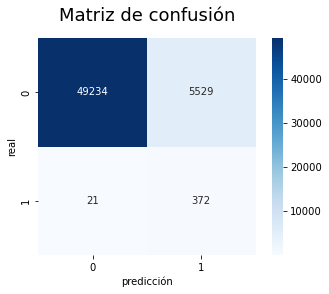



CPU times: user 1.95 s, sys: 45 ms, total: 1.99 s
Wall time: 1.64 s


In [318]:
%%time
basic_balancedRFC(trainX=X_SMOTENCIHTRUS, trainy=y_SMOTENCIHTRUS, testX=X_test, testy=y_test, 
                  weight='balanced')

In [279]:
%%time

print(Counter(y_train))

iht = InstanceHardnessThreshold(random_state=42)
rus = RandomUnderSampler(random_state=42)
pipeline = Pipeline([('iht', iht), ('rus', rus)])
X_IHTRUS, y_IHTRUS = pipeline.fit_resample(X_train, y_train)

print(Counter(y_IHTRUS))
print('\n')

Counter({0: 255560, 1: 1833})
Counter({0: 1833, 1: 1833})


CPU times: user 1min 58s, sys: 1.41 s, total: 2min
Wall time: 2min 2s


Accuracy: 0.903
F1-binary: 0.122
Recall: 0.954


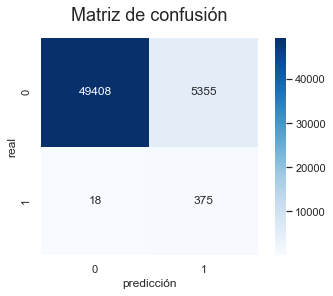



CPU times: user 1.82 s, sys: 40.7 ms, total: 1.86 s
Wall time: 1.47 s


In [280]:
%%time
basic_balancedRFC(trainX=X_IHTRUS, trainy=y_IHTRUS, testX=X_test, testy=y_test, 
                  weight='balanced')

In [281]:
%%time

print(Counter(y_train))

iht = InstanceHardnessThreshold(sampling_strategy=0.01, random_state=42)
rus = RandomUnderSampler(random_state=42)
pipeline = Pipeline([('iht', iht), ('rus', rus)])
X_IHTRUS, y_IHTRUS = pipeline.fit_resample(X_train, y_train)

print(Counter(y_IHTRUS))
print('\n')

Counter({0: 255560, 1: 1833})
Counter({0: 1833, 1: 1833})


CPU times: user 1min 58s, sys: 1.38 s, total: 1min 59s
Wall time: 2min


Accuracy: 0.903
F1-binary: 0.122
Recall: 0.954


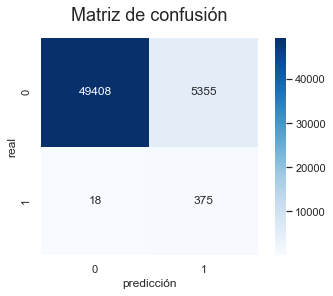



CPU times: user 1.88 s, sys: 42.2 ms, total: 1.92 s
Wall time: 1.86 s


In [282]:
%%time
basic_balancedRFC(trainX=X_IHTRUS, trainy=y_IHTRUS, testX=X_test, testy=y_test, 
                  weight='balanced')

In [283]:
%%time
dill.dump_session('TFM_notebook_env.db')

CPU times: user 1min 34s, sys: 5.33 s, total: 1min 40s
Wall time: 1min 42s


### Selección de dataset resampleado

In [529]:
%%time

print(Counter(y_train))

smotenc = SMOTENC(sampling_strategy=0.01, categorical_features=[0, 1,2], random_state=42)
iht = InstanceHardnessThreshold(random_state=42)
rus = RandomUnderSampler(random_state=42)
pipeline = Pipeline([('smotenc', smotenc), ('iht', iht), ('rus', rus)])
X_SMOTENCIHTRUS, y_SMOTENCIHTRUS = pipeline.fit_resample(X_train, y_train)

print(Counter(y_SMOTENCIHTRUS))
print('\n')
basic_balancedRFC(trainX=X_SMOTENCIHTRUS, trainy=y_SMOTENCIHTRUS, testX=X_test, testy=y_test, 
                  weight='balanced')

Counter({0: 255560, 1: 1833})


TypeError: All intermediate steps should be transformers and implement fit and transform or be the string 'passthrough' 'SMOTENC(categorical_features=[0, 1, 2], random_state=42, sampling_strategy=0.01)' (type <class 'imblearn.over_sampling._smote.SMOTENC'>) doesn't

In [530]:
%%time

print(Counter(y_train))

smotenc = SMOTENC(sampling_strategy=0.01, categorical_features=[0, 1,2], random_state=42)
iht = InstanceHardnessThreshold(random_state=42)
rus = RandomUnderSampler(random_state=42)
pipeline = Pipeline([('smotenc', smotenc), ('iht', iht), ('rus', rus)])
X_SMOTENCIHTRUS0, y_SMOTENCIHTRUS0 = pipeline.fit_resample(X_train0, y_train)

print(Counter(y_SMOTENCIHTRUS0))
print('\n')
basic_balancedRFC(trainX=X_SMOTENCIHTRUS0, trainy=y_SMOTENCIHTRUS0, testX=X_test0, testy=y_test, 
                  weight='balanced')

Counter({0: 255560, 1: 1833})


TypeError: All intermediate steps should be transformers and implement fit and transform or be the string 'passthrough' 'SMOTENC(categorical_features=[0, 1, 2], random_state=42, sampling_strategy=0.01)' (type <class 'imblearn.over_sampling._smote.SMOTENC'>) doesn't

Counter({0: 255560, 1: 1833})
Counter({0: 2838, 1: 2555})


Accuracy: 0.899
F1-binary: 0.120
Recall: 0.962


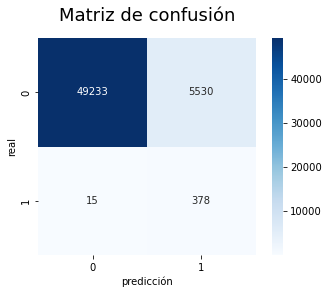



CPU times: user 2min 32s, sys: 2.39 s, total: 2min 35s
Wall time: 2min 42s


In [314]:
%%time

print(Counter(y_train))

smotenc = SMOTENC(sampling_strategy=0.01, categorical_features=[0, 1,2], random_state=42)
iht = InstanceHardnessThreshold(random_state=42)
rus = RandomUnderSampler(sampling_strategy=0.9, random_state=42)
pipeline = Pipeline([('smotenc', smotenc), ('iht', iht), ('rus', rus)])
X_SMOTENCIHTRUS1, y_SMOTENCIHTRUS1 = pipeline.fit_resample(X_train, y_train)

print(Counter(y_SMOTENCIHTRUS1))
print('\n')
basic_balancedRFC(trainX=X_SMOTENCIHTRUS1, trainy=y_SMOTENCIHTRUS1, testX=X_test, testy=y_test, 
                  weight='balanced')

Counter({0: 255560, 1: 1833})
Counter({0: 3193, 1: 2555})


Accuracy: 0.902
F1-binary: 0.123
Recall: 0.959


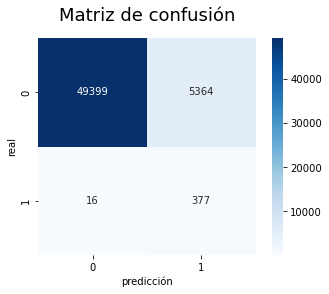



CPU times: user 2min 22s, sys: 1.94 s, total: 2min 24s
Wall time: 2min 26s


In [320]:
%%time

print(Counter(y_train))

smotenc = SMOTENC(sampling_strategy=0.01, categorical_features=[0, 1,2], random_state=42)
iht = InstanceHardnessThreshold(random_state=42)
rus = RandomUnderSampler(sampling_strategy=0.8, random_state=42)
pipeline = Pipeline([('smotenc', smotenc), ('iht', iht), ('rus', rus)])
X_SMOTENCIHTRUS2, y_SMOTENCIHTRUS2 = pipeline.fit_resample(X_train, y_train)

print(Counter(y_SMOTENCIHTRUS2))
print('\n')
basic_balancedRFC(trainX=X_SMOTENCIHTRUS2, trainy=y_SMOTENCIHTRUS2, testX=X_test, testy=y_test, 
                  weight='balanced')

Counter({0: 255560, 1: 1833})
Counter({0: 3650, 1: 2555})


Accuracy: 0.908
F1-binary: 0.129
Recall: 0.954


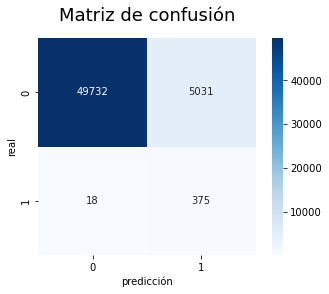



CPU times: user 2min 23s, sys: 1.89 s, total: 2min 25s
Wall time: 2min 28s


In [321]:
%%time

print(Counter(y_train))

smotenc = SMOTENC(sampling_strategy=0.01, categorical_features=[0, 1,2], random_state=42)
iht = InstanceHardnessThreshold(random_state=42)
rus = RandomUnderSampler(sampling_strategy=0.7, random_state=42)
pipeline = Pipeline([('smotenc', smotenc), ('iht', iht), ('rus', rus)])
X_SMOTENCIHTRUS3, y_SMOTENCIHTRUS3 = pipeline.fit_resample(X_train, y_train)

print(Counter(y_SMOTENCIHTRUS3))
print('\n')
basic_balancedRFC(trainX=X_SMOTENCIHTRUS3, trainy=y_SMOTENCIHTRUS3, testX=X_test, testy=y_test, 
                  weight='balanced')

El dataet seleccionado es el resultante de la combinación de SMOTENC, Instance Hardness Threshold y Random Undersample ya que ha sido el que mejor resultado ha dado aplicando un algoritmo Random Forest con pesos balanceados.

In [285]:
dill.dump_session('TFM_notebook_env.db')

# Selección del algortimo final

In [286]:
#import dill
#dill.load_session('TFM_notebook_env.db')

/Users/inigoab/opt/anaconda3/envs/TFM/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


Accuracy: 0.902
F1-binary: 0.117
Recall: 0.911


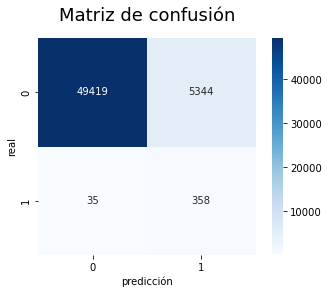



CPU times: user 1.4 s, sys: 190 ms, total: 1.59 s
Wall time: 705 ms


In [325]:
%%time
basic_balancedLRC(trainX=X_SMOTENCIHTRUS, trainy=y_SMOTENCIHTRUS, testX=X_test, testy=y_test, 
                  weight='balanced')

/Users/inigoab/opt/anaconda3/envs/TFM/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/Users/inigoab/opt/anaconda3/envs/TFM/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer 


El mejor parámetros es: {'class_weight': {0: 1, 1: 3}}
Accuracy: 0.843
F1-binary: 0.080
Recall: 0.959


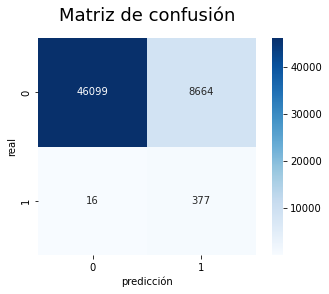



CPU times: user 2.33 s, sys: 445 ms, total: 2.77 s
Wall time: 9.65 s


In [327]:
%%time

balance = [{0:1,1:1}, {0:1,1:2}, {0:1,1:3}]

grid_LRC(trainX=X_SMOTENCIHTRUS, trainy=y_SMOTENCIHTRUS, testX=X_test, testy=y_test, 
                  balance=balance)

Accuracy: 0.823
F1-binary: 0.060
Recall: 0.789


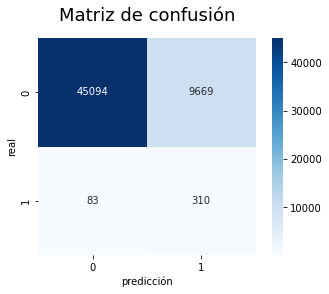



CPU times: user 750 ms, sys: 45.8 ms, total: 796 ms
Wall time: 508 ms


In [328]:
%%time
basic_GNB(trainX=X_SMOTENCIHTRUS, trainy=y_SMOTENCIHTRUS, testX=X_test, testy=y_test)

Accuracy: 0.890
F1-binary: 0.105
Recall: 0.906


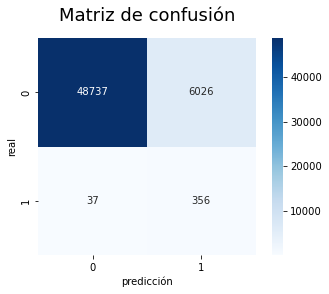



CPU times: user 6.01 s, sys: 119 ms, total: 6.13 s
Wall time: 6.01 s


In [329]:
%%time
basic_KNN(trainX=X_SMOTENCIHTRUS, trainy=y_SMOTENCIHTRUS, testX=X_test, testy=y_test)

Accuracy: 0.900
F1-binary: 0.119
Recall: 0.944


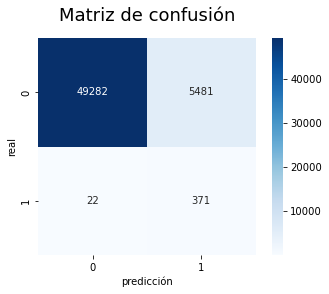



CPU times: user 694 ms, sys: 33.3 ms, total: 727 ms
Wall time: 516 ms


In [405]:
%%time
basic_balancedDTC(trainX=X_SMOTENCIHTRUS, trainy=y_SMOTENCIHTRUS, testX=X_test, testy=y_test, 
                  weight='balanced')

Accuracy: 0.900
F1-binary: 0.119
Recall: 0.944


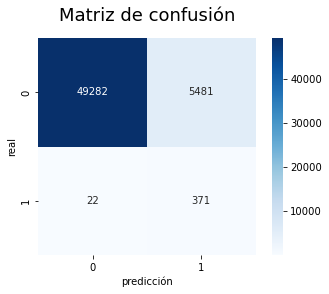



CPU times: user 759 ms, sys: 36.3 ms, total: 796 ms
Wall time: 498 ms


In [409]:
%%time
basic_balancedDTC(trainX=X_SMOTENCIHTRUS, trainy=y_SMOTENCIHTRUS, testX=X_test, testy=y_test, 
                  weight=50)

Peso estimado:  1.0
Accuracy: 0.907
F1-binary: 0.129
Recall: 0.969


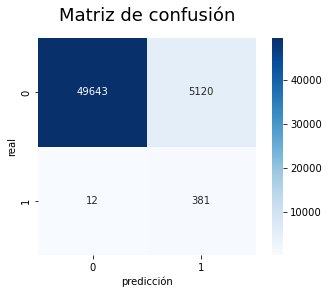

CPU times: user 2.86 s, sys: 292 ms, total: 3.15 s
Wall time: 1.61 s


In [337]:
%%time
balancedXGB(trainX=X_SMOTENCIHTRUS, trainy=y_SMOTENCIHTRUS, testX=X_test, testy=y_test, 
            weight='balanced')

Accuracy: 0.871
F1-binary: 0.098
Recall: 0.982


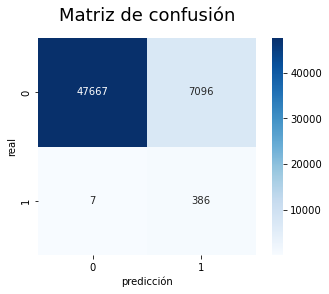

CPU times: user 2.88 s, sys: 233 ms, total: 3.11 s
Wall time: 1.55 s


In [362]:
%%time
balancedXGB(trainX=X_SMOTENCIHTRUS, trainy=y_SMOTENCIHTRUS, testX=X_test, testy=y_test, 
            weight=25)

Accuracy: 0.894
F1-binary: 0.115
Recall: 0.964


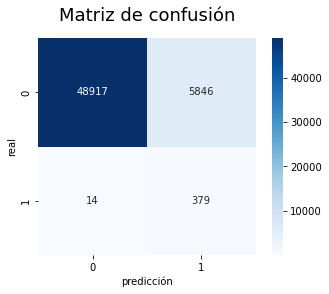



CPU times: user 2.35 s, sys: 62.5 ms, total: 2.41 s
Wall time: 2.12 s


In [339]:
%%time
basic_balancedRFC(trainX=X_SMOTENCIHTRUS, trainy=y_SMOTENCIHTRUS, testX=X_test, testy=y_test, 
                  weight='balanced_subsample')

Accuracy: 0.894
F1-binary: 0.115
Recall: 0.967


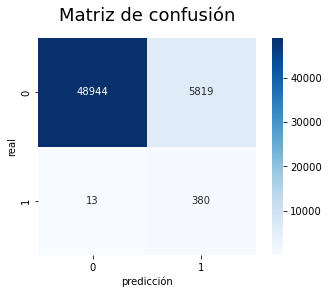



CPU times: user 2.15 s, sys: 86.9 ms, total: 2.24 s
Wall time: 2.01 s


In [340]:
%%time
basic_balancedRFC(trainX=X_SMOTENCIHTRUS, trainy=y_SMOTENCIHTRUS, testX=X_test, testy=y_test, 
                  weight='balanced')

Accuracy: 0.897
F1-binary: 0.119
Recall: 0.969


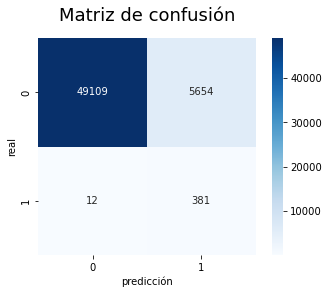



CPU times: user 2.02 s, sys: 52.3 ms, total: 2.07 s
Wall time: 1.75 s


In [351]:
%%time
basic_balancedRFC(trainX=X_SMOTENCIHTRUS, trainy=y_SMOTENCIHTRUS, testX=X_test, testy=y_test, 
                  weight={0:1,1:5})

In [296]:
dill.dump_session('TFM_notebook_env.db')

# Ajuste del algoritmo seleccionado

## Ajuste del algoritmo Random Forest

Fitting 20 folds for each of 140 candidates, totalling 2800 fits

Los mejores parámetros son: {'rfc__max_depth': 11, 'rfc__n_estimators': 200}


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    1.4s finished



Accuracy: 0.901
F1-binary: 0.122
Recall: 0.967


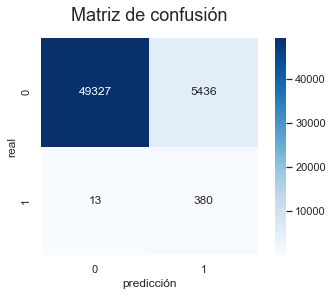



CPU times: user 36.1 s, sys: 4.1 s, total: 40.2 s
Wall time: 33min 45s


In [297]:
%%time
balancedRFC(trainX=X_SMOTENCIHTRUS, trainy=y_SMOTENCIHTRUS,
            testX=X_test, testy=y_test, 
            scoring='recall', weight='balanced',
            n_estimators=[50, 100, 200, 250, 300, 350, 400], 
            max_depth=range(5,25),
            standardize=False, normalize=False, pca=False)

Fitting 20 folds for each of 28 candidates, totalling 560 fits

Los mejores parámetros son: {'rfc__max_depth': 11, 'rfc__n_estimators': 100}


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.7s finished



Accuracy: 0.902
F1-binary: 0.122
Recall: 0.964


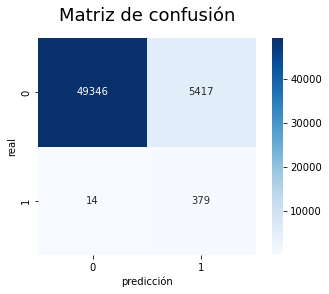



CPU times: user 10.7 s, sys: 988 ms, total: 11.6 s
Wall time: 4min


In [157]:
%%time
balancedRFC(trainX=X_SMOTENCIHTRUS, trainy=y_SMOTENCIHTRUS,
            testX=X_test, testy=y_test, 
            scoring='recall', weight='balanced',
            n_estimators=[50, 100, 200, 250], 
            max_depth=range(5,12),
            standardize=True, normalize=True, pca=False)

Fitting 20 folds for each of 28 candidates, totalling 560 fits

Los mejores parámetros son: {'rfc__max_depth': 11, 'rfc__n_estimators': 200}


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    1.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    1.6s finished



Accuracy: 0.901
F1-binary: 0.122
Recall: 0.967


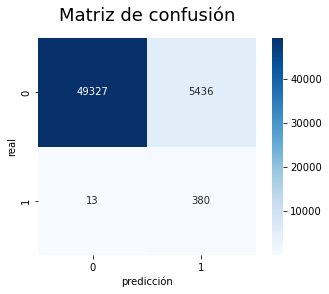



CPU times: user 12.3 s, sys: 1.02 s, total: 13.3 s
Wall time: 3min 52s


In [159]:
%%time
balancedRFC(trainX=X_SMOTENCIHTRUS, trainy=y_SMOTENCIHTRUS,
            testX=X_test, testy=y_test, 
            scoring='recall', weight='balanced',
            n_estimators=[50, 100, 200, 250], 
            max_depth=range(5,12),
            standardize=False, normalize=False, pca=False)

Fitting 20 folds for each of 6 candidates, totalling 120 fits

Los mejores parámetros son: {'rfc__max_depth': 11, 'rfc__n_estimators': 200}


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    1.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    1.3s finished



Accuracy: 0.894
F1-binary: 0.116
Recall: 0.972


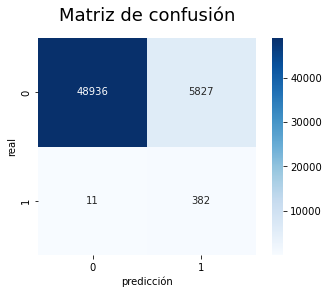



CPU times: user 7.52 s, sys: 374 ms, total: 7.9 s
Wall time: 2min 2s


In [380]:
%%time
balancedRFC(trainX=X_SMOTENCIHTRUS, trainy=y_SMOTENCIHTRUS,
            testX=X_test, testy=y_test, 
            scoring='recall', weight='balanced',
            n_estimators=[100,150,200], 
            max_depth=range(10,12),
            standardize=True, normalize=True, pca=True)

Fitting 20 folds for each of 2 candidates, totalling 40 fits

Los mejores parámetros son: {'rfc__max_depth': 10, 'rfc__n_estimators': 75}


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  75 out of  75 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  75 out of  75 | elapsed:    0.5s finished



Accuracy: 0.893
F1-binary: 0.115
Recall: 0.975


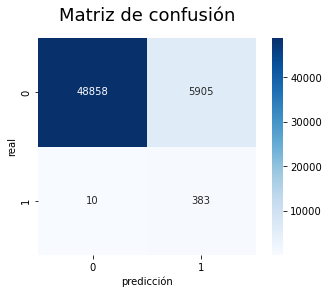



CPU times: user 2.46 s, sys: 109 ms, total: 2.57 s
Wall time: 7.83 s


In [378]:
%%time
balancedRFC(trainX=X_SMOTENCIHTRUS, trainy=y_SMOTENCIHTRUS,
            testX=X_test, testy=y_test, 
            scoring='recall', weight='balanced',
            n_estimators=[50, 75], 
            max_depth=range(10,11),
            standardize=False, normalize=False, pca=False)

Fitting 20 folds for each of 30 candidates, totalling 600 fits

Los mejores parámetros son: {'rfc__max_depth': 10, 'rfc__n_estimators': 80}


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  80 out of  80 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  80 out of  80 | elapsed:    0.6s finished



Accuracy: 0.893
F1-binary: 0.115
Recall: 0.975


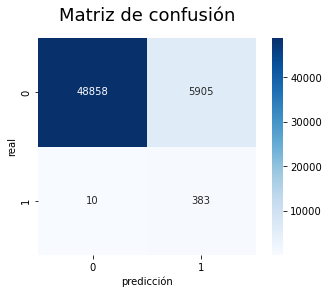



CPU times: user 9.79 s, sys: 986 ms, total: 10.8 s
Wall time: 2min 30s


In [410]:
%%time
balancedRFC(trainX=X_SMOTENCIHTRUS, trainy=y_SMOTENCIHTRUS,
            testX=X_test, testy=y_test, 
            scoring='recall', weight='balanced',
            n_estimators=range(60,90), 
            max_depth=[10],
            standardize=False, normalize=False, pca=False)

Fitting 20 folds for each of 1 candidates, totalling 20 fits

Los mejores parámetros son: {'rfc__max_depth': 10, 'rfc__n_estimators': 75}


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  75 out of  75 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  75 out of  75 | elapsed:    0.5s finished



Accuracy: 0.893
F1-binary: 0.115
Recall: 0.975


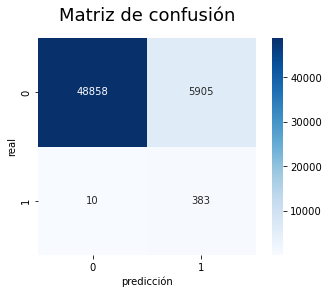



CPU times: user 2.19 s, sys: 83.6 ms, total: 2.28 s
Wall time: 6.01 s


In [395]:
%%time
balancedRFC(trainX=X_SMOTENCIHTRUS, trainy=y_SMOTENCIHTRUS,
            testX=X_test, testy=y_test, 
            scoring='recall', 
            #weight='balanced',
            n_estimators=[75], 
            max_depth=[10],
            standardize=False, normalize=False, pca=False)

Fitting 20 folds for each of 3 candidates, totalling 60 fits

Los mejores parámetros son: {'rfc__class_weight': {0: 1, 1: 8}, 'rfc__max_depth': 10, 'rfc__n_estimators': 75}


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  75 out of  75 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  75 out of  75 | elapsed:    0.5s finished



Accuracy: 0.859
F1-binary: 0.090
Recall: 0.975


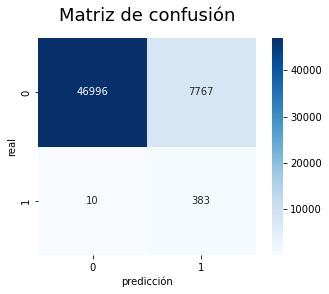



CPU times: user 2.73 s, sys: 131 ms, total: 2.86 s
Wall time: 13.9 s


In [387]:
%%time

balance =[{0:1,1:3.5}, {0:1,1:5}, {0:1,1:8}]

grid_balancedRFC(trainX=X_SMOTENCIHTRUS, trainy=y_SMOTENCIHTRUS,
                 testX=X_test, testy=y_test, 
                scoring='recall', weights=balance,
                 n_estimators=[75], 
                 max_depth=[10],
                standardize=False, normalize=False, pca=False)

Fitting 20 folds for each of 21 candidates, totalling 420 fits

Los mejores parámetros son: {'rfc__class_weight': {0: 1, 1: 3.5}, 'rfc__max_depth': 8, 'rfc__n_estimators': 50}


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    0.9s finished



Accuracy: 0.861
F1-binary: 0.091
Recall: 0.975


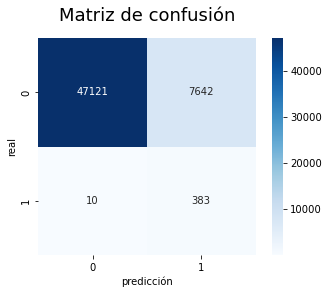



CPU times: user 7.33 s, sys: 629 ms, total: 7.96 s
Wall time: 3min 3s


In [388]:
%%time

balance =[{0:1,1:3.5}]

grid_balancedRFC(trainX=X_SMOTENCIHTRUS, trainy=y_SMOTENCIHTRUS,
                 testX=X_test, testy=y_test, 
                scoring='recall', weights=balance,
                 n_estimators=[50, 75, 100], max_depth=range(5,12),
                standardize=False, normalize=False, pca=False)

## Ajuste del algoritmo Árbol de decisión

Fitting 30 folds for each of 288 candidates, totalling 8640 fits

Los mejores parámetros son: {'class_weight': {0: 1, 1: 1.02}, 'max_depth': 4, 'min_samples_split': 2}
Accuracy: 0.858
F1-binary: 0.089
Recall: 0.969


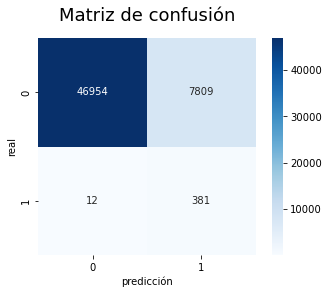



CPU times: user 42 s, sys: 5 s, total: 47 s
Wall time: 1min 54s


In [396]:
%%time

grid_balancedDTC(trainX=X_SMOTENCIHTRUS, trainy=y_SMOTENCIHTRUS, testX=X_test, testy=y_test, 
                 max_depth= range(2, 50),
                 min_samples_split= [2, 3, 5],
                 class_weight= [{0:1,1:1.02},{0:1,1:1.05}],
                 scoring= 'recall')

Fitting 30 folds for each of 3 candidates, totalling 90 fits

Los mejores parámetros son: {'class_weight': {0: 1, 1: 100}, 'max_depth': 4, 'min_samples_split': 2}
Accuracy: 0.858
F1-binary: 0.089
Recall: 0.969


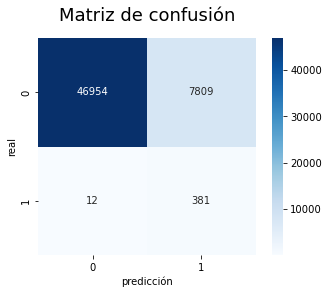



CPU times: user 1.15 s, sys: 112 ms, total: 1.26 s
Wall time: 1.86 s


In [416]:
%%time

grid_balancedDTC(trainX=X_SMOTENCIHTRUS, trainy=y_SMOTENCIHTRUS, testX=X_test, testy=y_test, 
                 max_depth= [4],
                 min_samples_split= [2],
                 #class_weight= [{0:1,1:1}],
                 scoring= 'recall')

Fitting 30 folds for each of 8 candidates, totalling 240 fits

Los mejores parámetros son: {'class_weight': {0: 1, 1: 1}, 'max_depth': 4, 'min_samples_split': 2}
Accuracy: 0.858
F1-binary: 0.089
Recall: 0.969


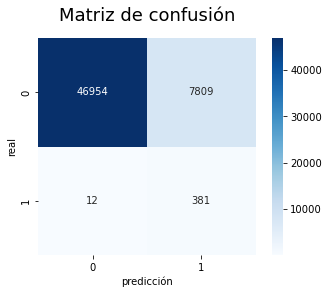



CPU times: user 1.96 s, sys: 162 ms, total: 2.12 s
Wall time: 2.69 s


In [404]:
%%time

grid_balancedDTC(trainX=X_SMOTENCIHTRUS, trainy=y_SMOTENCIHTRUS, testX=X_test, testy=y_test, 
                 max_depth= range(2, 6),
                 min_samples_split= [2, 4],
                 class_weight= [
                     #{0:1,1:1.01}, 
                     #{0:1,1:1.02},
                     #{0:1,1:1.05},
                     {0:1,1:1},
                               ],
                 scoring= 'recall')

# Algoritmo final y validación

In [27]:
#import dill
#dill.load_session('TFM_notebook_env.db')

Accuracy: 0.868
F1-binary: 0.094
Recall: 0.964


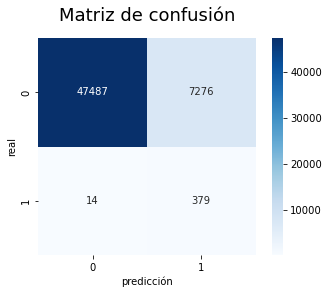



CPU times: user 844 ms, sys: 37.6 ms, total: 882 ms
Wall time: 1.03 s


In [533]:
%%time

rfc= RandomForestClassifier(random_state=42,
                            n_estimators=25,
                            max_depth=5,
                            class_weight= 'balanced', 
                            bootstrap=False)

rfc.fit(X_SMOTENCIHTRUS, y_SMOTENCIHTRUS)
    
pred = rfc.predict(X_val)
print("Accuracy: {:.3f}".format(accuracy_score(y_val, pred)))
print("F1-binary: {:.3f}".format(f1_score(y_val, pred, average='binary'))) 
print("Recall: {:.3f}".format(recall_score(y_val, pred))) 

matriz = confusion_matrix(y_val, pred)
sns.heatmap(matriz, annot=True, fmt="d", cmap='Blues', square=True)
plt.xlabel("predicción")
plt.ylabel("real")
plt.title('Matriz de confusión', y=1.05, size=18)
plt.show()
print('\n')

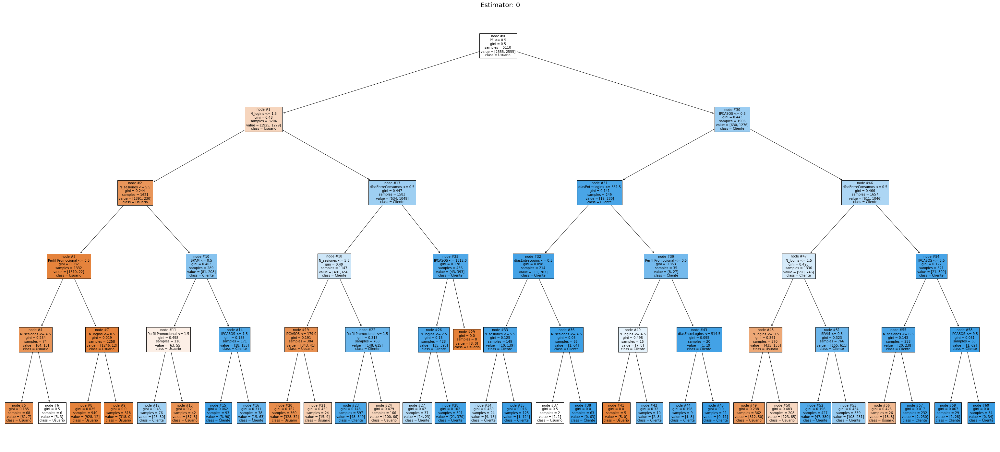

CPU times: user 13.3 s, sys: 716 ms, total: 14 s
Wall time: 19.7 s


In [534]:
%%time

from sklearn.tree import plot_tree

estimator = 0

plt.subplots(figsize=(55,25))
plot_tree(rfc.estimators_[estimator],
          feature_names = X_train.columns, 
          class_names = ['Usuario', 'Cliente'],
          filled=True, node_ids=True, fontsize=10)

plt.title(f'Estimator: {estimator}', fontsize = 20)

plt.savefig(f'rf_tree_{estimator}.png')

plt.show()

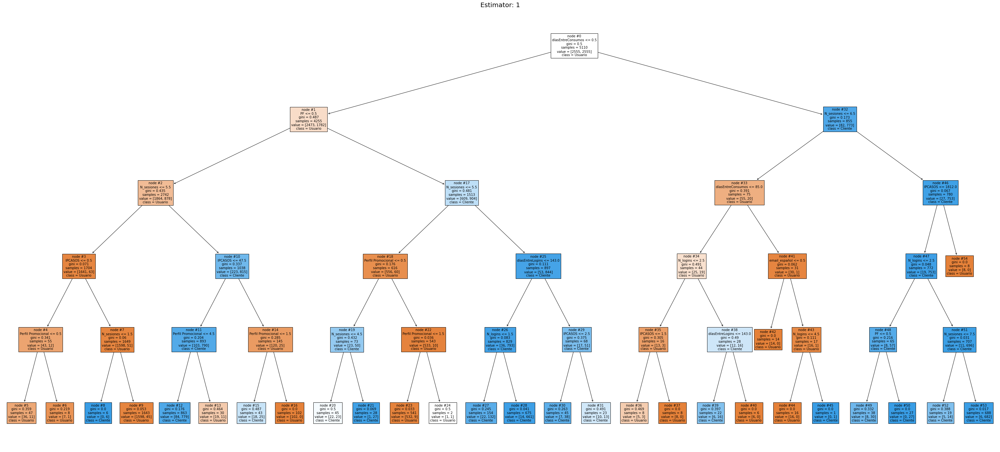

CPU times: user 11.5 s, sys: 601 ms, total: 12.1 s
Wall time: 17.7 s


In [535]:
%%time

from sklearn.tree import plot_tree

estimator = 1

plt.subplots(figsize=(55,25))
plot_tree(rfc.estimators_[estimator],
          feature_names = X_train.columns, 
          class_names = ['Usuario', 'Cliente'],
          filled=True, node_ids=True, fontsize=10)

plt.title(f'Estimator: {estimator}', fontsize = 20)

plt.savefig(f'rf_tree_{estimator}.png')
    
plt.show()

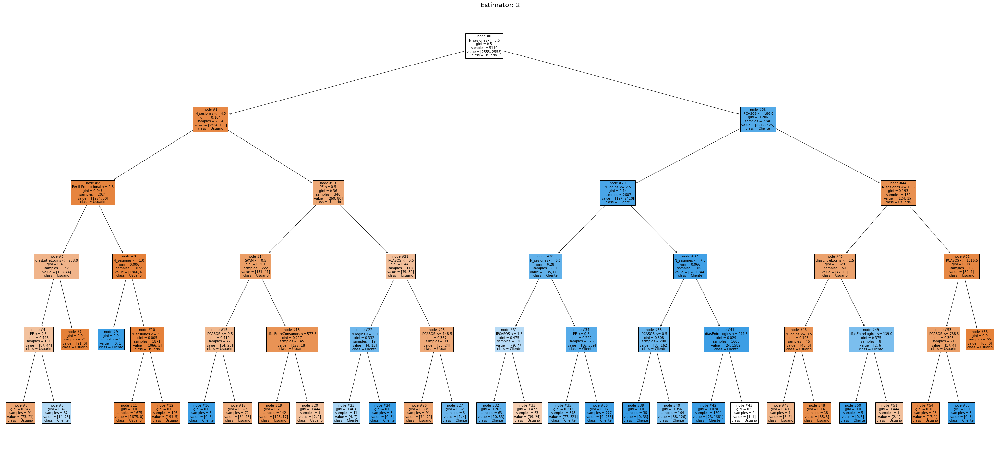

CPU times: user 12.9 s, sys: 642 ms, total: 13.5 s
Wall time: 22.2 s


In [536]:
%%time

from sklearn.tree import plot_tree

estimator = 2

plt.subplots(figsize=(55,25))
plot_tree(rfc.estimators_[estimator],
          feature_names = X_train.columns, 
          class_names = ['Usuario', 'Cliente'],
          filled=True, node_ids=True, fontsize=10)

plt.title(f'Estimator: {estimator}', fontsize = 20)

plt.savefig(f'rf_tree_{estimator}.png')
    
plt.show()



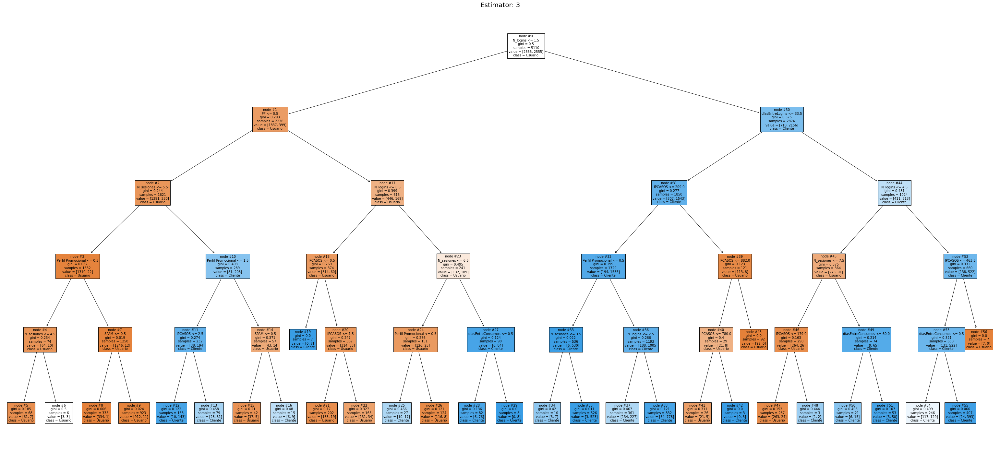

CPU times: user 12.2 s, sys: 654 ms, total: 12.9 s
Wall time: 18.3 s


In [537]:
%%time

from sklearn.tree import plot_tree

estimator = 3

plt.subplots(figsize=(55,25))
plot_tree(rfc.estimators_[estimator],
          feature_names = X_train.columns, 
          class_names = ['Usuario', 'Cliente'],
          filled=True, node_ids=True, fontsize=10)

plt.title(f'Estimator: {estimator}', fontsize = 20)

plt.savefig(f'rf_tree_{estimator}.png')
    
plt.show()

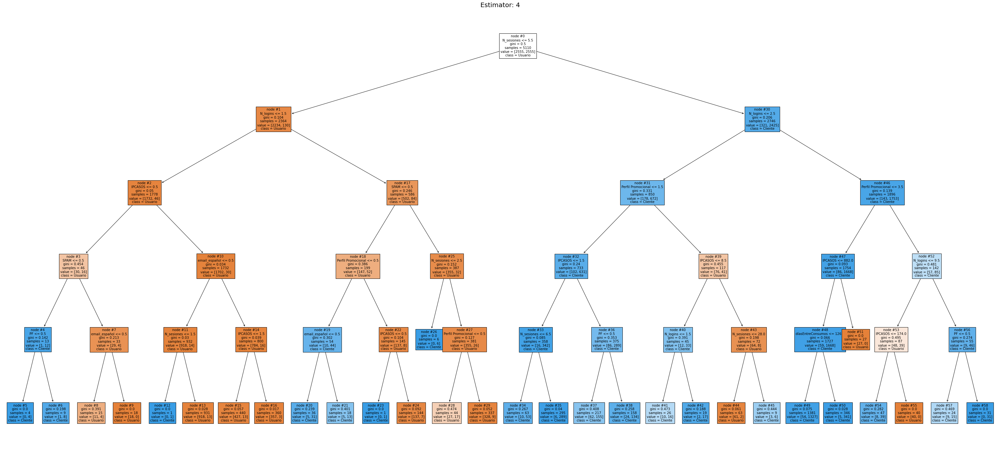

CPU times: user 11.8 s, sys: 648 ms, total: 12.5 s
Wall time: 15.8 s


In [538]:
%%time

from sklearn.tree import plot_tree

estimator = 4

plt.subplots(figsize=(55,25))
plot_tree(rfc.estimators_[estimator],
          feature_names = X_train.columns, 
          class_names = ['Usuario', 'Cliente'],
          filled=True, node_ids=True, fontsize=10)

plt.title(f'Estimator: {estimator}', fontsize = 20)

plt.savefig(f'rf_tree_{estimator}.png')
    
plt.show()

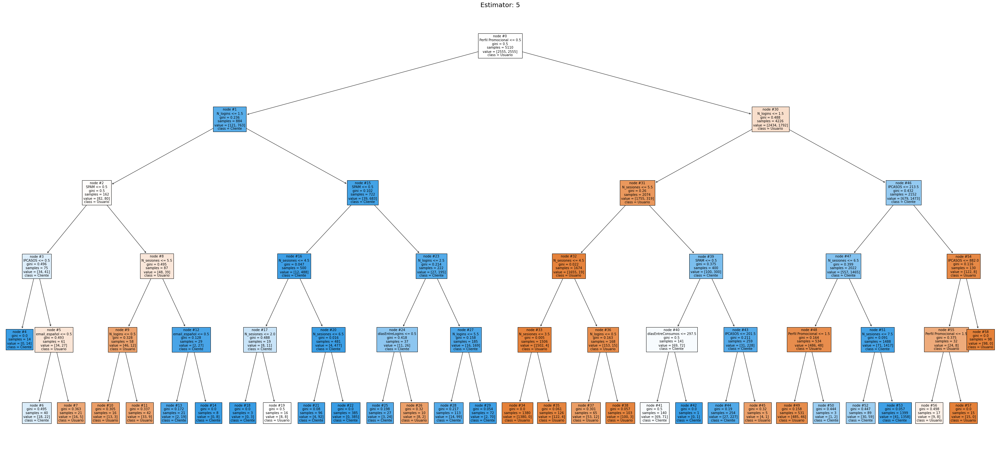

CPU times: user 12.5 s, sys: 675 ms, total: 13.1 s
Wall time: 19 s


In [539]:
%%time

from sklearn.tree import plot_tree

estimator = 5

plt.subplots(figsize=(55,25))
plot_tree(rfc.estimators_[estimator],
          feature_names = X_train.columns, 
          class_names = ['Usuario', 'Cliente'],
          filled=True, node_ids=True, fontsize=10)

plt.title(f'Estimator: {estimator}', fontsize = 20)

plt.savefig(f'rf_tree_{estimator}.png')
    
plt.show()

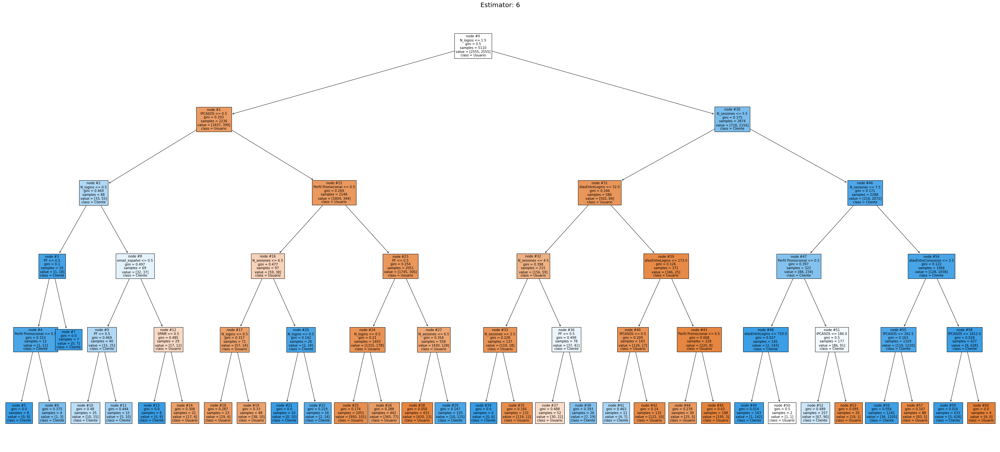

CPU times: user 14.1 s, sys: 817 ms, total: 14.9 s
Wall time: 23.3 s


In [540]:
%%time

from sklearn.tree import plot_tree

estimator = 6

plt.subplots(figsize=(55,25))
plot_tree(rfc.estimators_[estimator],
          feature_names = X_train.columns, 
          class_names = ['Usuario', 'Cliente'],
          filled=True, node_ids=True, fontsize=10)

plt.title(f'Estimator: {estimator}', fontsize = 20)

plt.savefig(f'rf_tree_{estimator}.png')
    
plt.show()

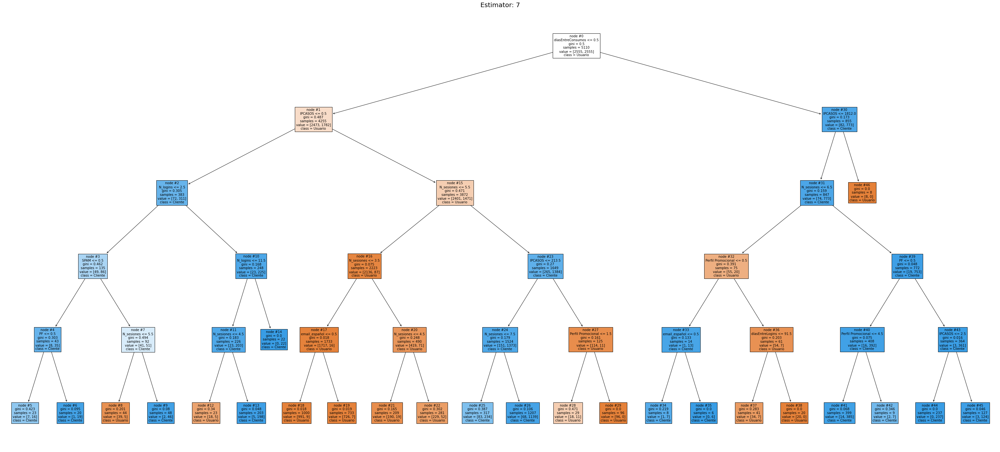

CPU times: user 9.82 s, sys: 453 ms, total: 10.3 s
Wall time: 14.5 s


In [541]:
%%time

from sklearn.tree import plot_tree

estimator = 7

plt.subplots(figsize=(55,25))
plot_tree(rfc.estimators_[estimator],
          feature_names = X_train.columns, 
          class_names = ['Usuario', 'Cliente'],
          filled=True, node_ids=True, fontsize=10)

plt.title(f'Estimator: {estimator}', fontsize = 20)

plt.savefig(f'rf_tree_{estimator}.png')
    
plt.show()

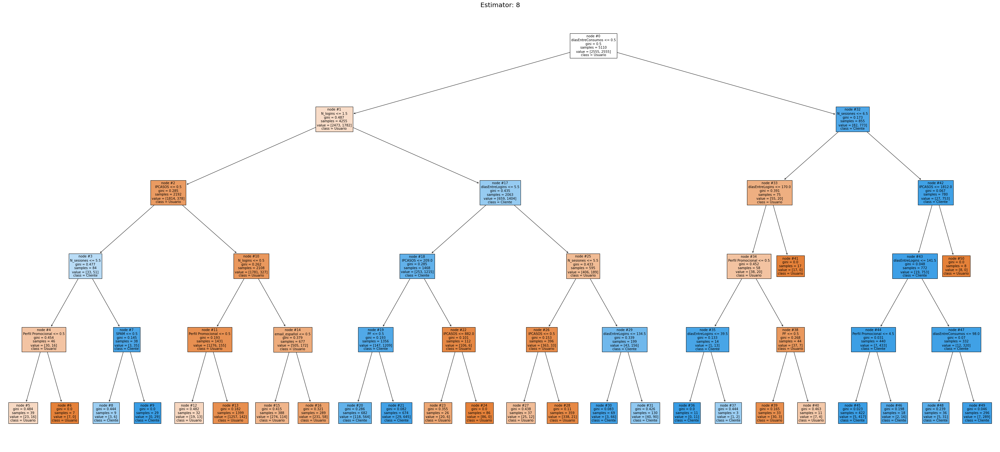

CPU times: user 10.5 s, sys: 565 ms, total: 11.1 s
Wall time: 13.1 s


In [542]:
%%time

from sklearn.tree import plot_tree

estimator = 8

plt.subplots(figsize=(55,25))
plot_tree(rfc.estimators_[estimator],
          feature_names = X_train.columns, 
          class_names = ['Usuario', 'Cliente'],
          filled=True, node_ids=True, fontsize=10)

plt.title(f'Estimator: {estimator}', fontsize = 20)

plt.savefig(f'rf_tree_{estimator}.png')
    
plt.show()

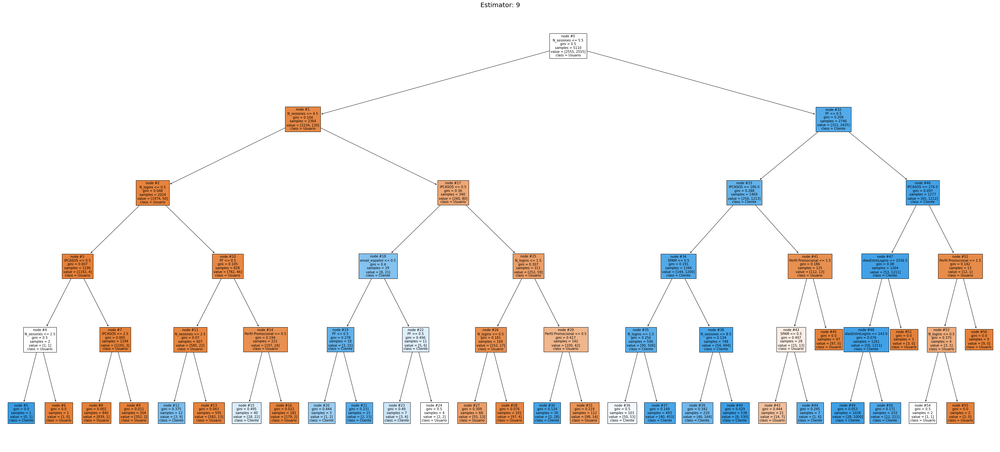

CPU times: user 12.5 s, sys: 602 ms, total: 13.1 s
Wall time: 18 s


In [543]:
%%time

from sklearn.tree import plot_tree

estimator = 9

plt.subplots(figsize=(55,25))
plot_tree(rfc.estimators_[estimator],
          feature_names = X_train.columns, 
          class_names = ['Usuario', 'Cliente'],
          filled=True, node_ids=True, fontsize=10)

plt.title(f'Estimator: {estimator}', fontsize = 20)

plt.savefig(f'rf_tree_{estimator}.png')
    
plt.show()

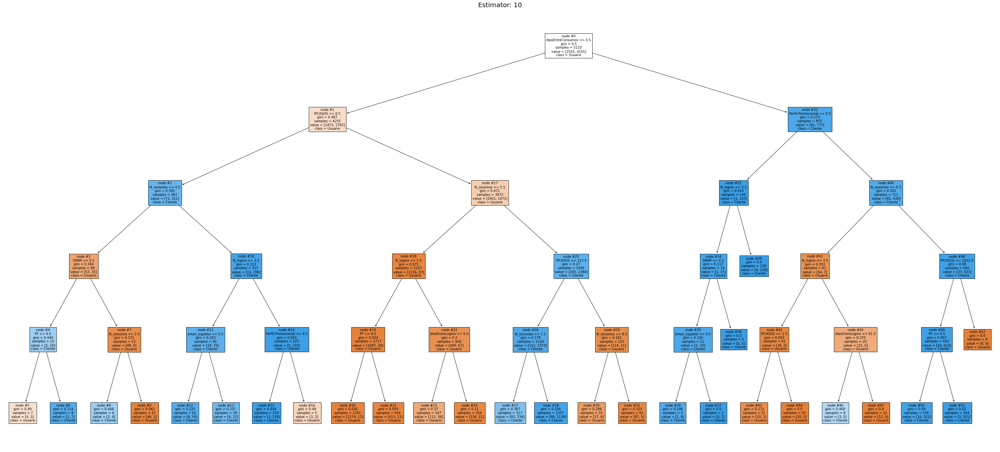

CPU times: user 12.1 s, sys: 568 ms, total: 12.6 s
Wall time: 19.9 s


In [544]:
%%time

from sklearn.tree import plot_tree

estimator = 10

plt.subplots(figsize=(55,25))
plot_tree(rfc.estimators_[estimator],
          feature_names = X_train.columns, 
          class_names = ['Usuario', 'Cliente'],
          filled=True, node_ids=True, fontsize=10)

plt.title(f'Estimator: {estimator}', fontsize = 20)

plt.savefig(f'rf_tree_{estimator}.png')
    
plt.show()

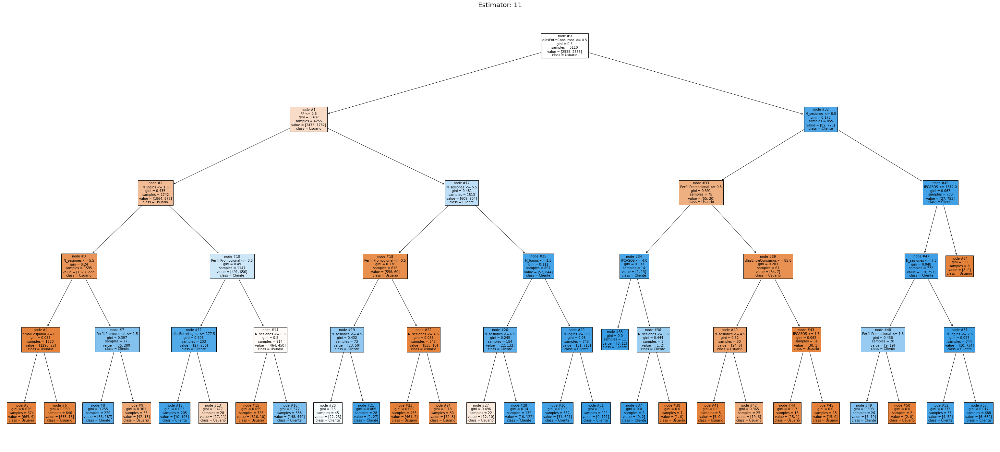

CPU times: user 11.2 s, sys: 564 ms, total: 11.7 s
Wall time: 15.6 s


In [545]:
%%time

from sklearn.tree import plot_tree

estimator = 11

plt.subplots(figsize=(55,25))
plot_tree(rfc.estimators_[estimator],
          feature_names = X_train.columns, 
          class_names = ['Usuario', 'Cliente'],
          filled=True, node_ids=True, fontsize=10)

plt.title(f'Estimator: {estimator}', fontsize = 20)

plt.savefig(f'rf_tree_{estimator}.png')
    
plt.show()

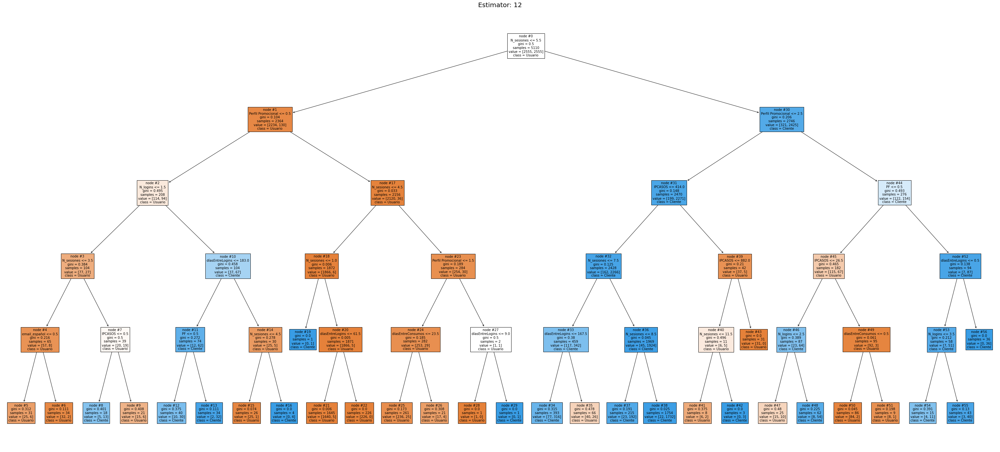

CPU times: user 12.4 s, sys: 650 ms, total: 13 s
Wall time: 17.8 s


In [546]:
%%time

from sklearn.tree import plot_tree

estimator = 12

plt.subplots(figsize=(55,25))
plot_tree(rfc.estimators_[estimator],
          feature_names = X_train.columns, 
          class_names = ['Usuario', 'Cliente'],
          filled=True, node_ids=True, fontsize=10)

plt.title(f'Estimator: {estimator}', fontsize = 20)

plt.savefig(f'rf_tree_{estimator}.png')
    
plt.show()

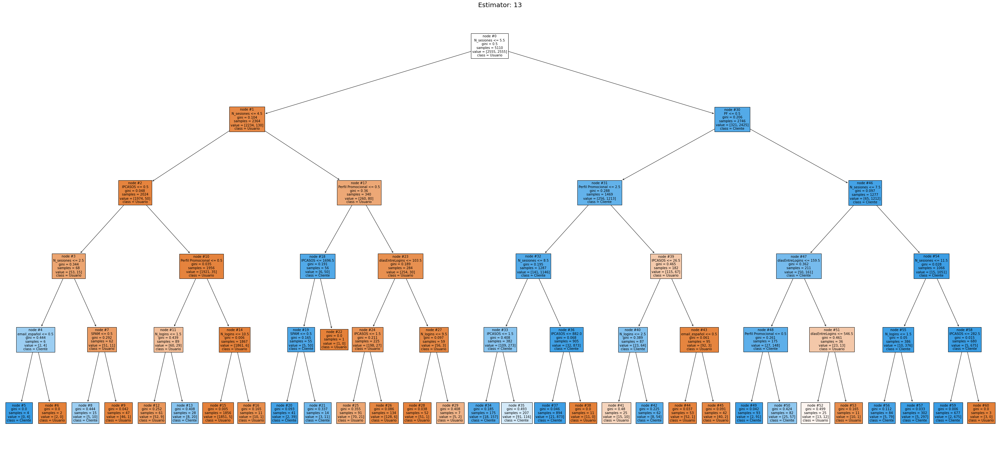

CPU times: user 11.9 s, sys: 621 ms, total: 12.5 s
Wall time: 16.3 s


In [547]:
%%time

from sklearn.tree import plot_tree

estimator = 13

plt.subplots(figsize=(55,25))
plot_tree(rfc.estimators_[estimator],
          feature_names = X_train.columns, 
          class_names = ['Usuario', 'Cliente'],
          filled=True, node_ids=True, fontsize=10)

plt.title(f'Estimator: {estimator}', fontsize = 20)

plt.savefig(f'rf_tree_{estimator}.png')
    
plt.show()

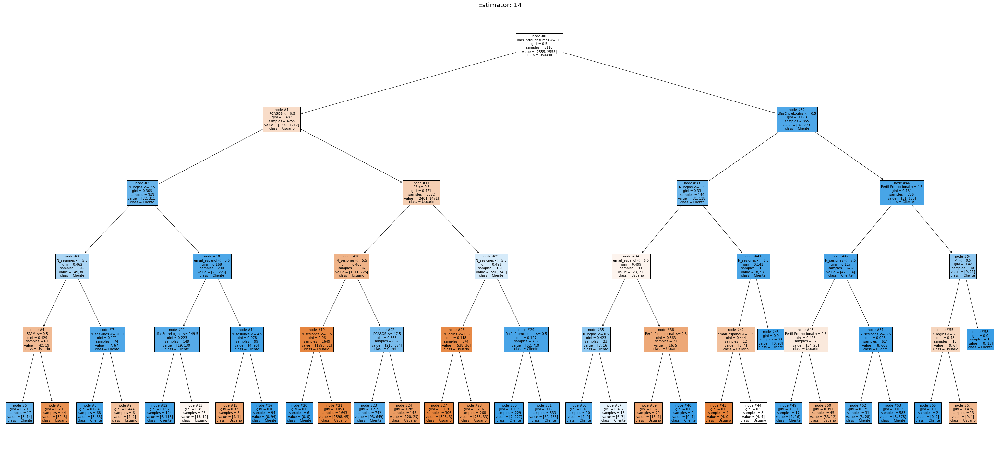

CPU times: user 10.9 s, sys: 628 ms, total: 11.5 s
Wall time: 12.1 s


In [548]:
%%time

from sklearn.tree import plot_tree

estimator = 14

plt.subplots(figsize=(55,25))
plot_tree(rfc.estimators_[estimator],
          feature_names = X_train.columns, 
          class_names = ['Usuario', 'Cliente'],
          filled=True, node_ids=True, fontsize=10)

plt.title(f'Estimator: {estimator}', fontsize = 20)

plt.savefig(f'rf_tree_{estimator}.png')
    
plt.show()

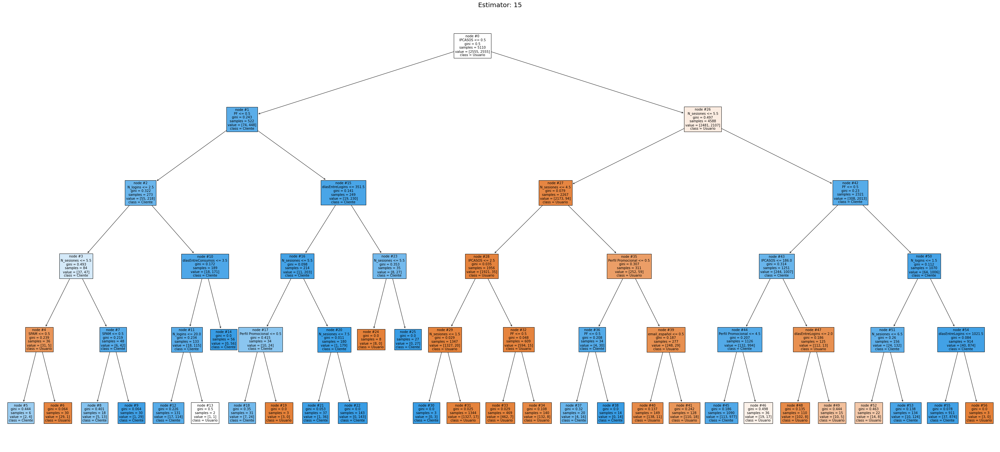

CPU times: user 11.2 s, sys: 595 ms, total: 11.8 s
Wall time: 15.4 s


In [549]:
%%time

from sklearn.tree import plot_tree

estimator = 15

plt.subplots(figsize=(55,25))
plot_tree(rfc.estimators_[estimator],
          feature_names = X_train.columns, 
          class_names = ['Usuario', 'Cliente'],
          filled=True, node_ids=True, fontsize=10)

plt.title(f'Estimator: {estimator}', fontsize = 20)

plt.savefig(f'rf_tree_{estimator}.png')
    
plt.show()

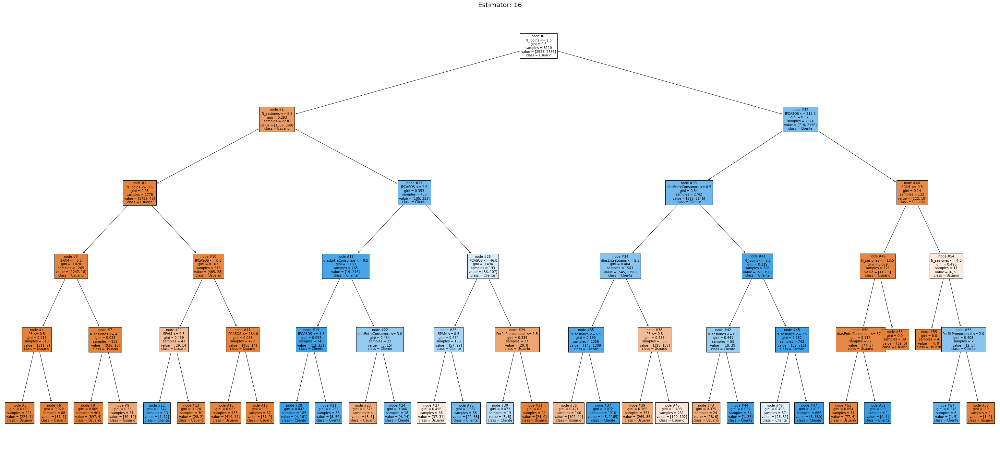

CPU times: user 12 s, sys: 629 ms, total: 12.6 s
Wall time: 17.3 s


In [550]:
%%time

from sklearn.tree import plot_tree

estimator = 16

plt.subplots(figsize=(55,25))
plot_tree(rfc.estimators_[estimator],
          feature_names = X_train.columns, 
          class_names = ['Usuario', 'Cliente'],
          filled=True, node_ids=True, fontsize=10)

plt.title(f'Estimator: {estimator}', fontsize = 20)

plt.savefig(f'rf_tree_{estimator}.png')
    
plt.show()

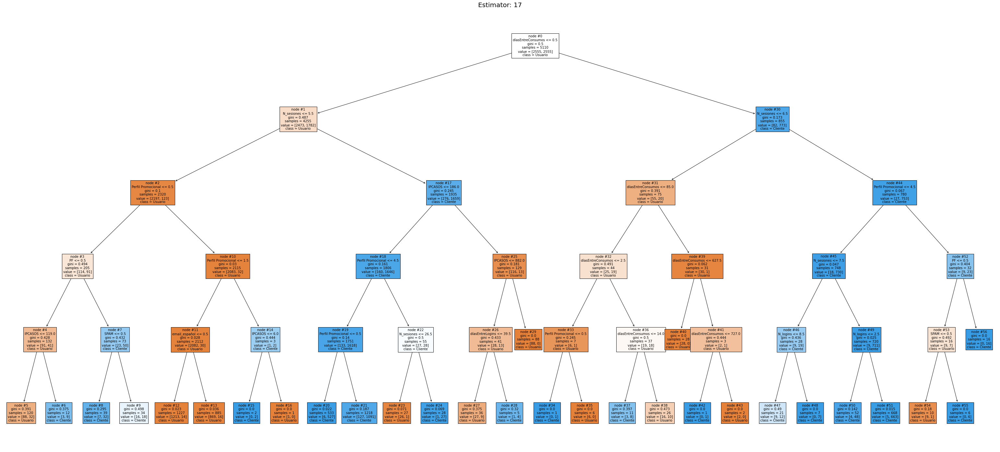

CPU times: user 12.2 s, sys: 597 ms, total: 12.8 s
Wall time: 18.9 s


In [551]:
%%time

from sklearn.tree import plot_tree

estimator = 17

plt.subplots(figsize=(55,25))
plot_tree(rfc.estimators_[estimator],
          feature_names = X_train.columns, 
          class_names = ['Usuario', 'Cliente'],
          filled=True, node_ids=True, fontsize=10)

plt.title(f'Estimator: {estimator}', fontsize = 20)

plt.savefig(f'rf_tree_{estimator}.png')
    
plt.show()

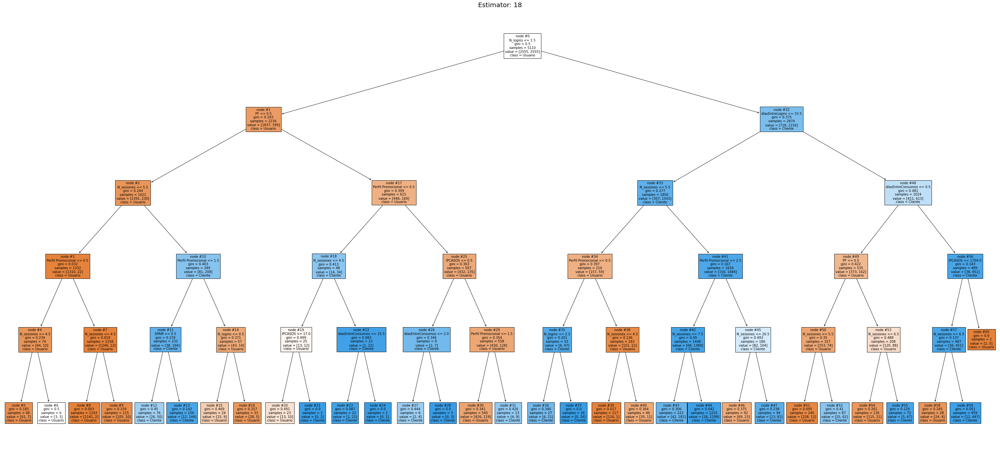

CPU times: user 13.6 s, sys: 732 ms, total: 14.3 s
Wall time: 20.4 s


In [552]:
%%time

from sklearn.tree import plot_tree

estimator = 18

plt.subplots(figsize=(55,25))
plot_tree(rfc.estimators_[estimator],
          feature_names = X_train.columns, 
          class_names = ['Usuario', 'Cliente'],
          filled=True, node_ids=True, fontsize=10)

plt.title(f'Estimator: {estimator}', fontsize = 20)

plt.savefig(f'rf_tree_{estimator}.png')
    
plt.show()

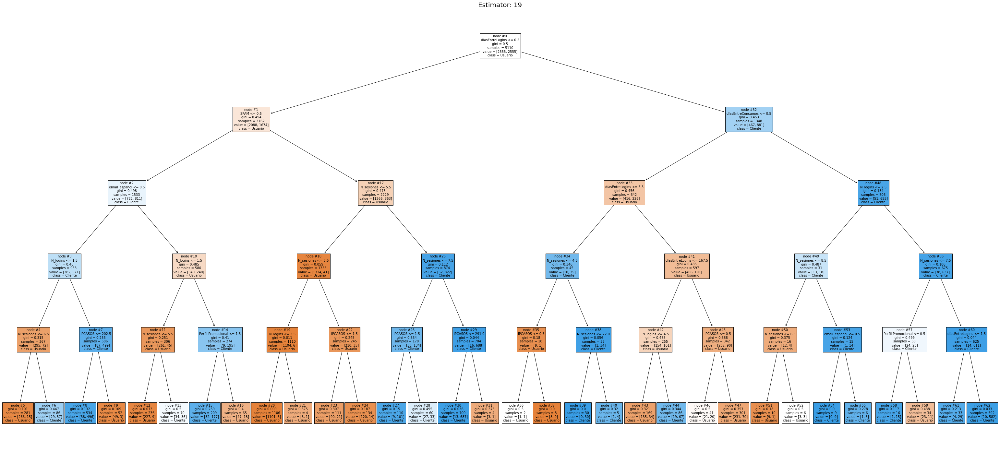

CPU times: user 14.4 s, sys: 731 ms, total: 15.1 s
Wall time: 20.7 s


In [553]:
%%time

from sklearn.tree import plot_tree

estimator = 19

plt.subplots(figsize=(55,25))
plot_tree(rfc.estimators_[estimator],
          feature_names = X_train.columns, 
          class_names = ['Usuario', 'Cliente'],
          filled=True, node_ids=True, fontsize=10)

plt.title(f'Estimator: {estimator}', fontsize = 20)

plt.savefig(f'rf_tree_{estimator}.png')
    
plt.show()

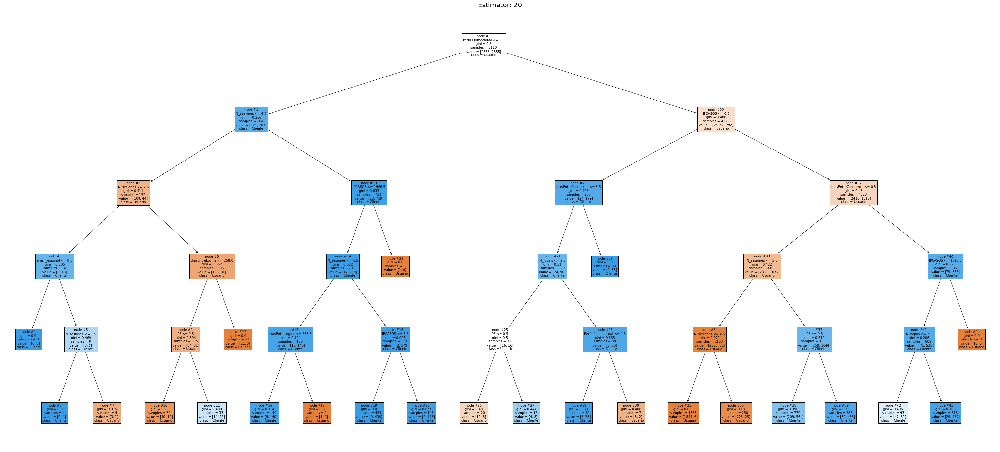

CPU times: user 11.3 s, sys: 465 ms, total: 11.8 s
Wall time: 19.8 s


In [554]:
%%time

from sklearn.tree import plot_tree

estimator = 20

plt.subplots(figsize=(55,25))
plot_tree(rfc.estimators_[estimator],
          feature_names = X_train.columns, 
          class_names = ['Usuario', 'Cliente'],
          filled=True, node_ids=True, fontsize=10)

plt.title(f'Estimator: {estimator}', fontsize = 20)

plt.savefig(f'rf_tree_{estimator}.png')
    
plt.show()

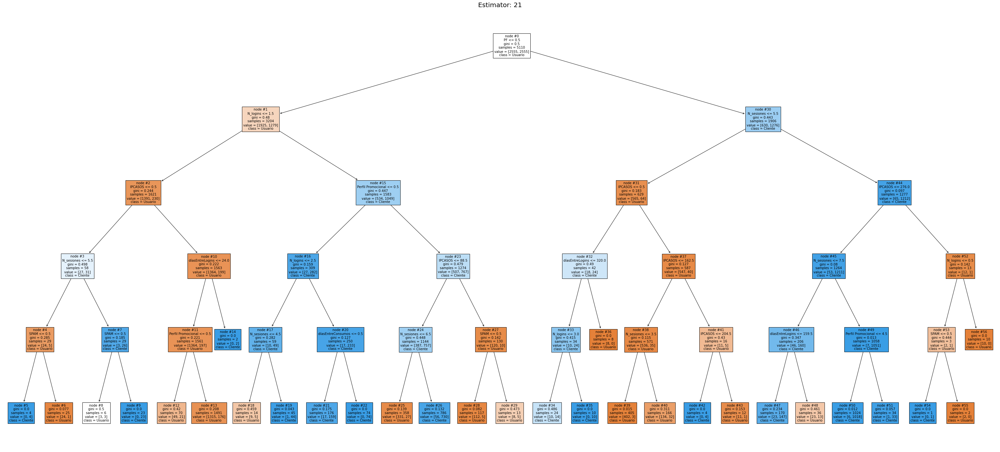

CPU times: user 12.6 s, sys: 658 ms, total: 13.2 s
Wall time: 23.8 s


In [555]:
%%time

from sklearn.tree import plot_tree

estimator = 21

plt.subplots(figsize=(55,25))
plot_tree(rfc.estimators_[estimator],
          feature_names = X_train.columns, 
          class_names = ['Usuario', 'Cliente'],
          filled=True, node_ids=True, fontsize=10)

plt.title(f'Estimator: {estimator}', fontsize = 20)

plt.savefig(f'rf_tree_{estimator}.png')
    
plt.show()

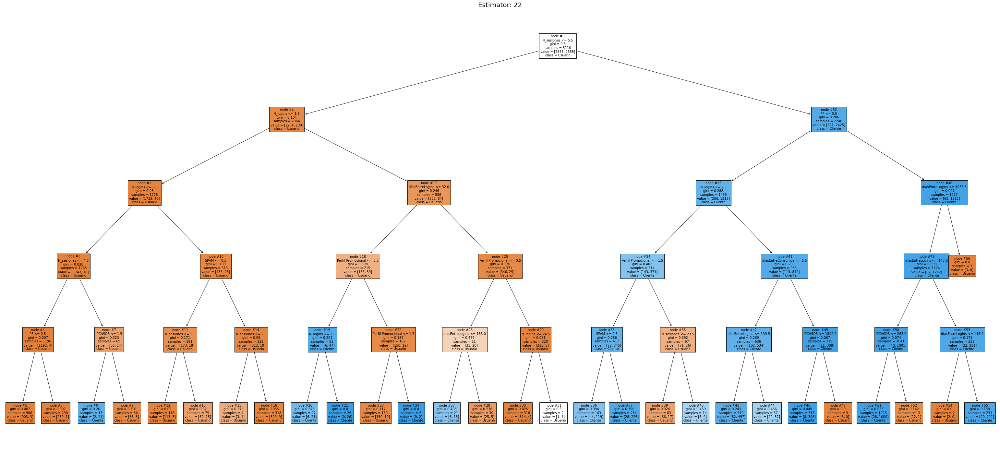

CPU times: user 12.5 s, sys: 641 ms, total: 13.1 s
Wall time: 20.2 s


In [556]:
%%time

from sklearn.tree import plot_tree

estimator = 22

plt.subplots(figsize=(55,25))
plot_tree(rfc.estimators_[estimator],
          feature_names = X_train.columns, 
          class_names = ['Usuario', 'Cliente'],
          filled=True, node_ids=True, fontsize=10)

plt.title(f'Estimator: {estimator}', fontsize = 20)

plt.savefig(f'rf_tree_{estimator}.png')
    
plt.show()

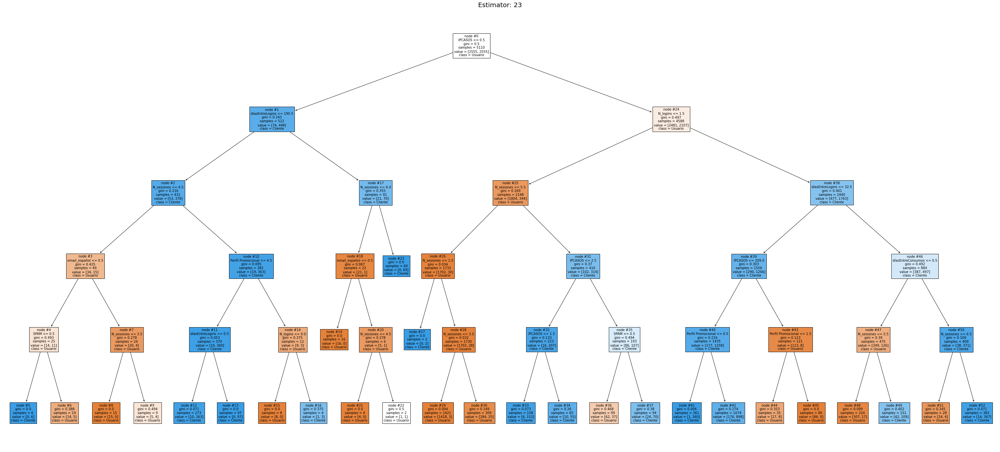

CPU times: user 10.5 s, sys: 520 ms, total: 11 s
Wall time: 14.1 s


In [557]:
%%time

from sklearn.tree import plot_tree

estimator = 23

plt.subplots(figsize=(55,25))
plot_tree(rfc.estimators_[estimator],
          feature_names = X_train.columns, 
          class_names = ['Usuario', 'Cliente'],
          filled=True, node_ids=True, fontsize=10)

plt.title(f'Estimator: {estimator}', fontsize = 20)

plt.savefig(f'rf_tree_{estimator}.png')
    
plt.show()

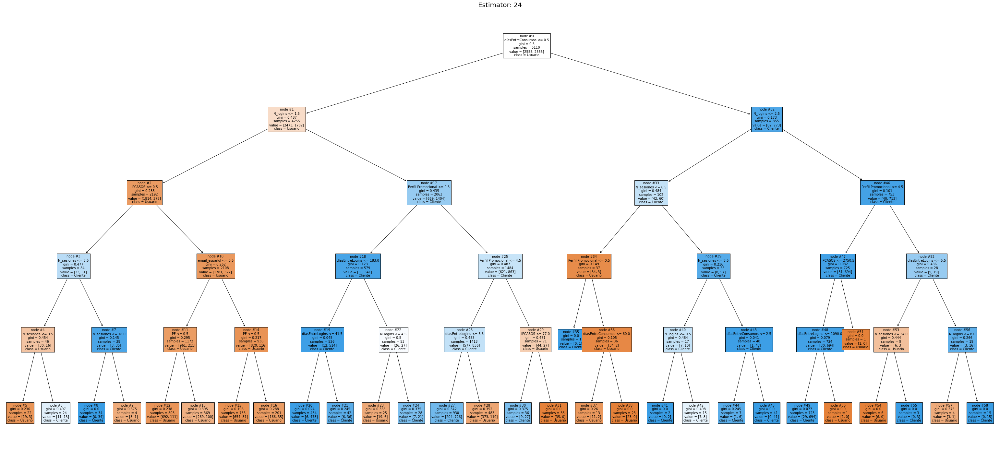

CPU times: user 13.2 s, sys: 663 ms, total: 13.9 s
Wall time: 17.8 s


In [558]:
%%time

from sklearn.tree import plot_tree

estimator = 24

plt.subplots(figsize=(55,25))
plot_tree(rfc.estimators_[estimator],
          feature_names = X_train.columns, 
          class_names = ['Usuario', 'Cliente'],
          filled=True, node_ids=True, fontsize=10)

plt.title(f'Estimator: {estimator}', fontsize = 20)

plt.savefig(f'rf_tree_{estimator}.png')
    
plt.show()

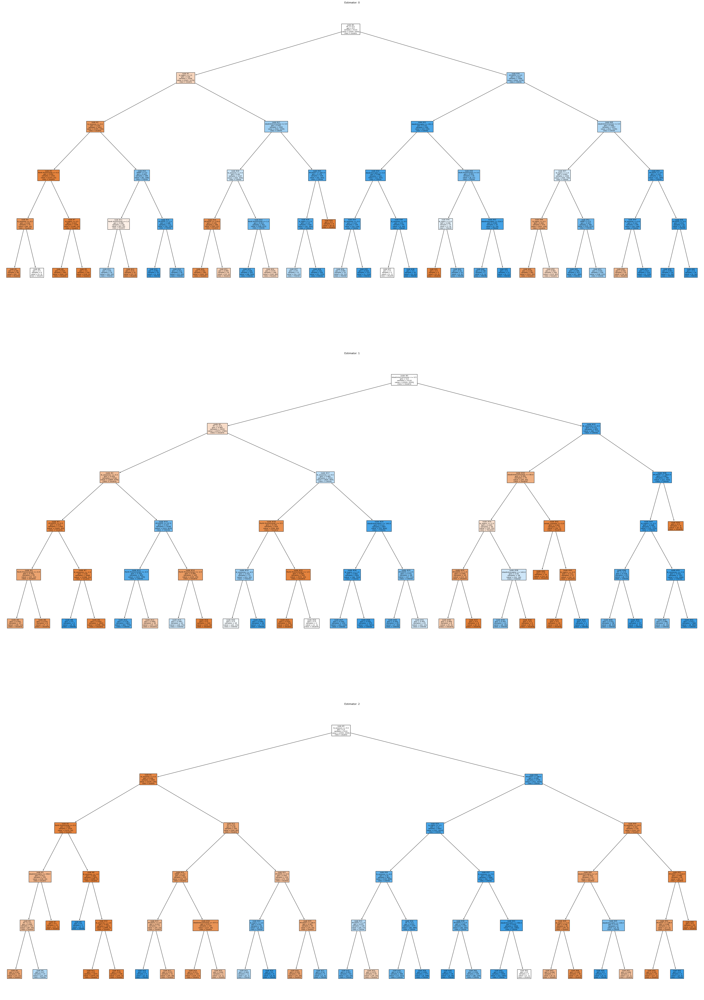

CPU times: user 22.6 s, sys: 1.34 s, total: 23.9 s
Wall time: 25.6 s


In [464]:
%%time

fig, axes = plt.subplots(nrows = 3,ncols = 1,figsize = (50,80))

for index in range(0, 3):
    tree.plot_tree(rfc.estimators_[index],
                   feature_names = X_train.columns, 
                   class_names=['Usuario', 'Cliente'],
                   filled = True, node_ids=True,
                   ax = axes[index]);
    axes[index].set_title('Estimator: ' + str(index), fontsize = 11)
    
    
plt.show()

Accuracy: 0.838
F1-binary: 0.079
Recall: 0.967


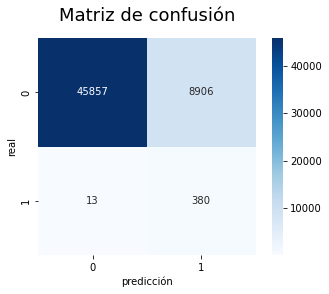



CPU times: user 1.06 s, sys: 39.5 ms, total: 1.1 s
Wall time: 791 ms


In [486]:
%%time

rfc= RandomForestClassifier(random_state=42,
                            n_estimators=25,
                            max_depth=5,
                            class_weight= {0:1,1:3})

rfc.fit(X_SMOTENCIHTRUS, y_SMOTENCIHTRUS)
    
pred = rfc.predict(X_val)
print("Accuracy: {:.3f}".format(accuracy_score(y_val, pred)))
print("F1-binary: {:.3f}".format(f1_score(y_val, pred, average='binary'))) 
print("Recall: {:.3f}".format(recall_score(y_val, pred))) 

matriz = confusion_matrix(y_val, pred)
sns.heatmap(matriz, annot=True, fmt="d", cmap='Blues', square=True)
plt.xlabel("predicción")
plt.ylabel("real")
plt.title('Matriz de confusión', y=1.05, size=18)
plt.show()
print('\n')

Accuracy: 0.854
F1-binary: 0.084
Recall: 0.947


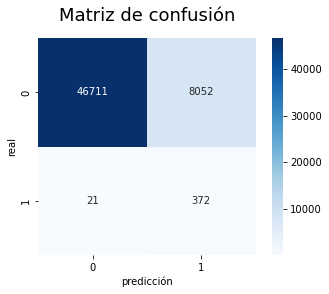



CPU times: user 718 ms, sys: 37.1 ms, total: 755 ms
Wall time: 500 ms


In [490]:
%%time

DTC= DecisionTreeClassifier(random_state=10,
                            max_depth=4,
                            min_samples_split=2,
                            class_weight= 'balanced')

DTC.fit(X_SMOTENCIHTRUS, y_SMOTENCIHTRUS)
    
pred = DTC.predict(X_val)
print("Accuracy: {:.3f}".format(accuracy_score(y_val, pred)))
print("F1-binary: {:.3f}".format(f1_score(y_val, pred, average='binary'))) 
print("Recall: {:.3f}".format(recall_score(y_val, pred))) 

matriz = confusion_matrix(y_val, pred)
sns.heatmap(matriz, annot=True, fmt="d", cmap='Blues', square=True)
plt.xlabel("predicción")
plt.ylabel("real")
plt.title('Matriz de confusión', y=1.05, size=18)
plt.show()
print('\n')

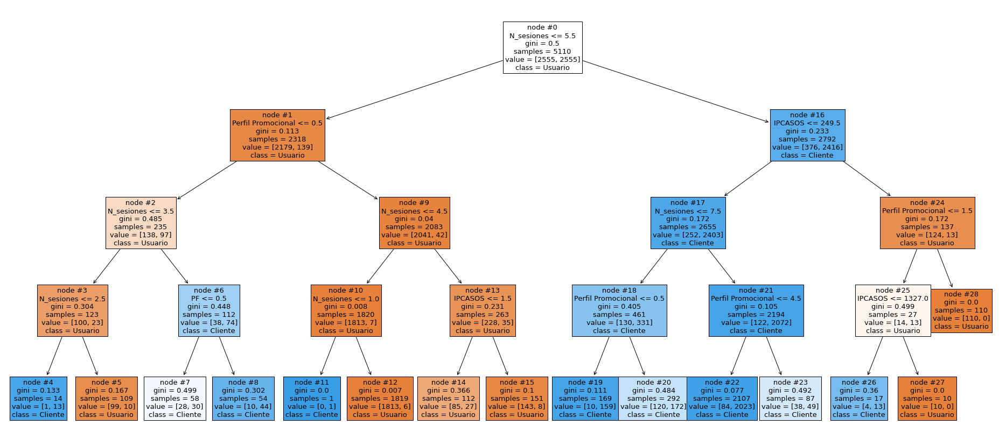

CPU times: user 3.84 s, sys: 171 ms, total: 4.01 s
Wall time: 3.84 s


In [114]:
%%time

from sklearn.tree import plot_tree

plt.subplots(figsize=(33,15))
plot_tree(DTC, feature_names = X_train.columns, 
          class_names = ['Usuario', 'Cliente'],
          filled=True, node_ids=True, fontsize=13)
plt.show()

In [75]:
from sklearn import tree
from pydotplus import graph_from_dot_data




#import graphviz
# DOT data
dot_data = tree.export_graphviz(DTC, out_file=None, 
                                feature_names=X_train.columns,  
                                class_names=['Usuario', 'Cliente'],
                                filled=True)


#dot_data = export_graphviz(tree,
#                           feature_names=feature_names)

graph = graph_from_dot_data(dot_data)
#graph.write_png('tree.png')

# Draw graph
#graph = graphviz.Source(dot_data) 

In [76]:
tree.export_graphviz(DTC,
                     out_file="tree.dot",
                     feature_names=X_train.columns, 
                     class_names=['Usuario', 'Cliente'],
                     rounded = True,
                     filled = True)

Accuracy: 0.854
F1-binary: 0.084
Recall: 0.947


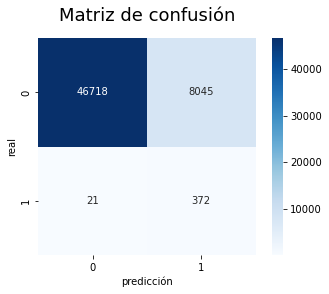



CPU times: user 636 ms, sys: 54.2 ms, total: 690 ms
Wall time: 611 ms


In [436]:
%%time

DTC= DecisionTreeClassifier(random_state=0,
                            max_depth=4,
                            min_samples_split=2,
                            class_weight= {0:1,1:3})

DTC.fit(X_SMOTENCIHTRUS, y_SMOTENCIHTRUS)
    
pred = DTC.predict(X_val)
print("Accuracy: {:.3f}".format(accuracy_score(y_val, pred)))
print("F1-binary: {:.3f}".format(f1_score(y_val, pred, average='binary'))) 
print("Recall: {:.3f}".format(recall_score(y_val, pred))) 

matriz = confusion_matrix(y_val, pred)
sns.heatmap(matriz, annot=True, fmt="d", cmap='Blues', square=True)
plt.xlabel("predicción")
plt.ylabel("real")
plt.title('Matriz de confusión', y=1.05, size=18)
plt.show()
print('\n')

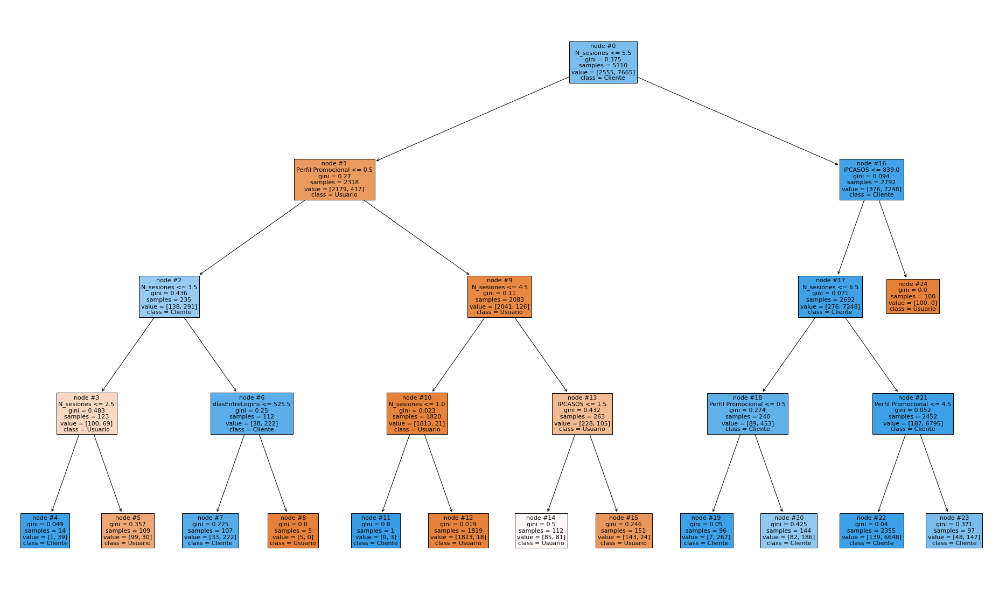

CPU times: user 2.97 s, sys: 128 ms, total: 3.1 s
Wall time: 2.72 s


In [78]:
%%time

plt.subplots(figsize=(33,20))
plot_tree(DTC, feature_names = X_train.columns, 
          class_names = ['Usuario', 'Cliente'],
          filled=True, node_ids=True, fontsize=11)
plt.show()

Accuracy: 0.870
F1-binary: 0.094
Recall: 0.954


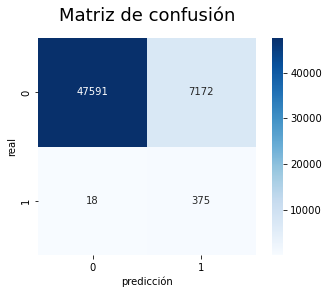



CPU times: user 1.27 s, sys: 38.1 ms, total: 1.31 s
Wall time: 948 ms


In [233]:
%%time

rfc= RandomForestClassifier(random_state=0,
                            n_estimators=50,
                            max_depth=5,
                            class_weight= 'balanced')

rfc.fit(X_SMOTENCIHTRUS, y_SMOTENCIHTRUS)
    
pred = rfc.predict(X_val)
print("Accuracy: {:.3f}".format(accuracy_score(y_val, pred)))
print("F1-binary: {:.3f}".format(f1_score(y_val, pred, average='binary'))) 
print("Recall: {:.3f}".format(recall_score(y_val, pred))) 

matriz = confusion_matrix(y_val, pred)
sns.heatmap(matriz, annot=True, fmt="d", cmap='Blues', square=True)
plt.xlabel("predicción")
plt.ylabel("real")
plt.title('Matriz de confusión', y=1.05, size=18)
plt.show()
print('\n')

In [350]:
X_val.shape

(55156, 9)

Accuracy: 0.637
F1-binary: 0.038
Recall: 0.995


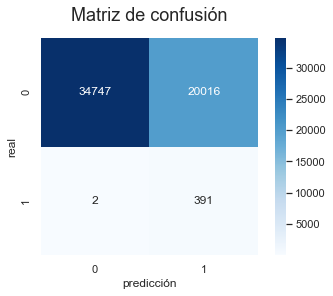



CPU times: user 1.17 s, sys: 36.7 ms, total: 1.2 s
Wall time: 1.29 s


In [361]:
%%time

counter = Counter(y_train)
estimate = (counter[0]/counter[1])
weights = {0:1,1:estimate}

rfc= RandomForestClassifier(random_state=0,
                            n_estimators=100,
                            max_depth=5,
                            class_weight= weights)

rfc.fit(X_SMOTENCIHTRUS, y_SMOTENCIHTRUS)
    
pred = DTC.predict(X_val)
print("Accuracy: {:.3f}".format(accuracy_score(y_val, pred)))
print("F1-binary: {:.3f}".format(f1_score(y_val, pred, average='binary'))) 
print("Recall: {:.3f}".format(recall_score(y_val, pred))) 

matriz = confusion_matrix(y_val, pred)
sns.heatmap(matriz, annot=True, fmt="d", cmap='Blues', square=True)
plt.xlabel("predicción")
plt.ylabel("real")
plt.title('Matriz de confusión', y=1.05, size=18)
plt.show()
print('\n')

13942.17130387343
Accuracy: 0.831
F1-binary: 0.077
Recall: 0.987


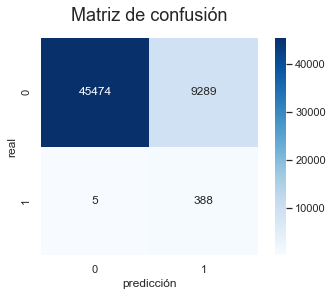



CPU times: user 3.44 s, sys: 181 ms, total: 3.62 s
Wall time: 1.27 s


In [342]:
%%time

counter = Counter(y_train)
estimate = (counter[0]/counter[1])*100
print(estimate)
  
xgb = XGBClassifier(scale_pos_weight=estimate, use_label_encoder=False, eval_metric='aucpr')
xgb.fit(X_SMOTENCIHTRUS, y_SMOTENCIHTRUS)
  
pred = xgb.predict(X_val)
print("Accuracy: {:.3f}".format(accuracy_score(y_val, pred)))
print("F1-binary: {:.3f}".format(f1_score(y_val, pred, average='binary'))) 
print("Recall: {:.3f}".format(recall_score(y_val, pred))) 

matriz = confusion_matrix(y_val, pred)
sns.heatmap(matriz, annot=True, fmt="d", cmap='Blues', square=True)
plt.xlabel("predicción")
plt.ylabel("real")
plt.title('Matriz de confusión', y=1.05, size=18)
plt.show()
print('\n')

Accuracy: 0.830
F1-binary: 0.076
Recall: 0.985


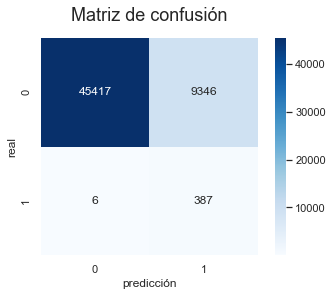



CPU times: user 3.14 s, sys: 259 ms, total: 3.39 s
Wall time: 1.56 s


In [318]:
%%time

#counter = Counter(y_SMOTENCIHTRUS)
estimate = 10000
  
xgb = XGBClassifier(scale_pos_weight=estimate, use_label_encoder=False, eval_metric='aucpr')
xgb.fit(X_SMOTENCIHTRUS, y_SMOTENCIHTRUS)
  
pred = xgb.predict(X_val)
print("Accuracy: {:.3f}".format(accuracy_score(y_val, pred)))
print("F1-binary: {:.3f}".format(f1_score(y_val, pred, average='binary'))) 
print("Recall: {:.3f}".format(recall_score(y_val, pred))) 

matriz = confusion_matrix(y_val, pred)
sns.heatmap(matriz, annot=True, fmt="d", cmap='Blues', square=True)
plt.xlabel("predicción")
plt.ylabel("real")
plt.title('Matriz de confusión', y=1.05, size=18)
plt.show()
print('\n')

139.4217130387343
Accuracy: 0.965
F1-binary: 0.243
Recall: 0.784


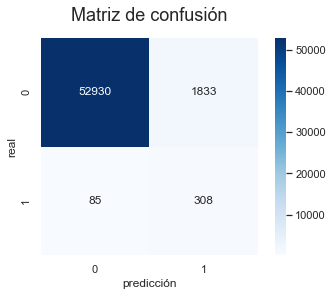



CPU times: user 2min 18s, sys: 2.51 s, total: 2min 20s
Wall time: 1min 19s


In [371]:
%%time

counter = Counter(y_train)
estimate = counter[0]/counter[1]
#estimate= 10000
print(estimate)
  
xgb = XGBClassifier(scale_pos_weight=estimate, use_label_encoder=False, eval_metric='aucpr')
xgb.fit(X_train0, y_train)
  
pred = xgb.predict(X_val0)
print("Accuracy: {:.3f}".format(accuracy_score(y_val, pred)))
print("F1-binary: {:.3f}".format(f1_score(y_val, pred, average='binary'))) 
print("Recall: {:.3f}".format(recall_score(y_val, pred))) 

matriz = confusion_matrix(y_val, pred)
sns.heatmap(matriz, annot=True, fmt="d", cmap='Blues', square=True)
plt.xlabel("predicción")
plt.ylabel("real")
plt.title('Matriz de confusión', y=1.05, size=18)
plt.show()
print('\n')

In [311]:
dill.dump_session('TFM_notebook_env.db')

# Prueba final

Counter({0: 255560, 1: 1833})
Counter({0: 2555, 1: 2555})


Accuracy: 0.841
F1-binary: 0.079
Recall: 0.964


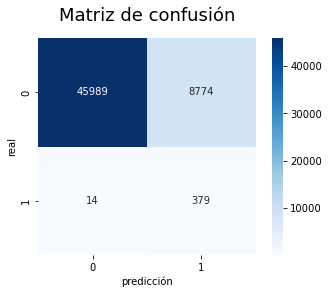



CPU times: user 3min 20s, sys: 3.01 s, total: 3min 23s
Wall time: 3min 27s


In [254]:
%%time

print(Counter(y_train))

smotenc = SMOTENC(sampling_strategy=0.01, categorical_features=[0, 1,2], random_state=1)
iht = InstanceHardnessThreshold(random_state=1)
rus = RandomUnderSampler(random_state=1)
pipeline = Pipeline([('smotenc', smotenc), ('iht', iht), ('rus', rus)])
X_SMOTENCIHTRUS0, y_SMOTENCIHTRUS0 = pipeline.fit_resample(X_train0, y_train)

print(Counter(y_SMOTENCIHTRUS0))
print('\n')

DTC0= DecisionTreeClassifier(random_state=0,
                            max_depth=4,
                            min_samples_split=2,
                            class_weight= 'balanced')

DTC0.fit(X_SMOTENCIHTRUS0, y_SMOTENCIHTRUS0)
    
pred0 = DTC0.predict(X_val0)
print("Accuracy: {:.3f}".format(accuracy_score(y_val, pred0)))
print("F1-binary: {:.3f}".format(f1_score(y_val, pred0, average='binary'))) 
print("Recall: {:.3f}".format(recall_score(y_val, pred0))) 

matriz = confusion_matrix(y_val, pred0)
sns.heatmap(matriz, annot=True, fmt="d", cmap='Blues', square=True)
plt.xlabel("predicción")
plt.ylabel("real")
plt.title('Matriz de confusión', y=1.05, size=18)
plt.show()
print('\n')

Counter({0: 255560, 1: 1833})
Counter({0: 2555, 1: 2555})


Accuracy: 0.840
F1-binary: 0.079
Recall: 0.962


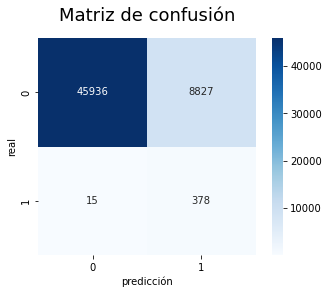



CPU times: user 2min 25s, sys: 2.45 s, total: 2min 27s
Wall time: 2min 33s


In [257]:
%%time

print(Counter(y_train))

smotenc = SMOTENC(sampling_strategy=0.01, categorical_features=[0, 1,2], random_state=1)
iht = InstanceHardnessThreshold(random_state=1)
rus = RandomUnderSampler(random_state=1)
pipeline = Pipeline([('smotenc', smotenc), ('iht', iht), ('rus', rus)])
X_SMOTENCIHTRUS1, y_SMOTENCIHTRUS1 = pipeline.fit_resample(X_train, y_train)

print(Counter(y_SMOTENCIHTRUS1))
print('\n')

DTC1= DecisionTreeClassifier(random_state=0,
                            max_depth=4,
                            min_samples_split=2,
                            class_weight= 'balanced')

DTC1.fit(X_SMOTENCIHTRUS1, y_SMOTENCIHTRUS1)
    
pred1 = DTC1.predict(X_val)
print("Accuracy: {:.3f}".format(accuracy_score(y_val, pred1)))
print("F1-binary: {:.3f}".format(f1_score(y_val, pred1, average='binary'))) 
print("Recall: {:.3f}".format(recall_score(y_val, pred1))) 

matriz = confusion_matrix(y_val, pred1)
sns.heatmap(matriz, annot=True, fmt="d", cmap='Blues', square=True)
plt.xlabel("predicción")
plt.ylabel("real")
plt.title('Matriz de confusión', y=1.05, size=18)
plt.show()
print('\n')

Counter({0: 255560, 1: 1833})
Counter({0: 2689, 1: 2555})


Accuracy: 0.839
F1-binary: 0.079
Recall: 0.962


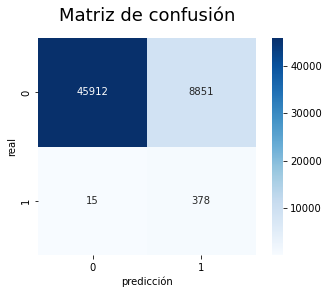



CPU times: user 2min 31s, sys: 2.82 s, total: 2min 34s
Wall time: 2min 43s


In [269]:
%%time

print(Counter(y_train))

smotenc = SMOTENC(sampling_strategy=0.01, categorical_features=[0, 1,2], random_state=1)
iht = InstanceHardnessThreshold(random_state=1)
rus = RandomUnderSampler(sampling_strategy=0.95, random_state=1)
pipeline = Pipeline([('smotenc', smotenc), ('iht', iht), ('rus', rus)])
X_SMOTENCIHTRUS12, y_SMOTENCIHTRUS12 = pipeline.fit_resample(X_train, y_train)

print(Counter(y_SMOTENCIHTRUS12))
print('\n')

DTC12= DecisionTreeClassifier(random_state=0,
                            max_depth=4,
                            min_samples_split=2,
                            class_weight= 'balanced')

DTC12.fit(X_SMOTENCIHTRUS12, y_SMOTENCIHTRUS12)
    
pred12 = DTC12.predict(X_val)
print("Accuracy: {:.3f}".format(accuracy_score(y_val, pred12)))
print("F1-binary: {:.3f}".format(f1_score(y_val, pred12, average='binary'))) 
print("Recall: {:.3f}".format(recall_score(y_val, pred12))) 

matriz12 = confusion_matrix(y_val, pred12)
sns.heatmap(matriz12, annot=True, fmt="d", cmap='Blues', square=True)
plt.xlabel("predicción")
plt.ylabel("real")
plt.title('Matriz de confusión', y=1.05, size=18)
plt.show()
print('\n')

Counter({0: 255560, 1: 1833})
Counter({0: 2838, 1: 2555})


Accuracy: 0.839
F1-binary: 0.079
Recall: 0.962


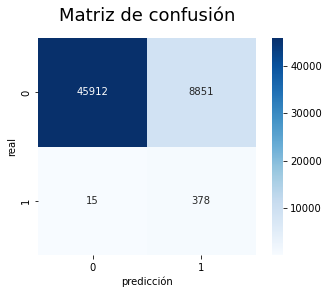



CPU times: user 2min 24s, sys: 2.16 s, total: 2min 26s
Wall time: 2min 34s


In [270]:
%%time

print(Counter(y_train))

smotenc = SMOTENC(sampling_strategy=0.01, categorical_features=[0, 1,2], random_state=1)
iht = InstanceHardnessThreshold(random_state=1)
rus = RandomUnderSampler(sampling_strategy=0.9, random_state=1)
pipeline = Pipeline([('smotenc', smotenc), ('iht', iht), ('rus', rus)])
X_SMOTENCIHTRUS2, y_SMOTENCIHTRUS2 = pipeline.fit_resample(X_train, y_train)

print(Counter(y_SMOTENCIHTRUS2))
print('\n')

DTC2= DecisionTreeClassifier(random_state=0,
                            max_depth=4,
                            min_samples_split=2,
                            class_weight= 'balanced')

DTC2.fit(X_SMOTENCIHTRUS2, y_SMOTENCIHTRUS2)
    
pred2 = DTC2.predict(X_val)
print("Accuracy: {:.3f}".format(accuracy_score(y_val, pred2)))
print("F1-binary: {:.3f}".format(f1_score(y_val, pred2, average='binary'))) 
print("Recall: {:.3f}".format(recall_score(y_val, pred2))) 

matriz2 = confusion_matrix(y_val, pred2)
sns.heatmap(matriz2, annot=True, fmt="d", cmap='Blues', square=True)
plt.xlabel("predicción")
plt.ylabel("real")
plt.title('Matriz de confusión', y=1.05, size=18)
plt.show()
print('\n')

Counter({0: 255560, 1: 1833})
Counter({0: 3193, 1: 2555})


Accuracy: 0.841
F1-binary: 0.079
Recall: 0.962


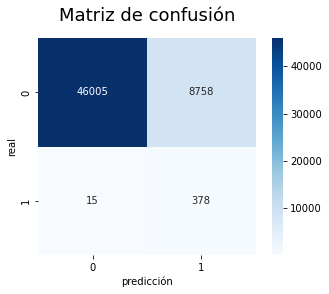



CPU times: user 2min 23s, sys: 2.4 s, total: 2min 26s
Wall time: 2min 30s


In [271]:
%%time

print(Counter(y_train))

smotenc = SMOTENC(sampling_strategy=0.01, categorical_features=[0, 1,2], random_state=1)
iht = InstanceHardnessThreshold(random_state=1)
rus = RandomUnderSampler(sampling_strategy=0.8, random_state=1)
pipeline = Pipeline([('smotenc', smotenc), ('iht', iht), ('rus', rus)])
X_SMOTENCIHTRUS3, y_SMOTENCIHTRUS3 = pipeline.fit_resample(X_train, y_train)

print(Counter(y_SMOTENCIHTRUS3))
print('\n')

DTC3= DecisionTreeClassifier(random_state=0,
                            max_depth=4,
                            min_samples_split=2,
                            class_weight= 'balanced')

DTC3.fit(X_SMOTENCIHTRUS3, y_SMOTENCIHTRUS3)
    
pred3 = DTC3.predict(X_val)
print("Accuracy: {:.3f}".format(accuracy_score(y_val, pred3)))
print("F1-binary: {:.3f}".format(f1_score(y_val, pred3, average='binary'))) 
print("Recall: {:.3f}".format(recall_score(y_val, pred3))) 

matriz3 = confusion_matrix(y_val, pred3)
sns.heatmap(matriz3, annot=True, fmt="d", cmap='Blues', square=True)
plt.xlabel("predicción")
plt.ylabel("real")
plt.title('Matriz de confusión', y=1.05, size=18)
plt.show()
print('\n')

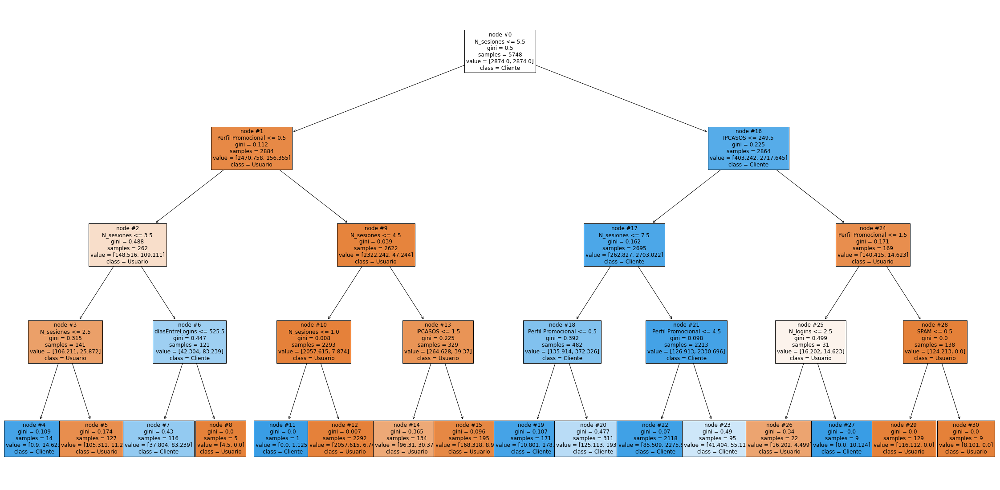

CPU times: user 3.58 s, sys: 150 ms, total: 3.73 s
Wall time: 3.43 s


In [309]:
%%time

from sklearn.tree import plot_tree

plt.subplots(figsize=(40,20))
plot_tree(DTC3, feature_names = X_train.columns, 
          class_names = ['Usuario', 'Cliente'],
          filled=True, node_ids=True, fontsize=12)
plt.show()

Counter({0: 255560, 1: 1833})
Counter({0: 3193, 1: 2555})


Accuracy: 0.840
F1-binary: 0.079
Recall: 0.964


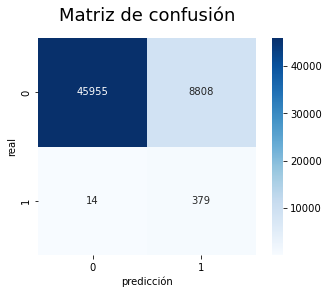



CPU times: user 3min 17s, sys: 2.83 s, total: 3min 20s
Wall time: 3min 22s


In [304]:
%%time

print(Counter(y_train))

smotenc = SMOTENC(sampling_strategy=0.01, categorical_features=[0, 1,2], random_state=1)
iht = InstanceHardnessThreshold(random_state=1)
rus = RandomUnderSampler(sampling_strategy=0.8, random_state=1)
pipeline = Pipeline([('smotenc', smotenc), ('iht', iht), ('rus', rus)])
X_SMOTENCIHTRUS30, y_SMOTENCIHTRUS30 = pipeline.fit_resample(X_train0, y_train)

print(Counter(y_SMOTENCIHTRUS30))
print('\n')

DTC30= DecisionTreeClassifier(random_state=0,
                            max_depth=4,
                            min_samples_split=2,
                            class_weight= 'balanced')

DTC30.fit(X_SMOTENCIHTRUS30, y_SMOTENCIHTRUS30)
    
pred30 = DTC30.predict(X_val0)
print("Accuracy: {:.3f}".format(accuracy_score(y_val, pred30)))
print("F1-binary: {:.3f}".format(f1_score(y_val, pred30, average='binary'))) 
print("Recall: {:.3f}".format(recall_score(y_val, pred30))) 

matriz30 = confusion_matrix(y_val, pred30)
sns.heatmap(matriz30, annot=True, fmt="d", cmap='Blues', square=True)
plt.xlabel("predicción")
plt.ylabel("real")
plt.title('Matriz de confusión', y=1.05, size=18)
plt.show()
print('\n')

Counter({0: 255560, 1: 1833})
Counter({0: 3650, 1: 2555})


Accuracy: 0.839
F1-binary: 0.079
Recall: 0.962


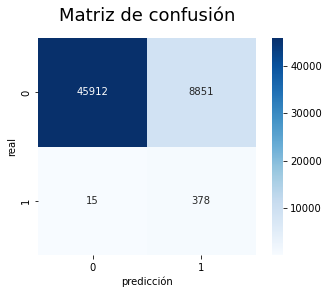



CPU times: user 2min 21s, sys: 2.03 s, total: 2min 23s
Wall time: 2min 25s


In [272]:
%%time

print(Counter(y_train))

smotenc = SMOTENC(sampling_strategy=0.01, categorical_features=[0, 1,2], random_state=1)
iht = InstanceHardnessThreshold(random_state=1)
rus = RandomUnderSampler(sampling_strategy=0.7, random_state=1)
pipeline = Pipeline([('smotenc', smotenc), ('iht', iht), ('rus', rus)])
X_SMOTENCIHTRUS4, y_SMOTENCIHTRUS4 = pipeline.fit_resample(X_train, y_train)

print(Counter(y_SMOTENCIHTRUS4))
print('\n')

DTC4= DecisionTreeClassifier(random_state=0,
                            max_depth=4,
                            min_samples_split=2,
                            class_weight= 'balanced')

DTC4.fit(X_SMOTENCIHTRUS4, y_SMOTENCIHTRUS4)
    
pred4 = DTC4.predict(X_val)
print("Accuracy: {:.3f}".format(accuracy_score(y_val, pred4)))
print("F1-binary: {:.3f}".format(f1_score(y_val, pred4, average='binary'))) 
print("Recall: {:.3f}".format(recall_score(y_val, pred4))) 

matriz4 = confusion_matrix(y_val, pred4)
sns.heatmap(matriz4, annot=True, fmt="d", cmap='Blues', square=True)
plt.xlabel("predicción")
plt.ylabel("real")
plt.title('Matriz de confusión', y=1.05, size=18)
plt.show()
print('\n')

Counter({0: 255560, 1: 1833})
Counter({0: 4258, 1: 2555})


Accuracy: 0.848
F1-binary: 0.082
Recall: 0.949


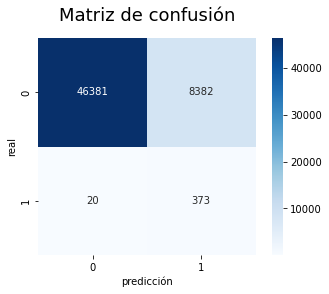



CPU times: user 2min 21s, sys: 2.16 s, total: 2min 23s
Wall time: 2min 25s


In [273]:
%%time

print(Counter(y_train))

smotenc = SMOTENC(sampling_strategy=0.01, categorical_features=[0, 1,2], random_state=1)
iht = InstanceHardnessThreshold(random_state=1)
rus = RandomUnderSampler(sampling_strategy=0.6, random_state=1)
pipeline = Pipeline([('smotenc', smotenc), ('iht', iht), ('rus', rus)])
X_SMOTENCIHTRUS5, y_SMOTENCIHTRUS5 = pipeline.fit_resample(X_train, y_train)

print(Counter(y_SMOTENCIHTRUS5))
print('\n')

DTC5= DecisionTreeClassifier(random_state=0,
                            max_depth=4,
                            min_samples_split=2,
                            class_weight= 'balanced')

DTC5.fit(X_SMOTENCIHTRUS5, y_SMOTENCIHTRUS5)
    
pred5 = DTC5.predict(X_val)
print("Accuracy: {:.3f}".format(accuracy_score(y_val, pred5)))
print("F1-binary: {:.3f}".format(f1_score(y_val, pred5, average='binary'))) 
print("Recall: {:.3f}".format(recall_score(y_val, pred5))) 

matriz5 = confusion_matrix(y_val, pred5)
sns.heatmap(matriz5, annot=True, fmt="d", cmap='Blues', square=True)
plt.xlabel("predicción")
plt.ylabel("real")
plt.title('Matriz de confusión', y=1.05, size=18)
plt.show()
print('\n')

Counter({0: 255560, 1: 1833})
Counter({0: 5110, 1: 2555})


Accuracy: 0.849
F1-binary: 0.082
Recall: 0.949


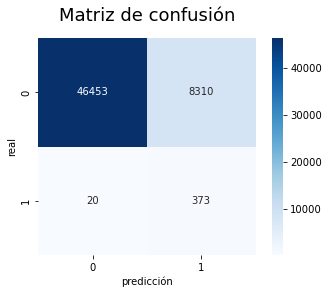



CPU times: user 2min 25s, sys: 2.24 s, total: 2min 27s
Wall time: 2min 32s


In [274]:
%%time

print(Counter(y_train))

smotenc = SMOTENC(sampling_strategy=0.01, categorical_features=[0, 1,2], random_state=1)
iht = InstanceHardnessThreshold(random_state=1)
rus = RandomUnderSampler(sampling_strategy=0.5, random_state=1)
pipeline = Pipeline([('smotenc', smotenc), ('iht', iht), ('rus', rus)])
X_SMOTENCIHTRUS6, y_SMOTENCIHTRUS6 = pipeline.fit_resample(X_train, y_train)

print(Counter(y_SMOTENCIHTRUS6))
print('\n')

DTC6= DecisionTreeClassifier(random_state=0,
                            max_depth=4,
                            min_samples_split=2,
                            class_weight= 'balanced')

DTC6.fit(X_SMOTENCIHTRUS6, y_SMOTENCIHTRUS6)
    
pred6 = DTC6.predict(X_val)
print("Accuracy: {:.3f}".format(accuracy_score(y_val, pred6)))
print("F1-binary: {:.3f}".format(f1_score(y_val, pred6, average='binary'))) 
print("Recall: {:.3f}".format(recall_score(y_val, pred6))) 

matriz6 = confusion_matrix(y_val, pred6)
sns.heatmap(matriz6, annot=True, fmt="d", cmap='Blues', square=True)
plt.xlabel("predicción")
plt.ylabel("real")
plt.title('Matriz de confusión', y=1.05, size=18)
plt.show()
print('\n')

Counter({0: 255560, 1: 1833})
Counter({0: 6387, 1: 2555})


Accuracy: 0.854
F1-binary: 0.084
Recall: 0.947


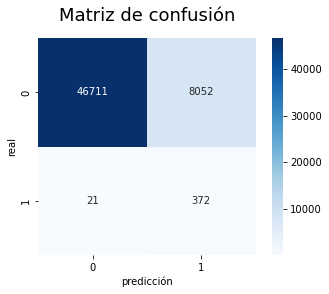



CPU times: user 2min 19s, sys: 2.29 s, total: 2min 21s
Wall time: 2min 23s


In [275]:
%%time

print(Counter(y_train))

smotenc = SMOTENC(sampling_strategy=0.01, categorical_features=[0, 1,2], random_state=1)
iht = InstanceHardnessThreshold(random_state=1)
rus = RandomUnderSampler(sampling_strategy=0.4, random_state=1)
pipeline = Pipeline([('smotenc', smotenc), ('iht', iht), ('rus', rus)])
X_SMOTENCIHTRUS7, y_SMOTENCIHTRUS7 = pipeline.fit_resample(X_train, y_train)

print(Counter(y_SMOTENCIHTRUS7))
print('\n')

DTC7= DecisionTreeClassifier(random_state=0,
                            max_depth=4,
                            min_samples_split=2,
                            class_weight= 'balanced')

DTC7.fit(X_SMOTENCIHTRUS7, y_SMOTENCIHTRUS7)
    
pred7 = DTC7.predict(X_val)
print("Accuracy: {:.3f}".format(accuracy_score(y_val, pred7)))
print("F1-binary: {:.3f}".format(f1_score(y_val, pred7, average='binary'))) 
print("Recall: {:.3f}".format(recall_score(y_val, pred7))) 

matriz7 = confusion_matrix(y_val, pred7)
sns.heatmap(matriz7, annot=True, fmt="d", cmap='Blues', square=True)
plt.xlabel("predicción")
plt.ylabel("real")
plt.title('Matriz de confusión', y=1.05, size=18)
plt.show()
print('\n')

Counter({0: 255560, 1: 1833})
Counter({0: 8516, 1: 2555})


Accuracy: 0.840
F1-binary: 0.079
Recall: 0.962


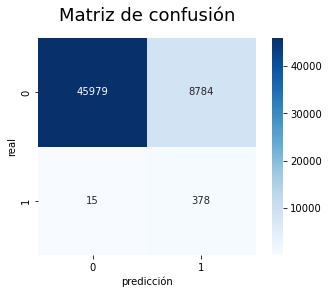



CPU times: user 2min 19s, sys: 2.01 s, total: 2min 21s
Wall time: 2min 25s


In [276]:
%%time

print(Counter(y_train))

smotenc = SMOTENC(sampling_strategy=0.01, categorical_features=[0, 1,2], random_state=1)
iht = InstanceHardnessThreshold(random_state=1)
rus = RandomUnderSampler(sampling_strategy=0.3, random_state=1)
pipeline = Pipeline([('smotenc', smotenc), ('iht', iht), ('rus', rus)])
X_SMOTENCIHTRUS8, y_SMOTENCIHTRUS8 = pipeline.fit_resample(X_train, y_train)

print(Counter(y_SMOTENCIHTRUS8))
print('\n')

DTC8= DecisionTreeClassifier(random_state=0,
                            max_depth=4,
                            min_samples_split=2,
                            class_weight= 'balanced')

DTC8.fit(X_SMOTENCIHTRUS8, y_SMOTENCIHTRUS8)
    
pred8 = DTC8.predict(X_val)
print("Accuracy: {:.3f}".format(accuracy_score(y_val, pred8)))
print("F1-binary: {:.3f}".format(f1_score(y_val, pred8, average='binary'))) 
print("Recall: {:.3f}".format(recall_score(y_val, pred8))) 

matriz8 = confusion_matrix(y_val, pred8)
sns.heatmap(matriz8, annot=True, fmt="d", cmap='Blues', square=True)
plt.xlabel("predicción")
plt.ylabel("real")
plt.title('Matriz de confusión', y=1.05, size=18)
plt.show()
print('\n')

Counter({0: 255560, 1: 1833})
Counter({0: 12775, 1: 2555})


Accuracy: 0.840
F1-binary: 0.079
Recall: 0.962


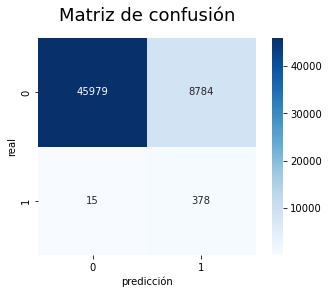



CPU times: user 2min 22s, sys: 2.27 s, total: 2min 24s
Wall time: 2min 27s


In [277]:
%%time

print(Counter(y_train))

smotenc = SMOTENC(sampling_strategy=0.01, categorical_features=[0, 1,2], random_state=1)
iht = InstanceHardnessThreshold(random_state=1)
rus = RandomUnderSampler(sampling_strategy=0.2, random_state=1)
pipeline = Pipeline([('smotenc', smotenc), ('iht', iht), ('rus', rus)])
X_SMOTENCIHTRUS9, y_SMOTENCIHTRUS9 = pipeline.fit_resample(X_train, y_train)

print(Counter(y_SMOTENCIHTRUS9))
print('\n')

DTC9= DecisionTreeClassifier(random_state=0,
                            max_depth=4,
                            min_samples_split=2,
                            class_weight= 'balanced')

DTC9.fit(X_SMOTENCIHTRUS8, y_SMOTENCIHTRUS8)
    
pred9 = DTC9.predict(X_val)
print("Accuracy: {:.3f}".format(accuracy_score(y_val, pred9)))
print("F1-binary: {:.3f}".format(f1_score(y_val, pred9, average='binary'))) 
print("Recall: {:.3f}".format(recall_score(y_val, pred9))) 

matriz9 = confusion_matrix(y_val, pred9)
sns.heatmap(matriz9, annot=True, fmt="d", cmap='Blues', square=True)
plt.xlabel("predicción")
plt.ylabel("real")
plt.title('Matriz de confusión', y=1.05, size=18)
plt.show()
print('\n')

Counter({0: 255560, 1: 1833})
Counter({0: 25550, 1: 2555})


Accuracy: 0.840
F1-binary: 0.079
Recall: 0.962


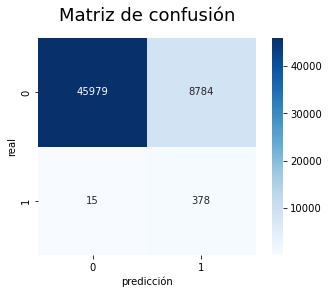



CPU times: user 2min 22s, sys: 2.01 s, total: 2min 24s
Wall time: 2min 26s


In [278]:
%%time

print(Counter(y_train))

smotenc = SMOTENC(sampling_strategy=0.01, categorical_features=[0, 1,2], random_state=1)
iht = InstanceHardnessThreshold(random_state=1)
rus = RandomUnderSampler(sampling_strategy=0.1, random_state=1)
pipeline = Pipeline([('smotenc', smotenc), ('iht', iht), ('rus', rus)])
X_SMOTENCIHTRUS9, y_SMOTENCIHTRUS9 = pipeline.fit_resample(X_train, y_train)

print(Counter(y_SMOTENCIHTRUS9))
print('\n')

DTC9= DecisionTreeClassifier(random_state=0,
                            max_depth=4,
                            min_samples_split=2,
                            class_weight= 'balanced')

DTC9.fit(X_SMOTENCIHTRUS8, y_SMOTENCIHTRUS8)
    
pred9 = DTC9.predict(X_val)
print("Accuracy: {:.3f}".format(accuracy_score(y_val, pred9)))
print("F1-binary: {:.3f}".format(f1_score(y_val, pred9, average='binary'))) 
print("Recall: {:.3f}".format(recall_score(y_val, pred9))) 

matriz9 = confusion_matrix(y_val, pred9)
sns.heatmap(matriz9, annot=True, fmt="d", cmap='Blues', square=True)
plt.xlabel("predicción")
plt.ylabel("real")
plt.title('Matriz de confusión', y=1.05, size=18)
plt.show()
print('\n')

Counter({0: 255560, 1: 1833})
Counter({0: 219381, 1: 178892})


Accuracy: 0.840
F1-binary: 0.079
Recall: 0.962


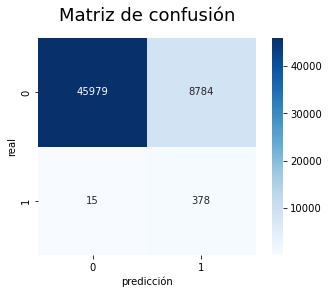



CPU times: user 5min 14s, sys: 6.57 s, total: 5min 21s
Wall time: 5min 26s


In [302]:
%%time

print(Counter(y_train))

smotenc = SMOTENC(sampling_strategy=0.7, categorical_features=[0, 1,2], random_state=1)
iht = InstanceHardnessThreshold(random_state=1)
#rus = RandomUnderSampler(sampling_strategy=0.1, random_state=1)
pipeline = Pipeline([
    ('smotenc', smotenc), 
    ('iht', iht), 
 #   ('rus', rus)
    ])
X_SMOTENCIHTRUS9, y_SMOTENCIHTRUS9 = pipeline.fit_resample(X_train, y_train)

print(Counter(y_SMOTENCIHTRUS9))
print('\n')

DTC9= DecisionTreeClassifier(random_state=0,
                            max_depth=4,
                            min_samples_split=2,
                            class_weight= 'balanced')

DTC9.fit(X_SMOTENCIHTRUS8, y_SMOTENCIHTRUS8)
    
pred9 = DTC9.predict(X_val)
print("Accuracy: {:.3f}".format(accuracy_score(y_val, pred9)))
print("F1-binary: {:.3f}".format(f1_score(y_val, pred9, average='binary'))) 
print("Recall: {:.3f}".format(recall_score(y_val, pred9))) 

matriz9 = confusion_matrix(y_val, pred9)
sns.heatmap(matriz9, annot=True, fmt="d", cmap='Blues', square=True)
plt.xlabel("predicción")
plt.ylabel("real")
plt.title('Matriz de confusión', y=1.05, size=18)
plt.show()
print('\n')

Counter({0: 255560, 1: 1833})
Counter({0: 255560, 1: 255560})


Accuracy: 0.840
F1-binary: 0.079
Recall: 0.962


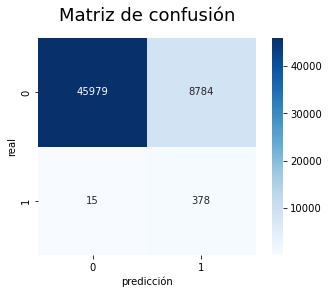



CPU times: user 32.1 s, sys: 1.17 s, total: 33.3 s
Wall time: 33.7 s


In [299]:
%%time

print(Counter(y_train))

smotenc = SMOTENC(sampling_strategy=1, categorical_features=[0, 1,2], random_state=1)
#iht = InstanceHardnessThreshold(random_state=1)
#rus = RandomUnderSampler(sampling_strategy=0.1, random_state=1)
pipeline = Pipeline([
    ('smotenc', smotenc), 
#    ('iht', iht), 
#    ('rus', rus)
    ])
X_SMOTENCIHTRUS9, y_SMOTENCIHTRUS9 = pipeline.fit_resample(X_train, y_train)

print(Counter(y_SMOTENCIHTRUS9))
print('\n')

DTC9= DecisionTreeClassifier(random_state=0,
                            max_depth=4,
                            min_samples_split=2,
                            class_weight= 'balanced')

DTC9.fit(X_SMOTENCIHTRUS8, y_SMOTENCIHTRUS8)
    
pred9 = DTC9.predict(X_val)
print("Accuracy: {:.3f}".format(accuracy_score(y_val, pred9)))
print("F1-binary: {:.3f}".format(f1_score(y_val, pred9, average='binary'))) 
print("Recall: {:.3f}".format(recall_score(y_val, pred9))) 

matriz9 = confusion_matrix(y_val, pred9)
sns.heatmap(matriz9, annot=True, fmt="d", cmap='Blues', square=True)
plt.xlabel("predicción")
plt.ylabel("real")
plt.title('Matriz de confusión', y=1.05, size=18)
plt.show()
print('\n')

Counter({0: 255560, 1: 1833})
Counter({0: 237525, 1: 1833})


Accuracy: 0.840
F1-binary: 0.079
Recall: 0.962


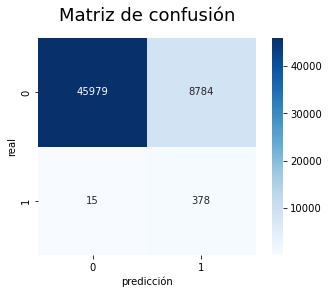



CPU times: user 2min 5s, sys: 1.62 s, total: 2min 6s
Wall time: 2min 8s


In [284]:
%%time

print(Counter(y_train))

#smotenc = SMOTENC(sampling_strategy=0.01, categorical_features=[0, 1,2], random_state=1)
iht = InstanceHardnessThreshold(random_state=1)
#rus = RandomUnderSampler(sampling_strategy=0.1, random_state=1)
pipeline = Pipeline([
#    ('smotenc', smotenc), 
    ('iht', iht), 
#    ('rus', rus)
    ])
X_SMOTENCIHTRUS9, y_SMOTENCIHTRUS9 = pipeline.fit_resample(X_train, y_train)

print(Counter(y_SMOTENCIHTRUS9))
print('\n')

DTC9= DecisionTreeClassifier(random_state=0,
                            max_depth=4,
                            min_samples_split=2,
                            class_weight= 'balanced')

DTC9.fit(X_SMOTENCIHTRUS8, y_SMOTENCIHTRUS8)
    
pred9 = DTC9.predict(X_val)
print("Accuracy: {:.3f}".format(accuracy_score(y_val, pred9)))
print("F1-binary: {:.3f}".format(f1_score(y_val, pred9, average='binary'))) 
print("Recall: {:.3f}".format(recall_score(y_val, pred9))) 

matriz9 = confusion_matrix(y_val, pred9)
sns.heatmap(matriz9, annot=True, fmt="d", cmap='Blues', square=True)
plt.xlabel("predicción")
plt.ylabel("real")
plt.title('Matriz de confusión', y=1.05, size=18)
plt.show()
print('\n')

Counter({0: 255560, 1: 1833})
Counter({0: 183300, 1: 1833})


Accuracy: 0.840
F1-binary: 0.079
Recall: 0.962


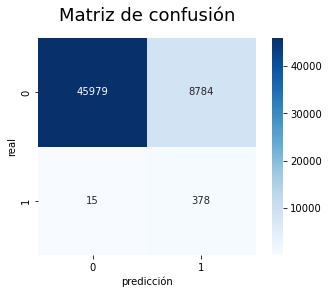



CPU times: user 1.09 s, sys: 77.2 ms, total: 1.17 s
Wall time: 840 ms


In [296]:
%%time

print(Counter(y_train))

#smotenc = SMOTENC(sampling_strategy=0.01, categorical_features=[0, 1,2], random_state=1)
#iht = InstanceHardnessThreshold(random_state=1)
rus = RandomUnderSampler(sampling_strategy=0.01, random_state=1)
pipeline = Pipeline([
#    ('smotenc', smotenc), 
#    ('iht', iht), 
    ('rus', rus)
    ])
X_SMOTENCIHTRUS9, y_SMOTENCIHTRUS9 = pipeline.fit_resample(X_train, y_train)

print(Counter(y_SMOTENCIHTRUS9))
print('\n')

DTC9= DecisionTreeClassifier(random_state=0,
                            max_depth=4,
                            min_samples_split=2,
                            class_weight= 'balanced')

DTC9.fit(X_SMOTENCIHTRUS8, y_SMOTENCIHTRUS8)
    
pred9 = DTC9.predict(X_val)
print("Accuracy: {:.3f}".format(accuracy_score(y_val, pred9)))
print("F1-binary: {:.3f}".format(f1_score(y_val, pred9, average='binary'))) 
print("Recall: {:.3f}".format(recall_score(y_val, pred9))) 

matriz9 = confusion_matrix(y_val, pred9)
sns.heatmap(matriz9, annot=True, fmt="d", cmap='Blues', square=True)
plt.xlabel("predicción")
plt.ylabel("real")
plt.title('Matriz de confusión', y=1.05, size=18)
plt.show()
print('\n')

Accuracy: 0.856
F1-binary: 0.086
Recall: 0.944


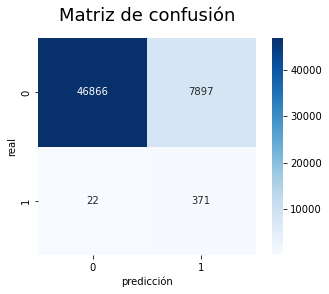



CPU times: user 1.39 s, sys: 77.6 ms, total: 1.47 s
Wall time: 1.19 s


In [295]:
%%time

#print(Counter(y_train))

#smotenc = SMOTENC(sampling_strategy=0.01, categorical_features=[0, 1,2], random_state=1)
#iht = InstanceHardnessThreshold(random_state=1)
#rus = RandomUnderSampler(sampling_strategy=0.1, random_state=1)
#pipeline = Pipeline([
#    ('smotenc', smotenc), 
#    ('iht', iht), 
#    ('rus', rus)
#    ])
#X_SMOTENCIHTRUS9, y_SMOTENCIHTRUS9 = pipeline.fit_resample(X_train, y_train)

#print(Counter(y_SMOTENCIHTRUS9))
#print('\n')

DTC9= DecisionTreeClassifier(random_state=0,
                            max_depth=4,
                            min_samples_split=2,
                            class_weight= 'balanced')

#DTC9.fit(X_SMOTENCIHTRUS8, y_SMOTENCIHTRUS8)
DTC9.fit(X_train, y_train)
    
pred9 = DTC9.predict(X_val)
print("Accuracy: {:.3f}".format(accuracy_score(y_val, pred9)))
print("F1-binary: {:.3f}".format(f1_score(y_val, pred9, average='binary'))) 
print("Recall: {:.3f}".format(recall_score(y_val, pred9))) 

matriz9 = confusion_matrix(y_val, pred9)
sns.heatmap(matriz9, annot=True, fmt="d", cmap='Blues', square=True)
plt.xlabel("predicción")
plt.ylabel("real")
plt.title('Matriz de confusión', y=1.05, size=18)
plt.show()
print('\n')